In [7]:
from matplotlib.ticker import MultipleLocator
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import h5py
import copy
import os 
from matplotlib.ticker import FuncFormatter
import math 

# Data storage prerequisites

- Have folder for data (e.g., OF_CFA)
- If analysing data collected at different dates separated by long stretches of time (e.g., november 2023 and august 2022), store corresponding data in separate folders within the main folder (e.g., OF_CFA/nov2023)
- If multiple sessions of the OF experiment performed (e.g., regular OF and then Novelty/Threat in open arena a day later), store corresponding data in separate folders within the date folder (e.g., OF_CFA/nov2023/OF_reg)
- Store data for individual mice in individual folders (e.g., OF_CFA/nov2023/OF_reg/87L), data should include the interpolated h5 file from DLC and numpy file with timestamps 
- WARNING: code will break if data not stored as described above

# Setting up functions

In [160]:
# Imports h5 files and drops top level in the h5 file for easier indexing

def import_h5(path, date, session, mouse):
    
    h5_file = [os.path.join(root, file)
             for root, dirs, files in os.walk(os.path.join(path, date, session, mouse))
             for file in files
             if (file.endswith('.h5'))] 
    
    df = pd.read_hdf(h5_file[0])
    df.columns = df.columns.droplevel()

    return df

# Imports frametimes from numpy file and calculates minutes (prerequisite: filter df by bodypart creating bodypart_df)

def import_frametimes(path, date, session, mouse, bodypart_df):
    
    npy_files = [os.path.join(root, file)
             for root, dirs, files in os.walk(os.path.join(path, date, session, mouse))
             for file in files
             if (file.endswith('.npy'))]      
    
    npy_file = [file for file in npy_files][0]
    frame_times = np.load(npy_file)

    bodypart_df = bodypart_df.copy()

    bodypart_df["timestamp"] = frame_times
    timestamp_sec = [(bodypart_df["timestamp"][i] - bodypart_df["timestamp"][0]) for i in range(len(bodypart_df))]
    timestamp_min = [i / 60 for i in timestamp_sec]
    bodypart_df["timestamp_min"] = timestamp_min
        
    return bodypart_df

# Performs necessary calculations (speed, distance from centre, time) between consecutive frames of bodypart_df
# Filters out frames where mouse has jumped more than adjustable distance_filter_mm and time_filter_ms in consecutive frames

def bodypart_df_maker(bodypart_df, distance_filter_mm, time_filter_ms):
    
    if session != "OF_threat": 
        bodypart_df = bodypart_df.loc[bodypart_df['timestamp_min'] < experiment_duration]
    bodypart_df = bodypart_df.copy()
    bodypart_df = bodypart_df.loc[bodypart_df["spoof_likelihood"] > likelihood]
    bodypart_df["distance_from_center"] = ((np.sqrt((bodypart_df["x"] - center_x)**2 + (bodypart_df["y"] - center_y)**2))*0.45)/10
    bodypart_df["dt_ms"] = (bodypart_df['timestamp_min']- bodypart_df['timestamp_min'].shift(1))*60000
    bodypart_df["ds_mm"] = (np.sqrt((bodypart_df['x'] - bodypart_df['x'].shift(1))**2 + (bodypart_df['y'] - bodypart_df['y'].shift(1))**2))*0.45
    bodypart_df = bodypart_df.loc[(bodypart_df["ds_mm"] < distance_filter_mm) & (bodypart_df["dt_ms"] < time_filter_ms)]
    bodypart_df["speed_cm_per_s"] = (bodypart_df['ds_mm']/bodypart_df['dt_ms']) *100
    bodypart_df["frame_nr" ]= range(0, len(bodypart_df))

    
    return bodypart_df


# Generates two dataframes containing all the points inside (bodypart_df_in) or outside (bodypart_df_out) a specific ROI by filtering each bodypart position's distance to centre, adjustable with radius_new
# Labels individual pathlengths in order of appearance with function instance_counter defined below


def label_individual_paths(bodypart_df):
    
    bodypart_df_in = bodypart_df.loc[bodypart_df["distance_from_center"] < radius_new]
    bodypart_df_in = instance_counter(bodypart_df_in)
    
    bodypart_df_out = bodypart_df.loc[bodypart_df["distance_from_center"] >= radius_new]
    bodypart_df_out = instance_counter(bodypart_df_out)
    
    return bodypart_df_in, bodypart_df_out


# Labels individual pathlengths in either bodypart_df_in or bodypart_df_out in order of appearance by looking for non-continous frame numbers

def instance_counter(bodypart_df_in_or_out):
    counter = 1
    instance_list = [1]
    
    for i in range(1, len(bodypart_df_in_or_out["frame_nr"])): 
        if bodypart_df_in_or_out["frame_nr"].iloc[i] - bodypart_df_in_or_out["frame_nr"].iloc[i-1] == 1: 
            instance_list.append(counter)
        else: 
            counter +=1
            instance_list.append(counter)
    
    bodypart_df_in_or_out = bodypart_df_in_or_out.copy()

    bodypart_df_in_or_out["instance_nr"] = instance_list
    
    return bodypart_df_in_or_out
    

#  Creates df (pathlength_df) with information on individual pathlengths for either bodypart_df_in or bodypart_df_out 
# In main script pathlength_df from bodypart_df_in labelled as in_df, while pathlength_df from bodypart_df_out labelled as out_df

def pathlength_calculator(bodypart_df_in_or_out): 
    
    instance_counter = []
    
    start_frame = []
    start_time = []
    end_frame = []
    end_time = []
    
    number_of_frames = []

    total_distance_mm = []
    
    duration_s = []

    avg_speed_cm_per_s = []
    
    distance_from_center = []
    
    for i in range(1, max(bodypart_df_in_or_out["instance_nr"]) +1):
        instance_df = bodypart_df_in_or_out.loc[bodypart_df_in_or_out["instance_nr"] == i]
        instance_counter.append(i)
                
        start_frame.append(min(instance_df["frame_nr"]))
        start_time.append(min(instance_df["timestamp_min"]))

        end_frame.append(max(instance_df["frame_nr"]))
        end_time.append(max(instance_df["timestamp_min"]))
        
        number_of_frames.append(len(instance_df))

        total_distance_mm.append(instance_df["ds_mm"].sum())
                
        duration_s.append((max(instance_df["timestamp_min"]) - min(instance_df["timestamp_min"]))*60)
        
        avg_speed_cm_per_s.append(instance_df["speed_cm_per_s"].mean())
        
        distance_from_center.append(instance_df["distance_from_center"].mean())

    pathlength_dict = {"instance_nr": instance_counter, "start_frame": start_frame, "start_time": start_time,
                       "end_frame": end_frame, "end_time": end_time, "number_of_frames": number_of_frames, 
                       "total_distance_mm": total_distance_mm, "duration_s": duration_s, "avg_speed_cm_per_s":avg_speed_cm_per_s, 
                      "distance_from_center":distance_from_center}
    
    pathlength_df = pd.DataFrame(pathlength_dict)
    
    pathlength_df = pathlength_df.loc[pathlength_df["number_of_frames"] > min_points]

    return pathlength_df 


# Labels specific pathlengths for in_df, out_df, or frame_nrs in bodypart_df as specific time intervals by timestamp in column of choice ("end_time" for in_df/out_df; "timestamp_min" for bodypart_df)

def interval_labeller(df, interval, total_time, time_column_name):

    bins = list(range(0, total_time+interval, interval))
    
    interval_labels = []
    
    interval_label = []
    
    interval_nr = list(range(len(bins)-1))

    for i in interval_nr:
        
        if (session == "OF_threat") & (i == interval_nr[-1]):
            interval_df = df.loc[(df[time_column_name] >= bins[i])]
        elif (session != "OF_threat") | (i != interval_nr[-1]): 
            interval_df = df.loc[(df[time_column_name] >= bins[i]) & (df[time_column_name] < bins[i+1])]

        interval_label = [str(bins[i]) + ":" + str(bins[i+1])] * len(interval_df)
        interval_labels = interval_labels + interval_label 

    df = df.copy()
    df["interval"] = interval_labels

    return df


# Speed filters bodypart_df by adjustable min speed,  duration of episodes and with adjustable smooth_window (speed needs to be smoothed as it is too noisy) to remove periods of inactivity/sleep

def speed_filtered_bodypart_df_maker(bodypart_df, speed_limit_cm_per_s, time_limit_s, smooth_window): 
    
    bodypart_df["speed_smooth"] = bodypart_df["speed_cm_per_s"].rolling(window=smooth_window).mean()
    slow_df = bodypart_df.loc[bodypart_df["speed_smooth"] < speed_limit_cm_per_s]
    slow_df = instance_counter(slow_df)
    speed_df = pathlength_calculator(slow_df)
    speed_df = speed_df.loc[speed_df["duration_s"] > time_limit_s]

    indices_list = []
    for i in range(0, len(speed_df)): 
        indices_list = indices_list + list(range(speed_df["start_frame"].iloc[i], speed_df["end_frame"].iloc[i] +1))

    bodypart_df_filtered = bodypart_df[~bodypart_df['frame_nr'].isin(indices_list)]
    bodypart_df_slow = bodypart_df[bodypart_df['frame_nr'].isin(indices_list)]

    return bodypart_df_filtered, bodypart_df_slow

# Generates separate data frames for each 10min subsession of the OF_threat session (bodypart_df_open_arena, bodypart_df_novel, bodypart_df_post_object, bodypart_df_threat)
# Prerequisites 2 dictionaries:
## object_dict: under key for each mouse (e.g., "87L"), contains following keys "start_frame" - frame_nr when novel_object comes in; "end_frame" - frame_nr when object comes out; "invalid_data" - subdictionary containing keys (e.g., "instance_1", "instance_2"), which contain a list of start_frame, end_frame for any time mouse jumped out of arena
## threat_start_dict: under key for each mouse, contains "start_frame" - frame_nr when first threat_tone played in session 

def novel_threat_separator(bodypart_df):

    bodypart_df = bodypart_df.loc[bodypart_df["timestamp_min"] < 40]
    
    indices_list_invalid = []
    if len(object_dict[mouse]) > 2: 
        for instance in object_dict[mouse]["invalid_data"]:
            indices_list_invalid = indices_list_invalid + list(range(object_dict[mouse]["invalid_data"][instance][0], object_dict[mouse]["invalid_data"][instance][1]))
    
    
    bodypart_df = bodypart_df[~bodypart_df['frame_nr'].isin(indices_list_invalid)]
    
    indices_list_open_arena = list(range(0, object_dict[mouse]["start_frame"]))
    bodypart_df_open_arena = bodypart_df[bodypart_df['frame_nr'].isin(indices_list_open_arena)]
    
    indices_list_novel = list(range(object_dict[mouse]["start_frame"], object_dict[mouse]["end_frame"]+1))
    bodypart_df_novel = bodypart_df[bodypart_df['frame_nr'].isin(indices_list_novel)]
    
    indices_list_post_object = list(range(object_dict[mouse]["end_frame"], threat_start_dict[mouse]["start_frame"]+1))
    bodypart_df_post_object = bodypart_df[bodypart_df['frame_nr'].isin(indices_list_post_object)]
    
    indices_list_threat = list(range(threat_start_dict[mouse]["start_frame"], len(bodypart_df) +1))
    bodypart_df_threat = bodypart_df[bodypart_df['frame_nr'].isin(indices_list_threat)]

    return bodypart_df_open_arena, bodypart_df_novel, bodypart_df_post_object, bodypart_df_threat

# Function for plotting averages of 2 different types of variables across the entire session:
## those that can be calculated across the arena (e.g., average speed) will have a y_total_column_name, function will produce 3 barplots 1st plot across entire arena, 2nd plot inside centre area, 3rd plot outside centre area, figsize_1
## those that can only be calculated inside/outsde centre area (total time in/out) will specify y_total_column_name as "None", function will produce 2 barplots: 1st plot inside centre area, 2nd plot outside centre area, figsize_2

# Various basic attributes of final plot (e.g., figsize) can be adjusted by changing the nrs in the total_barplot_dict 
# Attributes more specific to each variable should be adjusted by changing the variables in the function (e.g., y_total_column_name)


def total_time_barplotter(df, y_total_column_name, y_tick_increment_total, y_in_column_name, y_tick_increment_in, 
                          y_out_column_name, y_tick_increment_out, ylabel, xlabel): 
    
    total_barplot_dict = {"df": df, "x": "group_names", "y_total": y_total_column_name, "y_in": y_in_column_name, "y_out": y_out_column_name,
                          "color_total": "rocket_r", "color_in": ["pink", "darkred"], "color_out": ["lightblue", "darkblue"], "edgecolor": "black",
                          "errorbar": "se", "errcolor_total": "black", "errcolor_in": "black", "errcolor_out": "gray", "capsize": 0.05, "errwidth": 2,
                          "figsize_1": (16, 6), 'figsize_2': (14, 6),"ylabel": ylabel, "xlabel": xlabel, "labelsize": 18, 
                          "y_tick_increment_total": y_tick_increment_total, "y_tick_increment_in":y_tick_increment_in, "y_tick_increment_out": y_tick_increment_out,"tick_labelsize": 15}

    if y_total_column_name == "None": 
        
        fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = total_barplot_dict["figsize_2"]) 

        sns.barplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_in"], ax = ax[0],
                errorbar = total_barplot_dict["errorbar"], palette = total_barplot_dict["color_in"], capsize=total_barplot_dict["capsize"], 
                errcolor = total_barplot_dict["errcolor_in"], errwidth = total_barplot_dict["errwidth"], edgecolor = total_barplot_dict["edgecolor"], 
                    order = ["CFA", "Saline"])
        sns.despine(top=True, right=True, ax = ax[0])
        ax[0].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[0].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[0].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[0].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[0].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_in"]))
        ax[0].set_title("In area", fontsize = total_barplot_dict["labelsize"])


        sns.barplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_out"], ax = ax[1],
                    errorbar = total_barplot_dict["errorbar"], palette = total_barplot_dict["color_out"], capsize=total_barplot_dict["capsize"], 
                    errcolor = total_barplot_dict["errcolor_out"], errwidth = total_barplot_dict["errwidth"], edgecolor = total_barplot_dict["edgecolor"], 
                    order = ["CFA", "Saline"])
        sns.despine(top=True, right=True, ax = ax[1])
        ax[1].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[1].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[1].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[1].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[1].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_out"]))
        ax[1].set_title("Out area", fontsize = total_barplot_dict["labelsize"])

        plt.tight_layout()
        plt.show()
    
    else: 
   
        fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = total_barplot_dict["figsize_1"]) 

        sns.barplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_total"], ax = ax[0],
                    errorbar = total_barplot_dict["errorbar"], palette = total_barplot_dict["color_total"], capsize=total_barplot_dict["capsize"], 
                    errcolor = total_barplot_dict["errcolor_total"], errwidth = total_barplot_dict["errwidth"], edgecolor = total_barplot_dict["edgecolor"], 
                   order = ["CFA", "Saline"])
        sns.despine(top=True, right=True, ax = ax[0])
        ax[0].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[0].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[0].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[0].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[0].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_total"]))
        ax[0].set_title("Across arena", fontsize = total_barplot_dict["labelsize"])

        sns.barplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_in"], ax = ax[1],
                    errorbar = total_barplot_dict["errorbar"], palette = total_barplot_dict["color_in"], capsize=total_barplot_dict["capsize"], 
                    errcolor = total_barplot_dict["errcolor_in"], errwidth = total_barplot_dict["errwidth"], edgecolor = total_barplot_dict["edgecolor"], 
                   order = ["CFA", "Saline"])
        sns.despine(top=True, right=True, ax = ax[1])
        ax[1].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[1].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[1].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[1].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[1].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_in"]))
        ax[1].set_title("In area", fontsize = total_barplot_dict["labelsize"])

        sns.barplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_out"], ax = ax[2],
                    errorbar = total_barplot_dict["errorbar"], palette = total_barplot_dict["color_out"], capsize=total_barplot_dict["capsize"], 
                    errcolor = total_barplot_dict["errcolor_out"], errwidth = total_barplot_dict["errwidth"], edgecolor = total_barplot_dict["edgecolor"], 
                   order = ["CFA", "Saline"])
        sns.despine(top=True, right=True, ax = ax[2])
        ax[2].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[2].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[2].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[2].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[2].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_out"]))
        ax[2].set_title("Out area", fontsize = total_barplot_dict["labelsize"])


        plt.tight_layout()
        plt.show()

# Function for plotting averages of 2 different types of variables in specific intervals of the session:
## those that can be calculated across the arena (e.g., average speed) will have a y_total_column_name, function will produce 3 lineplots: 1st plot across entire arena, 2nd plot inside centre area, 3rd plot outside centre area, figsize_1
## those that can only be calculated inside/outsde centre area (total time in/out) will specify y_total_column_name as "None", function will produce 2 lineplots: 1st plot inside centre area, 2nd plot outside centre area, figsize_2

# Various basic attributes of final plot (e.g., figsize) can be adjusted by changing the nrs in the total_barplot_dict 
# Attributes more specific to each variable should be adjusted by changing the variables in the function (e.g., y_total_column_name)

def interval_lineplotter(df, y_total_column_name, y_tick_increment_total, y_in_column_name, y_tick_increment_in, 
                         y_out_column_name, y_tick_increment_out, 
                         ylabel, xlabel, x_major_increment, experiment_duration): 
    
    interval_nr = len(df["interval_names"].unique())
    interval = int(experiment_duration/interval_nr)
    
    x_tick_label_position = list(range(0, interval_nr))
    
    x_tick_labels = list(range(0, experiment_duration, interval))
    
    total_barplot_dict = {"df": df, "x": "interval_names", "y_total": y_total_column_name, "y_in": y_in_column_name, "y_out": y_out_column_name,
                          "hue": "group_names", "color_total": "rocket_r", "color_in": ["pink", "darkred"], "color_out": ["lightblue", "darkblue"], 
                          "markersize": 10, "linewidth": 3.5, "errorbar": "se", "capsize": 4, "err_linewidth": 1, "err_style": "bars", 
                              "figsize_1": (16, 6), 'figsize_2': (14, 6), "ylabel": ylabel, "xlabel": xlabel, "labelsize": 18, 
                              "y_tick_increment_total": y_tick_increment_total, "y_tick_increment_in":y_tick_increment_in, "y_tick_increment_out":y_tick_increment_out,
                          "tick_labelsize": 15, "x_major_increment": x_major_increment}
    
    if y_total_column_name == "None": 

        fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = total_barplot_dict["figsize_2"]) 

        sns.lineplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_in"], ax = ax[0], errorbar = total_barplot_dict["errorbar"], 
                     err_style = total_barplot_dict["err_style"], err_kws={"capsize": total_barplot_dict["capsize"], "linewidth": total_barplot_dict["err_linewidth"], "capthick": total_barplot_dict["err_linewidth"]}, 
                     palette = total_barplot_dict["color_in"], hue = total_barplot_dict["hue"], hue_order = ["CFA", "Saline"], markers=True, marker='o', 
                     markersize=total_barplot_dict["markersize"], linewidth = total_barplot_dict["linewidth"])
        sns.despine(top=True, right=True, ax = ax[0])
        ax[0].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[0].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[0].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[0].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[0].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_in"]))
        ax[0].set_xticks(x_tick_label_position)
        ax[0].set_xticklabels(x_tick_labels)
        ax[0].xaxis.set_major_locator(MultipleLocator(total_barplot_dict["x_major_increment"]))
        ax[0].xaxis.set_minor_locator(MultipleLocator(1))
        ax[0].set_title("In area", fontsize = total_barplot_dict["labelsize"])
        ax[0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2, frameon=False, fontsize = 15)

        sns.lineplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_out"], ax = ax[1], errorbar = total_barplot_dict["errorbar"], 
                     err_style = total_barplot_dict["err_style"], err_kws={"capsize": total_barplot_dict["capsize"], "linewidth": total_barplot_dict["err_linewidth"], "capthick": total_barplot_dict["err_linewidth"]},
                     palette = total_barplot_dict["color_out"], hue = total_barplot_dict["hue"], hue_order = ["CFA", "Saline"], markers=True, marker='o',
                     markersize=total_barplot_dict["markersize"], linewidth = total_barplot_dict["linewidth"])
        sns.despine(top=True, right=True, ax = ax[1])
        ax[1].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[1].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[1].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[1].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[1].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_out"])) 
        ax[1].set_xticks(x_tick_label_position)
        ax[1].set_xticklabels(x_tick_labels)
        ax[1].xaxis.set_major_locator(MultipleLocator(total_barplot_dict["x_major_increment"]))
        ax[1].xaxis.set_minor_locator(MultipleLocator(1))
        ax[1].set_title("Out area", fontsize = total_barplot_dict["labelsize"])
        ax[1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2, frameon=False, fontsize = 15)



        plt.tight_layout()
        plt.show()

        
    else: 

        fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = total_barplot_dict["figsize_1"]) 

        sns.lineplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_total"], ax = ax[0], 
                     errorbar = total_barplot_dict["errorbar"], err_style = total_barplot_dict["err_style"], err_kws={"capsize": total_barplot_dict["capsize"], "linewidth": total_barplot_dict["err_linewidth"], "capthick": total_barplot_dict["err_linewidth"]}, 
                     palette = total_barplot_dict["color_total"], hue = total_barplot_dict["hue"], hue_order = ["CFA", "Saline"], markers=True, marker='o', 
                     markersize=total_barplot_dict["markersize"], linewidth = total_barplot_dict["linewidth"])
        sns.despine(top=True, right=True, ax = ax[0])
        ax[0].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[0].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[0].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[0].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[0].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_total"]))
        ax[0].set_xticks(x_tick_label_position)
        ax[0].set_xticklabels(x_tick_labels)
        ax[0].xaxis.set_major_locator(MultipleLocator(total_barplot_dict["x_major_increment"]))
        ax[0].xaxis.set_minor_locator(MultipleLocator(1))
        ax[0].set_title("Across arena", fontsize = total_barplot_dict["labelsize"])
        ax[0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2, frameon=False, fontsize = 15)

        sns.lineplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_in"], ax = ax[1], 
                     errorbar = total_barplot_dict["errorbar"], err_style = total_barplot_dict["err_style"], err_kws={"capsize": total_barplot_dict["capsize"], "linewidth": total_barplot_dict["err_linewidth"], "capthick": total_barplot_dict["err_linewidth"]}, 
                     palette = total_barplot_dict["color_in"], hue = total_barplot_dict["hue"], hue_order = ["CFA", "Saline"], markers=True, marker='o', 
                     markersize=total_barplot_dict["markersize"], linewidth = total_barplot_dict["linewidth"])
        sns.despine(top=True, right=True, ax = ax[1])
        ax[1].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[1].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[1].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[1].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[1].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_in"]))
        ax[1].set_xticks(x_tick_label_position)
        ax[1].set_xticklabels(x_tick_labels)
        ax[1].xaxis.set_major_locator(MultipleLocator(total_barplot_dict["x_major_increment"]))
        ax[1].xaxis.set_minor_locator(MultipleLocator(1))
        ax[1].set_title("In area", fontsize = total_barplot_dict["labelsize"])
        ax[1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2, frameon=False, fontsize = 15)

        sns.lineplot(data = total_barplot_dict["df"], x = total_barplot_dict["x"], y= total_barplot_dict["y_out"], ax = ax[2], 
                     errorbar = total_barplot_dict["errorbar"], err_style = total_barplot_dict["err_style"], err_kws={"capsize": total_barplot_dict["capsize"], "linewidth": total_barplot_dict["err_linewidth"], "capthick": total_barplot_dict["err_linewidth"]}, 
                     palette = total_barplot_dict["color_out"], hue = total_barplot_dict["hue"], hue_order = ["CFA", "Saline"], markers=True, marker='o', 
                     markersize=total_barplot_dict["markersize"], linewidth = total_barplot_dict["linewidth"])
        sns.despine(top=True, right=True, ax = ax[2])
        ax[2].set_xlabel(total_barplot_dict["xlabel"], fontsize = total_barplot_dict["labelsize"])
        ax[2].set_ylabel(total_barplot_dict["ylabel"], fontsize = total_barplot_dict["labelsize"])
        ax[2].tick_params(axis='y', labelsize=total_barplot_dict["tick_labelsize"])
        ax[2].tick_params(axis='x', labelsize=total_barplot_dict["tick_labelsize"])
        ax[2].yaxis.set_major_locator(MultipleLocator(base=total_barplot_dict["y_tick_increment_out"])) 
        ax[2].set_xticks(x_tick_label_position)
        ax[2].set_xticklabels(x_tick_labels)
        ax[2].xaxis.set_major_locator(MultipleLocator(total_barplot_dict["x_major_increment"]))
        ax[2].xaxis.set_minor_locator(MultipleLocator(1))
        ax[2].set_title("Out area", fontsize = total_barplot_dict["labelsize"])
        ax[2].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2, frameon=False, fontsize = 15)



        plt.tight_layout()
        plt.show()
    
# Function for plotting averages of 2 different types of variables across the 4 subsessions of OF_threat:
## those that can be calculated across the arena (e.g., average speed) will have a y_total_column_name, function will produce 3 rows of 4 barplots: 1st row will contain variables for the different sessions calculated across entire arena, 2nd row calculated across inside centre area, 3rd row calculated across outside centre area
## those that can only be calculated inside/outsde centre area (total time in/out) will specify y_total_column_name as "None", function will produce 2 rows of 4 barplots: 1st row will contain variables for the different sessions calculated across inside centre area, 2nd plot calculated across outside centre area

# Attributes more specific to each variable should be adjusted by changing the variables in the function (e.g., total_column_name)

def total_barplotter_all_OF_threat(total_column_name, in_column_name, out_column_name, xlabel, ylabel, y_total_major_tick, y_in_major_tick, y_out_major_tick, total_ylim, in_ylim, out_ylim):
        
    if total_column_name == "None": 
    
        fig, ax = plt.subplots(nrows = 2, ncols = 4, figsize = (14, 8))
        for i, epoch in enumerate(object_result_dict):

            sns.barplot(data = object_result_dict[epoch]["total_df"], x = "group_names", y= in_column_name, ax = ax[0, i],
                        errorbar = "se", palette = ["pink", "darkred"], capsize=0.1, errcolor = "black", errwidth = 1, 
                        edgecolor = "black", order = ["CFA", "Saline"])
            sns.despine(top=True, right=True, ax = ax[0, i])
            ax[0, i].set_xlabel(xlabel, fontsize = 16)
            ax[0, i].set_ylabel(ylabel, fontsize = 16)
            ax[0, i].set_ylim(0, in_ylim)
            ax[0, i].tick_params(axis='y', labelsize=14)
            ax[0, i].tick_params(axis='x', labelsize=14)
            ax[0, i].set_title(epoch)
            ax[0, i].yaxis.set_major_locator(MultipleLocator(base=y_in_major_tick))
            
            sns.barplot(data = object_result_dict[epoch]["total_df"], x = "group_names", y= out_column_name, ax = ax[1, i],
                        errorbar = "se", palette = ["lightblue", "darkblue"], capsize=0.1, errcolor = "gray", errwidth = 1, 
                        edgecolor = "black", order = ["CFA", "Saline"])
            sns.despine(top=True, right=True, ax = ax[1, i])
            ax[1, i].set_xlabel(xlabel, fontsize = 16)
            ax[1, i].set_ylabel(ylabel, fontsize = 16)
            ax[1, i].set_ylim(0, out_ylim)
            ax[1, i].set_title(epoch)
            ax[1, i].tick_params(axis='y', labelsize=14)
            ax[1, i].tick_params(axis='x', labelsize=14)
            ax[1, i].yaxis.set_major_locator(MultipleLocator(base=y_out_major_tick))

            
        plt.tight_layout()
        plt.show()

    else: 
        
        fig, ax = plt.subplots(nrows = 3, ncols = 4, figsize = (14, 12))
        
        for i, epoch in enumerate(object_result_dict):

            sns.barplot(data = object_result_dict[epoch]["total_df"], x = "group_names", y= total_column_name, ax = ax[0, i],
                        errorbar = "se", palette = "rocket_r", capsize=0.1, errcolor = "black", errwidth = 1, 
                        edgecolor = "black", order = ["CFA", "Saline"])
            sns.despine(top=True, right=True, ax = ax[0, i])
            ax[0, i].set_xlabel(xlabel, fontsize = 16)
            ax[0, i].set_ylabel(ylabel, fontsize = 16)
            ax[0, i].set_ylim(0, total_ylim)
            ax[0, i].set_title(epoch)
            ax[0, i].tick_params(axis='y', labelsize=14)
            ax[0, i].tick_params(axis='x', labelsize=14)
            ax[0, i].yaxis.set_major_locator(MultipleLocator(base=y_total_major_tick))

            sns.barplot(data = object_result_dict[epoch]["total_df"], x = "group_names", y= in_column_name, ax = ax[1, i],
                        errorbar = "se", palette = ["pink", "darkred"], capsize=0.1, errcolor = "black", errwidth = 1, 
                        edgecolor = "black", order = ["CFA", "Saline"])
            sns.despine(top=True, right=True, ax = ax[1, i])
            ax[1, i].set_xlabel(xlabel, fontsize = 16)
            ax[1, i].set_ylabel(ylabel, fontsize = 16)
            ax[1, i].set_ylim(0, in_ylim)
            ax[1, i].set_title(epoch)
            ax[1, i].tick_params(axis='y', labelsize=14)
            ax[1, i].tick_params(axis='x', labelsize=14)
            ax[1, i].yaxis.set_major_locator(MultipleLocator(base=y_in_major_tick))

            sns.barplot(data = object_result_dict[epoch]["total_df"], x = "group_names", y= out_column_name, ax = ax[2, i],
                        errorbar = "se", palette = ["lightblue", "darkblue"], capsize=0.1, errcolor = "gray", errwidth = 1, 
                        edgecolor = "black", order = ["CFA", "Saline"])
            sns.despine(top=True, right=True, ax = ax[2, i])
            ax[2, i].set_xlabel(xlabel, fontsize = 16)
            ax[2, i].set_ylabel(ylabel, fontsize = 16)
            ax[2, i].set_ylim(0, out_ylim)
            ax[2, i].set_title(epoch)
            ax[2, i].tick_params(axis='y', labelsize=14)
            ax[2, i].tick_params(axis='x', labelsize=14)
            ax[2, i].yaxis.set_major_locator(MultipleLocator(base=y_out_major_tick))
        plt.tight_layout()
        plt.show()



# Function for plotting averages of 2 different types of variables in specific intervals of all of the 4 subsessions of OF_threat:
# those that can be calculated across the arena (e.g., average speed) will have a y_total_column_name, function will produce 3 rows of 4 lineplots : 1st row will contain variables for the different sessions calculated across entire arena, 2nd row calculated across inside centre area, 3rd row calculated across outside centre area
## those that can only be calculated inside/outsde centre area (total time in/out) will specify y_total_column_name as "None", function will produce 2 rows of 4 lineplots: 1st row will contain variables for the different sessions calculated across inside centre area, 2nd plot calculated across outside centre area

# Attributes more specific to each variable should be adjusted by changing the variables in the function (e.g., total_column_name)


def total_lineplotter_all_OF_threat(total_column_name, in_column_name, out_column_name, 
                                    xlabel, ylabel, 
                                    y_total_major_tick, total_ylim,
                                    y_in_major_tick, in_ylim,
                                    y_out_major_tick, out_ylim):
        
    if total_column_name == "None": 
    
        fig, ax = plt.subplots(nrows = 2, ncols = 4, figsize = (16, 10))
        x_tick_labels = list(range(0, 10, 1))

        for i, epoch in enumerate(object_result_dict):

            sns.lineplot(data = object_result_dict[epoch]["interval_df"], x = "interval_names", y= in_column_name, ax = ax[0, i],
                errorbar = "se", err_style = "bars", err_kws={"capsize": 3, "linewidth": 1, "capthick": 1},
                 palette = ["pink", "darkred"], hue = "group_names",  linewidth = 2, markers = True, markersize = 6, marker = "o")
            sns.despine(top=True, right=True, ax = ax[0, i])
            ax[0, i].set_xlabel(xlabel, fontsize = 16)
            ax[0, i].set_ylabel(ylabel, fontsize = 16)
            ax[0, i].set_ylim(in_ylim)
            ax[0, i].set_title(epoch)
            ax[0, i].set_xticks(x_tick_labels)
            ax[0, i].set_xticklabels(x_tick_labels)
            ax[0, i].tick_params(axis='y', labelsize=14)
            ax[0, i].tick_params(axis='x', labelsize=14)
            ax[0, i].yaxis.set_major_locator(MultipleLocator(base=y_in_major_tick))
            ax[0, i].legend(loc='upper center', bbox_to_anchor=(0.5, 1.3), ncol=2, frameon=False, fontsize = 15)

            sns.lineplot(data = object_result_dict[epoch]["interval_df"], x = "interval_names", y= out_column_name, ax = ax[1, i],
                        errorbar = "se", err_style = "bars", err_kws={"capsize": 3, "linewidth": 1, "capthick": 1},
                         palette = ["lightblue", "darkblue"], hue = "group_names",  linewidth = 2, markers = True, markersize = 6, marker = "o")
            sns.despine(top=True, right=True, ax = ax[1, i])
            ax[1, i].set_xlabel(xlabel, fontsize = 16)
            ax[1, i].set_ylabel(ylabel, fontsize = 16)
            ax[1, i].set_ylim(out_ylim)
            ax[1, i].set_title(epoch)
            ax[1, i].set_xticks(x_tick_labels)
            ax[1, i].set_xticklabels(x_tick_labels)
            ax[1, i].tick_params(axis='y', labelsize=14)
            ax[1, i].tick_params(axis='x', labelsize=14)
            ax[1, i].legend(loc='upper center', bbox_to_anchor=(0.5, 1.30), ncol=2, frameon=False, fontsize = 15)
            
        plt.tight_layout()
        plt.show()

    else: 
        
        fig, ax = plt.subplots(nrows = 3, ncols = 4, figsize = (16, 13))
        x_tick_labels = list(range(0, 10, 1))

        for i, epoch in enumerate(object_result_dict):


            
            sns.lineplot(data = object_result_dict[epoch]["interval_df"], x = "interval_names", y= total_column_name, ax = ax[0, i],
                errorbar = "se", err_style = "bars", err_kws={"capsize": 3, "linewidth": 1, "capthick": 1},
                 palette = "rocket_r", hue = "group_names",  linewidth = 2, markers = True, markersize = 6, marker = "o")
            sns.despine(top=True, right=True, ax = ax[0, i])
            ax[0, i].set_xlabel(xlabel, fontsize = 16)
            ax[0, i].set_ylabel(ylabel, fontsize = 16)
            ax[0, i].set_ylim(total_ylim)
            ax[0, i].set_title(epoch)
            ax[0, i].set_xticks(x_tick_labels)
            ax[0, i].set_xticklabels(x_tick_labels)
            ax[0, i].tick_params(axis='y', labelsize=14)
            ax[0, i].tick_params(axis='x', labelsize=14)
            ax[0, i].yaxis.set_major_locator(MultipleLocator(base=y_total_major_tick))
            ax[0, i].legend(loc='upper center', bbox_to_anchor=(0.5, 1.3), ncol=2, frameon=False, fontsize = 15)
            
            sns.lineplot(data = object_result_dict[epoch]["interval_df"], x = "interval_names", y= in_column_name, ax = ax[1, i],
                errorbar = "se", err_style = "bars", err_kws={"capsize": 3, "linewidth": 1, "capthick": 1},
                 palette = ["pink", "darkred"], hue = "group_names",  linewidth = 2, markers = True, markersize = 6, marker = "o")
            sns.despine(top=True, right=True, ax = ax[1, i])
            ax[1, i].set_xlabel(xlabel, fontsize = 16)
            ax[1, i].set_ylabel(ylabel, fontsize = 16)
            ax[1, i].set_ylim(in_ylim)
            ax[1, i].set_title(epoch)
            ax[1, i].set_xticks(x_tick_labels)
            ax[1, i].set_xticklabels(x_tick_labels)
            ax[1, i].tick_params(axis='y', labelsize=14)
            ax[1, i].tick_params(axis='x', labelsize=14)
            ax[1, i].yaxis.set_major_locator(MultipleLocator(base=y_in_major_tick))
            ax[1, i].legend(loc='upper center', bbox_to_anchor=(0.5, 1.3), ncol=2, frameon=False, fontsize = 15)
            
            sns.lineplot(data = object_result_dict[epoch]["interval_df"], x = "interval_names", y= out_column_name, ax = ax[2, i],
                        errorbar = "se", err_style = "bars", err_kws={"capsize": 3, "linewidth": 1, "capthick": 1},
                         palette = ["lightblue", "darkblue"], hue = "group_names",  linewidth = 2, markers = True, markersize = 6, marker = "o")
            sns.despine(top=True, right=True, ax = ax[2, i])
            ax[2, i].set_xlabel(xlabel, fontsize = 16)
            ax[2, i].set_ylabel(ylabel, fontsize = 16)
            ax[2, i].set_ylim(out_ylim)
            ax[2, i].set_title(epoch)
            ax[2, i].set_xticks(x_tick_labels)
            ax[2, i].set_xticklabels(x_tick_labels)
            ax[2, i].tick_params(axis='y', labelsize=14)
            ax[2, i].tick_params(axis='x', labelsize=14)
            ax[2, i].yaxis.set_major_locator(MultipleLocator(base=y_out_major_tick))
            ax[2, i].legend(loc='upper center', bbox_to_anchor=(0.5, 1.3), ncol=2, frameon=False, fontsize = 15)
            
        plt.tight_layout()
        plt.show()

# Used to label OF_threat subsessions to compile them back into one large df

def session_label_adder(df, label): 
    df = df.copy()
    session_label = [label for x in range(len(df))]
    df["session"] = session_label
    
    return df


# Setting up lists and dictionaries

In [44]:

#Generating list with the names of individual mice in the nov2023 experiments

earcodes = ["L", "LL", "R", "RR"]
numbers = ["87", "88", "89", "90"]
mouse_list_nov = []
for number in numbers:
    for earcode in earcodes: 
        mouse_list_nov.append(number+earcode)
        
#Generating list with the names of individual mice in the aug2022 experiments

mouse_list_aug = []
for i in range(1, 9):
    mouse_list_aug.append("m"+str(i))

#Setting up dictionary for when object comes in and is removed (manually entered, could be automated probably)

object_dict = {}
for mouse in mouse_list_nov: 
    object_dict[mouse] = {"start_frame":[], "end_frame":[]}
    

object_dict["89L"]["start_frame"] = 18732
object_dict["89L"]["end_frame"] = 36779

object_dict["89LL"]["start_frame"] = 18586
object_dict["89LL"]["end_frame"]= 36573

object_dict["89R"]["start_frame"] = 18518
object_dict["89R"]["end_frame"]= 36526

object_dict["89RR"]["start_frame"] = 18613
object_dict["89RR"]["end_frame"]= 36582


object_dict["90L"]["start_frame"] = 18552
object_dict["90L"]["end_frame"]= 36621
object_dict["90L"]["invalid_data"] = {"instance_1": [34476, 35127], "instance_2": [38183, 38399]}

object_dict["90LL"]["start_frame"] = 18592
object_dict["90LL"]["end_frame"]= 36526

object_dict["90R"]["start_frame"] = 18589
object_dict["90R"]["end_frame"]= 36514

object_dict["90RR"]["start_frame"] = 18606
object_dict["90RR"]["end_frame"]= 36551


object_dict["87L"]["start_frame"] = 18609
object_dict["87L"]["end_frame"] = 36574

object_dict["87LL"]["start_frame"] = 18573
object_dict["87LL"]["end_frame"]= 36627

object_dict["87R"]["start_frame"] = 18670
object_dict["87R"]["end_frame"]= 36617

object_dict["87RR"]["start_frame"] = 18591
object_dict["87RR"]["end_frame"]= 36581


object_dict["88L"]["start_frame"] = 18967
object_dict["88L"]["end_frame"]= 37020
object_dict["88L"]["invalid_data"] = {"instance_1": [0, 197]}

object_dict["88LL"]["start_frame"] = 18955
object_dict["88LL"]["end_frame"]= 36921

object_dict["88R"]["start_frame"] = 18601
object_dict["88R"]["end_frame"]= 36575

object_dict["88RR"]["start_frame"] = 18577
object_dict["88RR"]["end_frame"]= 36540

#Setting up dictionary for when threat tone comes on for the first time

threat_start_df = pd.read_csv("/Users/annam/Desktop/Rotation1/threat_start.csv")
threat_start_dict = {}
for mouse in mouse_list_nov: 
    
    threat_start_dict[mouse] = {"start_frame":threat_start_df.loc[threat_start_df["Mouse_ID"] == mouse]["Start_frame"].iloc[0]}

    
# Set up dictionary containing information about each session including the interval duration, center coordinates

data_dict = {"nov2023": {"mice": mouse_list_nov, "sessions": {"OF_reg": {"duration": 45, "interval": 5}, 
                                                              "OF_threat": {"duration": 10, "interval": 1}}, 
                         "Groups": {"CFA": ["90L", "90RR", "89R", "89LL", "88LL", "88R", "87RR", "87L"], 
                                    "Saline": ["90R", "90LL", "89RR", "89L", "88RR", "88L", "87R", "87LL"]},
                         "center_x": 710, "center_y": 610},
             
             "aug2022": {"mice": mouse_list_aug, "sessions": {"habituation":{"duration": 15, "interval": 1, "center_x": 735, "center_y":625}, 
                                                              "experiment":{"duration": 45, "interval": 5,  "center_x": 735, "center_y":625}}, 
                         "Groups": {"CFA": ["m2", "m4", "m6", "m7"], 
                                    "Saline": ["m1", "m3", "m5", "m8"]}, 
                         "center_x": 735, "center_y": 625}}

# Regular Open Field analysis (includes open arena subsession of OF_threat session)

In [39]:
path = '/Users/annam/Desktop/OF_CFA'


# Filtering bodypart_df
likelihood = 0
bodypart = "tail_base"
radius_new = 12.5
distance_filter_mm = 22.5 
time_filter_ms = 100

#Filtering in_df/out_df (for code to work min_points has to be at least 1)
min_points = 1

#Filtering for speed & duration of slow speed episodes
smooth_window = 20 
speed_limit_cm_per_s = 2
time_limit_s = 10

# Set up result_dict for storage of analysis across all sessions performed
result_dict = {"nov2023": {"sessions": 
                           
                           {"OF_reg": 
                            
                            {"X_Y_coordinates_allmice": {"total": {"x": [], "y": []}, "CFA": {"x": [], "y": []}, "Saline": {"x": [], "y": []}}, 
                             "distance_to_center_allmice": {"total": [], "CFA": [], "Saline": []}, 
                             "speed_allmice":{"total": [], "CFA": [], "Saline": []},
                             "total_df": [], "interval_df": [],
                             "mouse_dict": {"90L": {}, "90RR": {}, "89R":{}, "89LL": {}, "88LL": {}, "88R": {}, 
                                            "87RR":{}, "87L":{}, "90R":{}, "90LL":{}, "89RR":{}, "89L":{}, 
                                            "88RR":{}, "88L":{}, "87R":{}, "87LL":{}}}, 
                            
                            "OF_threat":
                            {"X_Y_coordinates_allmice": {"total": {"x": [], "y": []}, "CFA": {"x": [], "y": []}, "Saline": {"x": [], "y": []}}, 
                             "distance_to_center_allmice":{"total": [], "CFA": [], "Saline": []},
                             "speed_allmice":{"total": [], "CFA": [], "Saline": []},
                             "total_df": [], "interval_df": [], 
                             "mouse_dict": {"90L": {}, "90RR": {}, "89R":{}, "89LL": {}, "88LL": {}, "88R": {}, 
                                            "87RR":{}, "87L":{}, "90R":{}, "90LL":{}, "89RR":{}, "89L":{}, 
                                            "88RR":{}, "88L":{}, "87R":{}, "87LL":{}}}
                           }
                          },
               
              "aug2022": {"sessions": 
                          
                          {"habituation": 
                           
                           {"X_Y_coordinates_allmice": {"total": {"x": [], "y": []}, "CFA": {"x": [], "y": []}, "Saline": {"x": [], "y": []}}, 
                            "distance_to_center_allmice": {"total": [], "CFA": [], "Saline": []}, 
                            "speed_allmice":{"total": [], "CFA": [], "Saline": []},
                            "total_df": [], "interval_df": [],
                            "mouse_dict": {"m1": {}, "m2": {}, "m3":{}, "m4": {}, "m5": {}, "m6": {}, 
                                            "m7":{}, "m8":{}}}, 
                           
                           "experiment": 
                           
                           {"X_Y_coordinates_allmice": {"total": {"x": [], "y": []}, "CFA": {"x": [], "y": []}, "Saline": {"x": [], "y": []}}, 
                            "distance_to_center_allmice": {"total": [], "CFA": [], "Saline": []}, 
                            "speed_allmice":{"total": [], "CFA": [], "Saline": []}, 
                            "total_df": [], "interval_df": [],
                            "mouse_dict": {"m1": {}, "m2": {}, "m3":{}, "m4": {}, "m5": {}, "m6": {}, 
                                            "m7":{}, "m8":{}}}
                          }
                         }
              }




for date in data_dict:
    for session in data_dict[date]["sessions"]: 
        print(session)
        
         # Set up lists for making total_df, which will contain averages/sums of variables (e.g., average speed) for each mouse across session
        mouse_names = []
        group_names = []

        average_speed_total = []
        average_distance_to_center = []
        
        distance_total = []

        in_distance_total = []
        out_distance_total = []

        in_time_total = []
        out_time_total = []

        in_average_speed_total = []
        out_average_speed_total = []

        in_nr_of_trials = []
        out_nr_of_trials = []
        
        in_average_pathlength_mm = []
        out_average_pathlength_mm = []
        
        in_average_pathlength_duration_s = []
        out_average_pathlength_duration_s = []
        
        in_average_distance_to_center = []
        out_average_distance_to_center = []


        # Set up lists for making interval_df, which will contain averages/sums of variables (e.g., average speed) for each mouse across intervals of the session 

        interval_names = []
        interval_mouse_names = []
        interval_group_names = []
        interval_speed_total = []
        interval_distance_total = []
        interval_distance_to_center = []

        in_interval_distance_total = []
        out_interval_distance_total = []

        in_interval_time_total = []
        out_interval_time_total = []

        in_interval_average_speed_total = []
        out_interval_average_speed_total = []

        in_interval_duration = []
        out_interval_duration = []

        in_nr_of_trials = []
        out_nr_of_trials = []
        
        in_interval_nr_of_trials = []
        out_interval_nr_of_trials = []
        
        in_interval_average_pathlength_mm = []
        out_interval_average_pathlength_mm = []
        
        in_interval_distance_to_center = []
        out_interval_distance_to_center = []
        

        for mouse in data_dict[date]["mice"]:
            
            center_x = data_dict[date]["center_x"]
            center_y = data_dict[date]["center_y"]

            experiment_duration = data_dict[date]["sessions"][session]["duration"]
            interval = data_dict[date]["sessions"][session]["interval"]
            
            interval_bins = list(range(0, experiment_duration+interval, interval))
            interval_list = [str(interval_bins[i]) + ":" + str(interval_bins[i+1]) for i in range(len(interval_bins)-1)]
                        
            
            df = import_h5(path, date, session, mouse)
            
            bodypart_df = df[bodypart]
            bodypart_df = bodypart_df.copy()
            bodypart_df["frame_nr"] = list(range(0, len(bodypart_df)))
            bodypart_df = import_frametimes(path, date, session, mouse, bodypart_df)
            
            # stores the other 3 subsessions of OF_threat besides open_arena under the "mouse_dict" key in the results_dict where they can be accessed later
            if session == "OF_threat": 
                bodypart_df_open_arena, bodypart_df_novel, bodypart_df_post_object, bodypart_df_threat = novel_threat_separator(bodypart_df)
                
                bodypart_df = bodypart_df_open_arena.copy()
                result_dict[date]["sessions"][session]["mouse_dict"][mouse]["bodypart_df_novel"] = bodypart_df_novel
                result_dict[date]["sessions"][session]["mouse_dict"][mouse]["bodypart_df_post_object"] = bodypart_df_post_object
                result_dict[date]["sessions"][session]["mouse_dict"][mouse]["bodypart_df_threat"] = bodypart_df_threat



            bodypart_df = bodypart_df_maker(bodypart_df, distance_filter_mm, time_filter_ms)
            bodypart_df = interval_labeller(bodypart_df, interval, experiment_duration, "timestamp_min")
            
            # Remove # if speed filtering is necessary 
            # bodypart_df, bodypart_df_slow = speed_filtered_bodypart_df_maker(bodypart_df, speed_limit_cm_per_s, time_limit_s, smooth_window)

            result_dict[date]["sessions"][session]["mouse_dict"][mouse]["bodypart_df"] = bodypart_df
            
            # Remove # if df containing only the frames removed by the speed filtering needs to be stored
            # result_dict[date]["sessions"][session]["mouse_dict"][mouse]["bodypart_df_slow"] = bodypart_df_slow

#           # stores X, Y coordinates and distance_to_centre for all mice, CFA or Saline mice in mouse_dict, accessed later for generating heatmaps across session and distance_to_centre histograms, respectively
            result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["total"]["x"] = result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["total"]["x"] + bodypart_df["x"].tolist()
            result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["total"]["y"] = result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["total"]["y"] + bodypart_df["y"].tolist()
            result_dict[date]["sessions"][session]["distance_to_center_allmice"]["total"] = result_dict[date]["sessions"][session]["distance_to_center_allmice"]["total"] + bodypart_df["distance_from_center"].tolist()
            result_dict[date]["sessions"][session]["speed_allmice"]["total"] = result_dict[date]["sessions"][session]["speed_allmice"]["total"] + bodypart_df["speed_cm_per_s"].tolist()

            if mouse in data_dict[date]["Groups"]["CFA"]: 
                result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["CFA"]["x"] = result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["CFA"]["x"] + bodypart_df["x"].tolist()
                result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["CFA"]["y"] = result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["CFA"]["y"] + bodypart_df["y"].tolist()
                result_dict[date]["sessions"][session]["distance_to_center_allmice"]["CFA"] = result_dict[date]["sessions"][session]["distance_to_center_allmice"]["CFA"] + bodypart_df["distance_from_center"].tolist()
                result_dict[date]["sessions"][session]["speed_allmice"]["CFA"] = result_dict[date]["sessions"][session]["speed_allmice"]["CFA"] + bodypart_df["speed_cm_per_s"].tolist()
                group_names.append("CFA")
                
            elif mouse in data_dict[date]["Groups"]["Saline"]:
                result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["Saline"]["x"] = result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["Saline"]["x"] + bodypart_df["x"].tolist()
                result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["Saline"]["y"] = result_dict[date]["sessions"][session]["X_Y_coordinates_allmice"]["Saline"]["y"] + bodypart_df["y"].tolist()
                result_dict[date]["sessions"][session]["distance_to_center_allmice"]["Saline"] = result_dict[date]["sessions"][session]["distance_to_center_allmice"]["Saline"] + bodypart_df["distance_from_center"].tolist()
                result_dict[date]["sessions"][session]["speed_allmice"]["Saline"] = result_dict[date]["sessions"][session]["speed_allmice"]["Saline"] + bodypart_df["speed_cm_per_s"].tolist()
                group_names.append("Saline")

            
            bodypart_df_in, bodypart_df_out = label_individual_paths(bodypart_df)
            in_df, out_df = pathlength_calculator(bodypart_df_in), pathlength_calculator(bodypart_df_out)
            in_df, out_df = interval_labeller(in_df, interval, experiment_duration, "end_time"), interval_labeller(out_df, interval, experiment_duration, "end_time")
           
            #Stores pathlengths performed outside and inside centre area in mouse_dict, for access if needed 
            
            result_dict[date]["sessions"][session]["mouse_dict"][mouse]["in_df"] = in_df
            result_dict[date]["sessions"][session]["mouse_dict"][mouse]["out_df"] = out_df
            
            
            # Collect data for total_df 
            mouse_names.append(mouse)
    
            average_speed_total.append(bodypart_df["speed_cm_per_s"].mean())

            distance_total.append(bodypart_df["ds_mm"].sum()/1000)

            average_distance_to_center.append(bodypart_df["distance_from_center"].mean())

            in_distance_total.append(in_df["total_distance_mm"].sum()/1000)
            out_distance_total.append(out_df["total_distance_mm"].sum()/1000)

            in_time_total.append(in_df["duration_s"].sum()/60)
            out_time_total.append(out_df["duration_s"].sum()/60)

            in_average_speed_total.append(in_df["avg_speed_cm_per_s"].mean())
            out_average_speed_total.append(out_df["avg_speed_cm_per_s"].mean())
            
            in_nr_of_trials.append(len(in_df))
            out_nr_of_trials.append(len(out_df))

            in_average_pathlength_mm.append(in_df["total_distance_mm"].mean())
            out_average_pathlength_mm.append(out_df["total_distance_mm"].mean())
            
            in_average_pathlength_duration_s.append(in_df["duration_s"].mean())
            out_average_pathlength_duration_s.append(out_df["duration_s"].mean())
            
            in_average_distance_to_center.append(in_df["distance_from_center"].mean())
            out_average_distance_to_center.append(out_df["distance_from_center"].mean())

            # Collect data for interval_df 

            for interval_1 in interval_list:   
        
                interval_names.append(interval_1)
                interval_mouse_names.append(mouse)

                if mouse in data_dict[date]["Groups"]["CFA"]: 
                    interval_group_names.append("CFA")
                elif mouse in data_dict[date]["Groups"]["Saline"]: 
                    interval_group_names.append("Saline")

                interval_df = bodypart_df.loc[bodypart_df["interval"] == interval_1]

                interval_speed_total.append(interval_df["speed_cm_per_s"].mean())

                interval_distance_total.append(interval_df["ds_mm"].sum()/1000)

                interval_distance_to_center.append(interval_df["distance_from_center"].mean())

                in_interval_df = in_df.loc[in_df["interval"] == interval_1]
                out_interval_df = out_df.loc[out_df["interval"] == interval_1]

                in_interval_distance_total.append(in_interval_df["total_distance_mm"].sum()/1000)
                out_interval_distance_total.append(out_interval_df["total_distance_mm"].sum()/1000)

                in_interval_time_total.append(in_interval_df["duration_s"].sum()/60)
                out_interval_time_total.append(out_interval_df["duration_s"].sum()/60)

                in_interval_duration.append(in_interval_df["duration_s"].mean())
                out_interval_duration.append(out_interval_df["duration_s"].mean())

                in_interval_average_speed_total.append(in_interval_df["avg_speed_cm_per_s"].mean())
                out_interval_average_speed_total.append(out_interval_df["avg_speed_cm_per_s"].mean())
                
                in_interval_nr_of_trials.append(len(in_interval_df))
                out_interval_nr_of_trials.append(len(out_interval_df))

                in_interval_average_pathlength_mm.append(in_interval_df["total_distance_mm"].mean())
                out_interval_average_pathlength_mm.append(out_interval_df["total_distance_mm"].mean())
                
                in_interval_distance_to_center.append(in_interval_df["distance_from_center"].mean())
                out_interval_distance_to_center.append(out_interval_df["distance_from_center"].mean())


                
            print(mouse+" done")
                
        # Create total_df and store it in results_dict
        total_dict = {"mouse_names":mouse_names, "group_names":group_names, "average_speed_total":average_speed_total, "in_average_speed_total":in_average_speed_total, "out_average_speed_total":out_average_speed_total, 
                      "distance_total": distance_total, "in_distance_total":in_distance_total, "out_distance_total":out_distance_total, 
                      "in_time_total":in_time_total, "out_time_total":out_time_total, 
                      "in_nr_of_trials":in_nr_of_trials, "out_nr_of_trials":out_nr_of_trials, 
                      "in_average_pathlength_mm":in_average_pathlength_mm, "out_average_pathlength_mm":out_average_pathlength_mm, 
                      "average_distance_to_center":average_distance_to_center, "in_average_distance_to_center":in_average_distance_to_center, "out_average_distance_to_center": out_average_distance_to_center,
                      "in_average_pathlength_duration_s": in_average_pathlength_duration_s, "out_average_pathlength_duration_s": out_average_pathlength_duration_s}

        total_df = pd.DataFrame(total_dict)
        
        result_dict[date]["sessions"][session]["total_df"] = total_df

        # Create interval_df and store it in results_dict
        interval_dict = {"interval_names":interval_names, "mouse_names":interval_mouse_names, "group_names":interval_group_names, 
                         "interval_speed_total":interval_speed_total, "in_interval_speed_total":in_interval_average_speed_total, "out_interval_speed_total":out_interval_average_speed_total, 
                         "interval_distance_total":interval_distance_total, "in_interval_distance_total":in_interval_distance_total, "out_interval_distance_total":out_interval_distance_total, 
                         "in_interval_time_total" :in_interval_time_total, "out_interval_time_total":out_interval_time_total, 
                         "in_interval_duration":in_interval_duration, "out_interval_duration":out_interval_duration, 
                         "interval_distance_to_center":interval_distance_to_center, "in_interval_distance_to_center":in_interval_distance_to_center, "out_interval_distance_to_center": out_interval_distance_to_center, 
                         "in_interval_nr_of_trials":in_interval_nr_of_trials, "out_interval_nr_of_trials":out_interval_nr_of_trials, 
                         "in_interval_average_pathlength_mm":in_interval_average_pathlength_mm, "out_interval_average_pathlength_mm": out_interval_average_pathlength_mm}
        
        interval_df = pd.DataFrame(interval_dict)
        result_dict[date]["sessions"][session]["interval_df"] = interval_df



OF_reg
87L done
87LL done
87R done
87RR done
88L done
88LL done
88R done
88RR done
89L done
89LL done
89R done
89RR done
90L done
90LL done
90R done
90RR done
OF_threat
87L done
87LL done
87R done
87RR done
88L done
88LL done
88R done
88RR done
89L done
89LL done
89R done
89RR done
90L done
90LL done
90R done
90RR done
habituation
m1 done
m2 done
m3 done
m4 done
m5 done
m6 done
m7 done
m8 done
experiment
m1 done
m2 done
m3 done
m4 done
m5 done
m6 done
m7 done
m8 done


In [34]:
#Example of total_df
result_dict["nov2023"]["sessions"]["OF_reg"]["total_df"]

,mouse_names,group_names,average_speed_total,in_average_speed_total,out_average_speed_total,distance_total,in_distance_total,out_distance_total,in_time_total,out_time_total,in_nr_of_trials,out_nr_of_trials,in_average_pathlength_mm,out_average_pathlength_mm,average_distance_to_center,in_average_distance_to_center,out_average_distance_to_center,in_average_pathlength_duration_s,out_average_pathlength_duration_s
0,87L,CFA,5.682189,14.641588,6.291598,153.208456,33.201996,119.995264,6.667274,38.134295,172,172,193.034858,697.646882,17.836071,9.878227,17.087570,2.325793,13.302661
1,87LL,Saline,4.955881,9.484951,5.570313,133.591565,18.232868,115.352411,3.987526,40.911050,86,87,212.010091,1325.889783,19.451902,9.530114,17.976455,2.781995,28.214517
2,87R,Saline,3.463815,9.582872,4.177073,93.353088,15.564225,77.780111,4.103219,40.779526,97,101,160.455930,770.100109,19.716220,10.343247,17.751675,2.538074,24.225461
3,87RR,CFA,5.188524,11.989805,6.283307,139.863080,22.318728,117.514023,3.785715,41.072030,122,123,182.940397,955.398563,18.995235,9.868879,17.134650,1.861827,20.035136
4,88L,Saline,4.956059,13.282882,5.964473,133.595957,18.331535,115.264422,3.031039,41.856022,98,98,187.056478,1176.167574,19.179306,9.764230,18.043017,1.855738,25.626136
5,88LL,CFA,6.043404,12.348059,6.682285,162.952262,27.380215,135.565544,5.064707,39.767358,145,146,188.829069,928.531126,18.489541,9.900122,17.345272,2.095741,16.342750
6,88R,CFA,5.362724,10.871468,5.705318,144.617095,23.752436,120.863852,4.882063,39.988265,111,114,213.985913,1060.209227,18.265302,9.444155,17.539658,2.638953,21.046455
7,88RR,Saline,4.533956,12.130505,5.076366,122.262864,15.264705,106.985885,2.679368,42.223369,84,85,181.722679,1258.657476,19.900234,9.705990,18.696593,1.913834,29.804731
8,89L,Saline,4.003096,10.890504,5.564842,107.907117,16.552420,91.350176,3.204542,41.692057,89,90,185.982252,1015.001959,18.831414,9.962436,17.033304,2.160366,27.794705
9,89LL,CFA,4.121086,7.750765,4.944861,111.046121,27.678279,83.357655,10.795976,34.066122,119,118,232.590578,706.420806,15.812232,9.515420,16.559480,5.443349,17.321757


In [37]:
#Example of interval_df

result_dict["nov2023"]["sessions"]["OF_reg"]["interval_df"]

,interval_names,mouse_names,group_names,interval_speed_total,in_interval_speed_total,out_interval_speed_total,interval_distance_total,in_interval_distance_total,out_interval_distance_total,in_interval_time_total,out_interval_time_total,in_interval_duration,out_interval_duration,interval_distance_to_center,in_interval_distance_to_center,out_interval_distance_to_center,in_interval_nr_of_trials,out_interval_nr_of_trials,in_interval_average_pathlength_mm,out_interval_average_pathlength_mm
0,0:5,87L,CFA,8.200652,19.345141,7.235016,24.569115,3.207578,20.519431,0.270503,4.482224,0.901678,14.940747,18.555413,9.321672,17.898349,18,18,178.198751,1139.968365
1,5:10,87L,CFA,7.742082,20.302009,7.325857,23.205642,5.527439,18.389460,0.469173,4.689055,0.938345,9.701494,17.305700,9.848603,17.102701,30,29,184.247952,634.119325
2,10:15,87L,CFA,6.062969,13.912683,6.116052,18.178603,5.193360,12.596251,1.118848,3.591380,2.581957,7.980844,15.599931,10.189866,16.724818,26,27,199.744598,466.527816
3,15:20,87L,CFA,5.528848,13.518621,5.933501,16.572560,5.474883,11.079973,1.077514,3.391710,2.810906,8.847940,14.879537,9.454396,16.515048,23,23,238.038403,481.737961
4,20:25,87L,CFA,5.966529,11.321713,6.101242,17.848383,4.132868,14.161387,1.543353,4.189721,3.193145,9.310490,17.998851,11.004302,16.150810,29,27,142.512701,524.495832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,20:25,90RR,CFA,3.550747,11.454438,4.784430,10.613950,1.846348,7.958075,0.327504,4.379219,1.965026,26.275313,19.846666,9.945832,17.528309,10,10,184.634844,795.807494
140,25:30,90RR,CFA,3.274962,13.997188,5.658127,9.777679,0.788198,7.941783,0.101001,4.566561,1.515019,68.498412,21.762564,9.522252,19.813931,4,4,197.049423,1985.445707
141,30:35,90RR,CFA,4.718084,11.168819,4.905314,14.152072,0.661927,14.369895,0.144502,4.893399,2.890038,97.867971,20.484260,7.931030,21.002778,3,3,220.642376,4789.965038
142,35:40,90RR,CFA,3.057258,23.532486,3.004575,9.153894,0.262487,10.018557,0.017834,5.568409,1.070016,334.104568,22.403404,8.248515,22.302883,1,1,262.487465,10018.557088


## Units and column names in total_df/interval_df for the different variables: 
- Average speed (cm/s): across arena - average_speed_total/interval_speed_total, inside centre area - in_average_speed_total/in_interval_speed_total, outside centre area - out_average_speed_total/out_interval_speed_total
- Total distance (m): across arena - distance_total/interval_distance_total, inside centre area - in_distance_total/in_interval_distance_total, outside centre area - out_distance_total/out_interval_distance_total
- Distance to centre (cm): average_distance_to_center/interval_distance_to_center, inside centre area - in_average_distance_to_center/in_interval_distance_to_center, outside centre area - out_average_distance_to_center/out_interval_distance_to_center
- Time inside/outside (min): inside centre area - in_time_total/in_interval_time_total, outside centre area - out_time_total/out_interval_time_total
- Nr of trials (nr): inside centre area - in_nr_of_trials/in_interval_nr_of_trials, outside centre area - out_nr_of_trials/out_interval_nr_of_trials
- Average pathlength (mm): inside centre area - in_average_pathlength_mm/in_interval_average_pathlength_mm, outside centre area - out_average_pathlength_mm/out_interval_average_pathlength_mm
- Average pathlength duration (s): inside centre area - in_average_pathlength_duration_s/in_interval_average_pathlength_mm, outside centre area - out_average_pathlength_duration_s/out_interval_average_pathlength_mm

# Plotting for Open Field (includes open arena subsession of OF_threat)

## Barplots and lineplots 

### nov2023 OF_reg 45min session

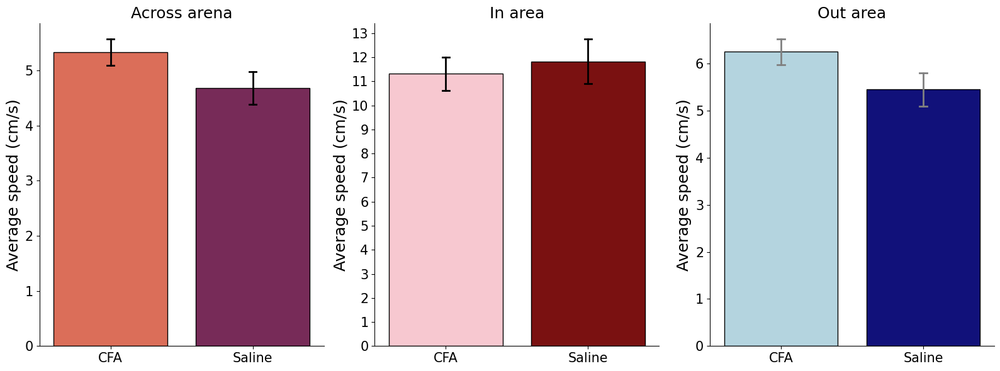

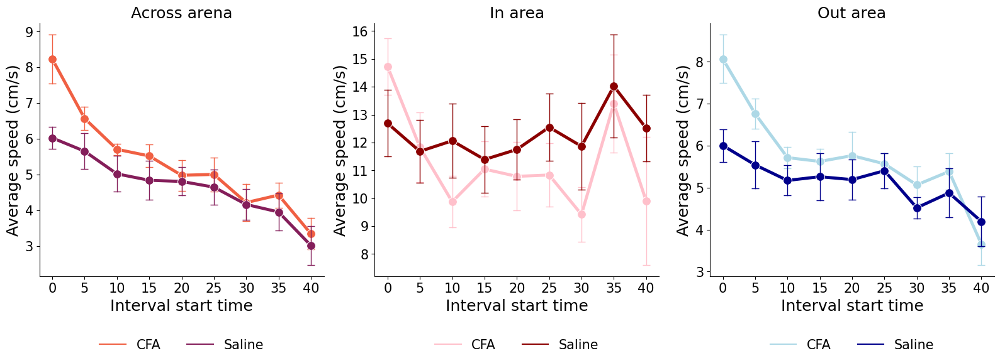

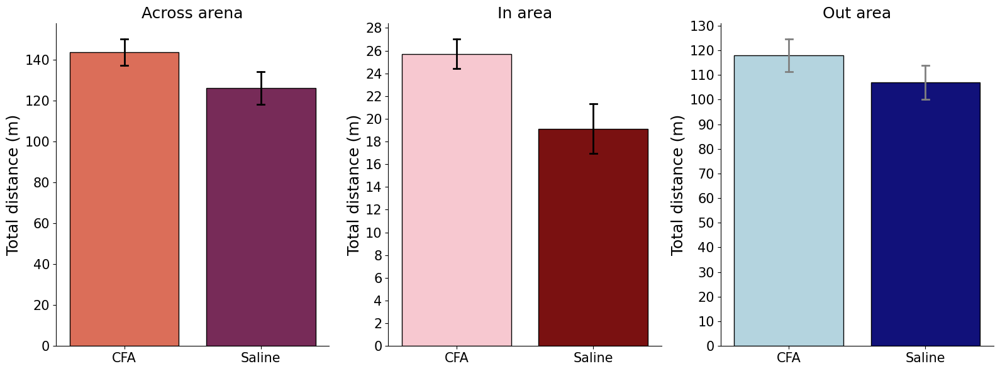

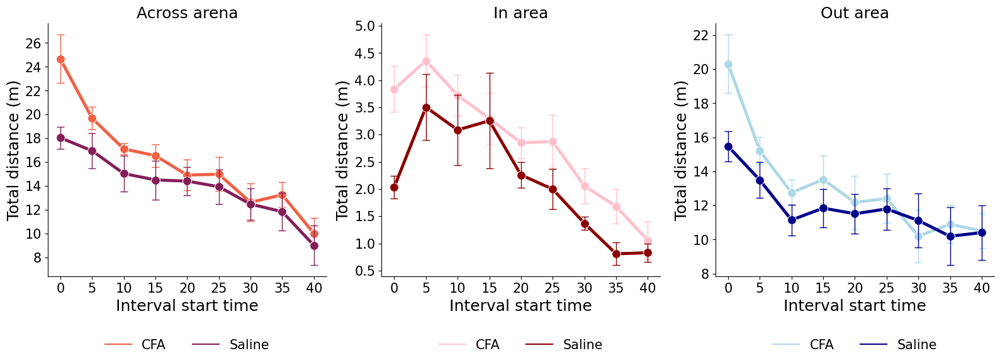

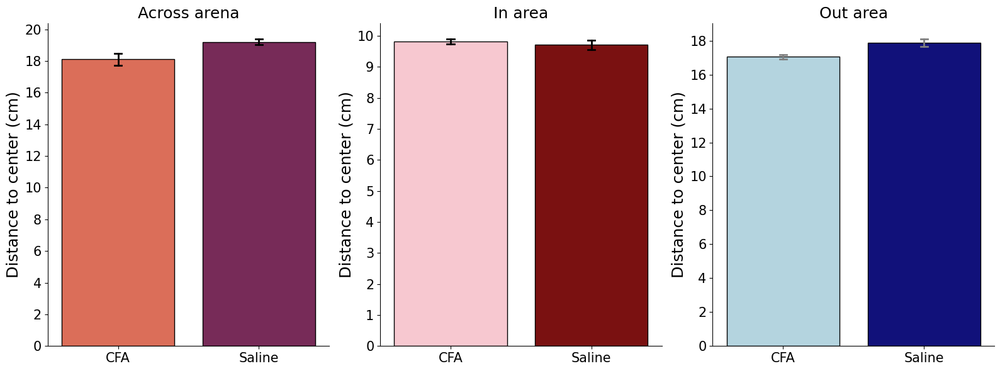

...

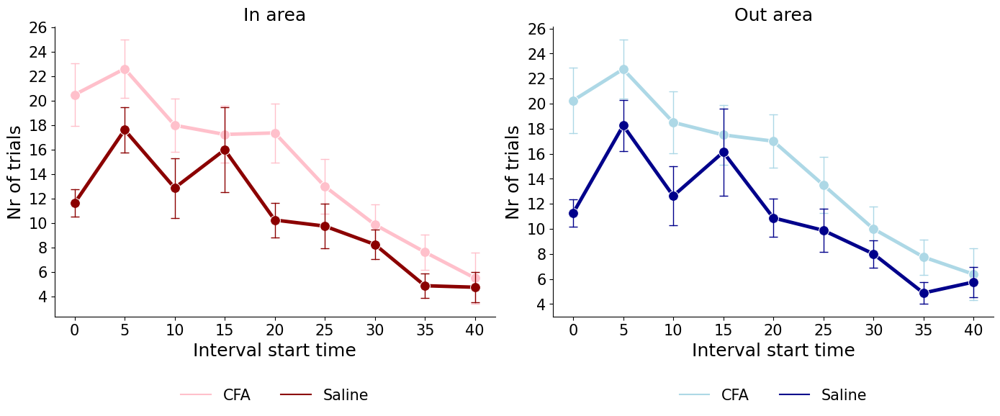

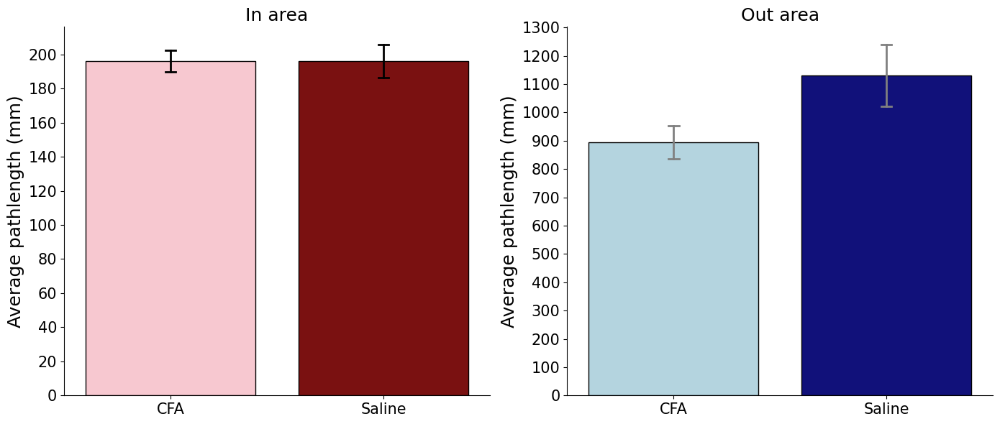

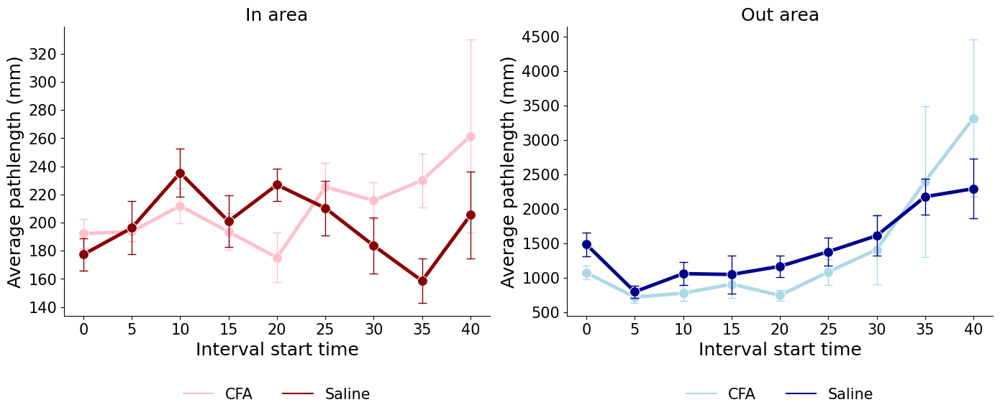

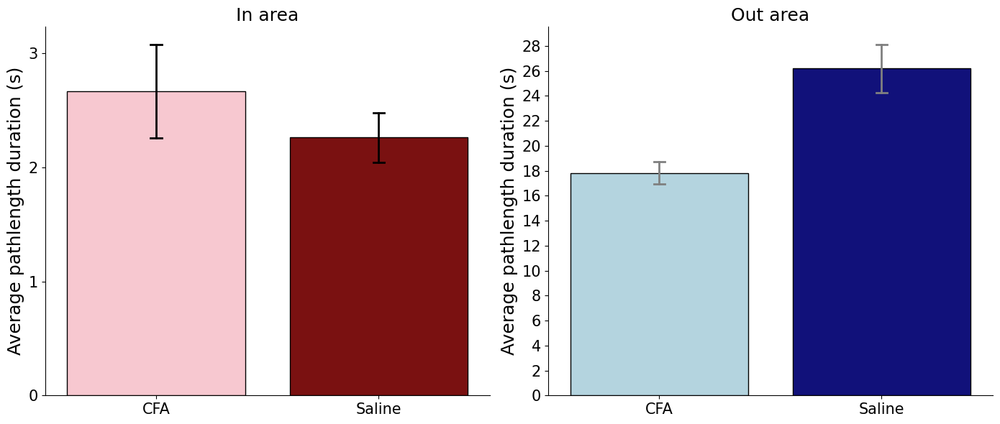

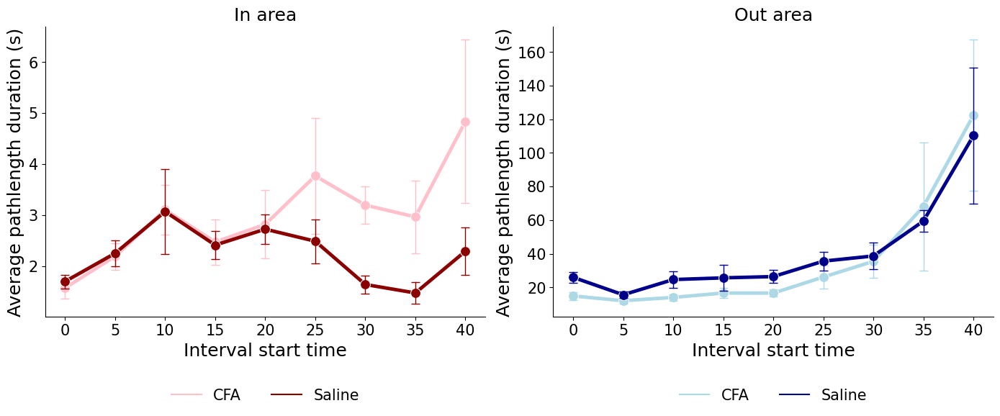

In [46]:
date= "nov2023"
session = "OF_reg"
experiment_duration = 45
x_major_increment = 1

# Plotting average speed 
ylabel = "Average speed (cm/s)"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "average_speed_total", y_tick_increment_total = 1,
                      y_in_column_name = "in_average_speed_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_speed_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_speed_total", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_speed_total", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_speed_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total distance 
ylabel = "Total distance (m)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "distance_total", y_tick_increment_total = 20,
                      y_in_column_name = "in_distance_total", y_tick_increment_in = 2,  
                      y_out_column_name = "out_distance_total", y_tick_increment_out = 10, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_distance_total", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_distance_total", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_total", y_tick_increment_out = 2, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting distance to center
ylabel = "Distance to center (cm)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "average_distance_to_center", y_tick_increment_total = 2,
                      y_in_column_name = "in_average_distance_to_center", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_distance_to_center", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )

interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_distance_to_center", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_distance_to_center", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_to_center", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Plotting total duration in/out area 
ylabel = "Total duration (min)"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_time_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_time_total", y_tick_increment_out = 5, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_time_total", y_tick_increment_in = 0.1, 
                     y_out_column_name = "out_interval_time_total", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Nr of trials in/out area 
ylabel = "Nr of trials"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_nr_of_trials", y_tick_increment_in = 10,  
                      y_out_column_name = "out_nr_of_trials", y_tick_increment_out = 10, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_nr_of_trials", y_tick_increment_in = 2, 
                     y_out_column_name = "out_interval_nr_of_trials", y_tick_increment_out = 2, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Average pathlengths mm in/out area 
ylabel = "Average pathlength (mm)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_mm", y_tick_increment_in = 20,  
                      y_out_column_name = "out_average_pathlength_mm", y_tick_increment_out = 100, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_average_pathlength_mm", y_tick_increment_in = 20, 
                     y_out_column_name = "out_interval_average_pathlength_mm", y_tick_increment_out = 500, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Average pathlength duration s in/out area 
ylabel = "Average pathlength duration (s)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_duration_s", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_pathlength_duration_s", y_tick_increment_out =2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_duration", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_duration", y_tick_increment_out = 20, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)




### nov2023 OF_threat first 10min 


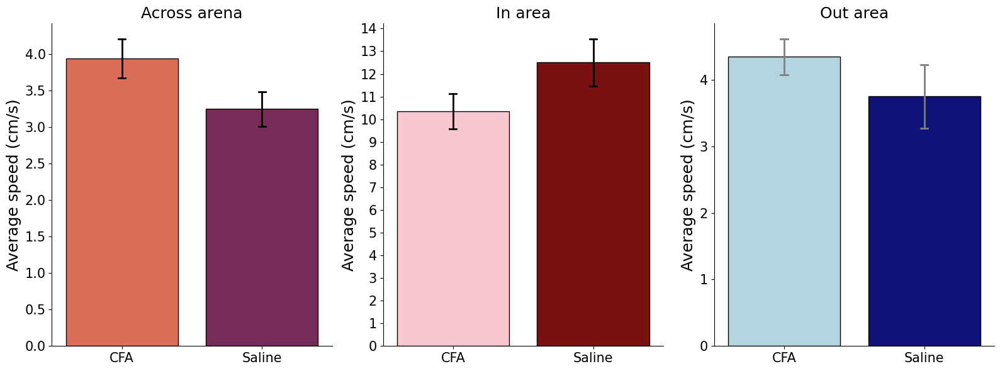

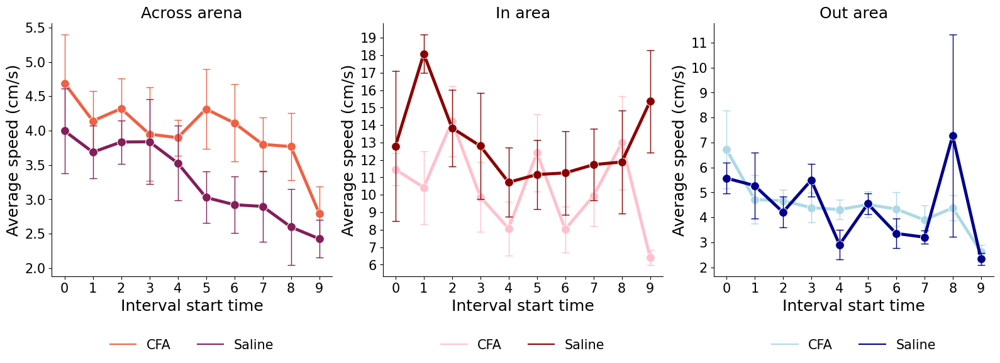

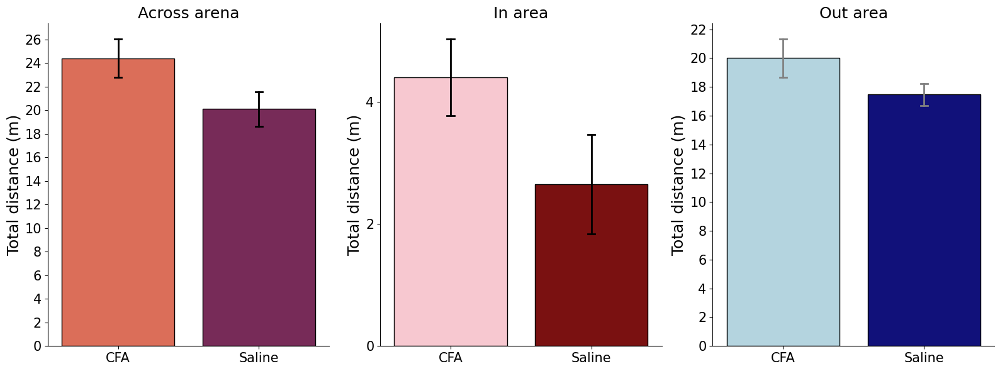

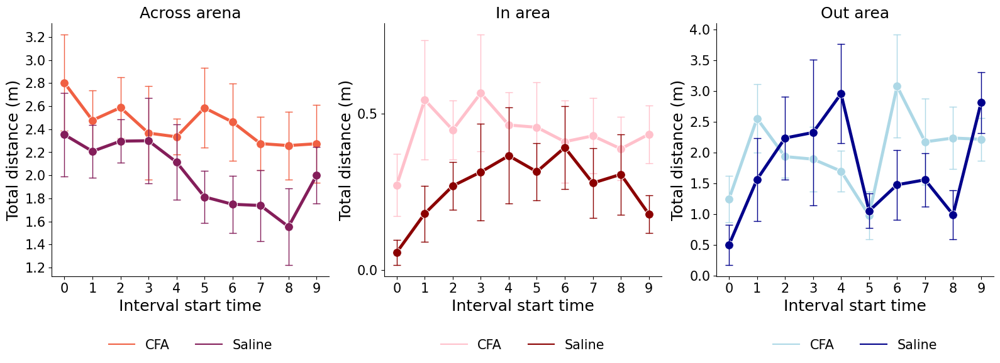

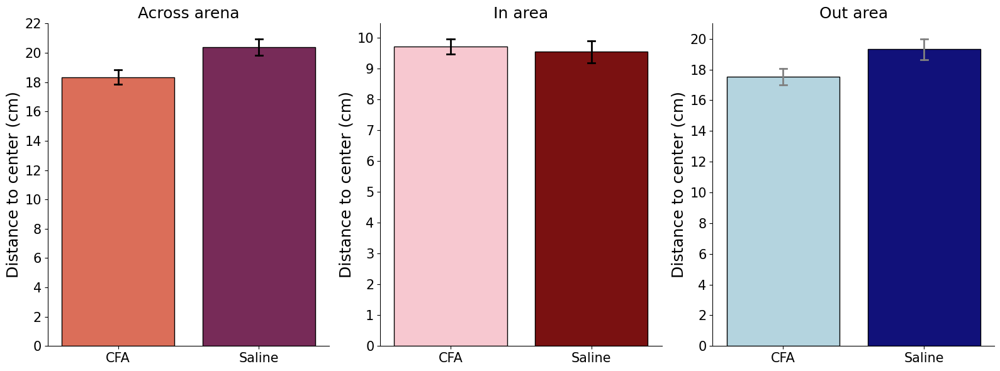

...

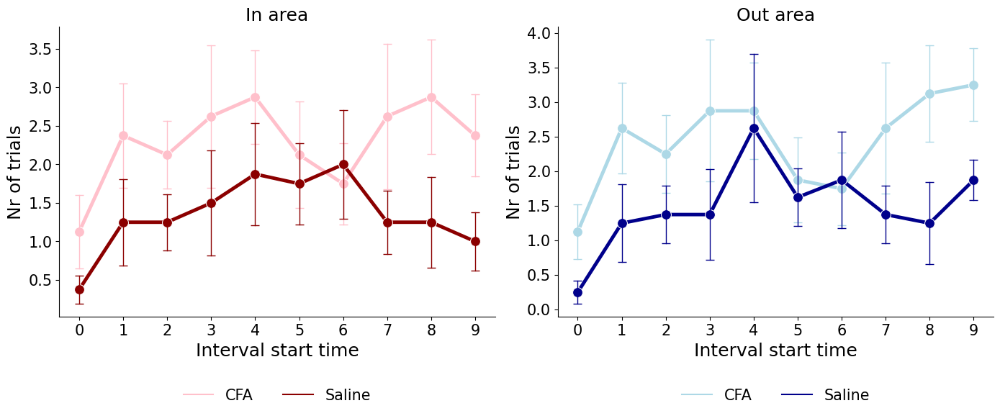

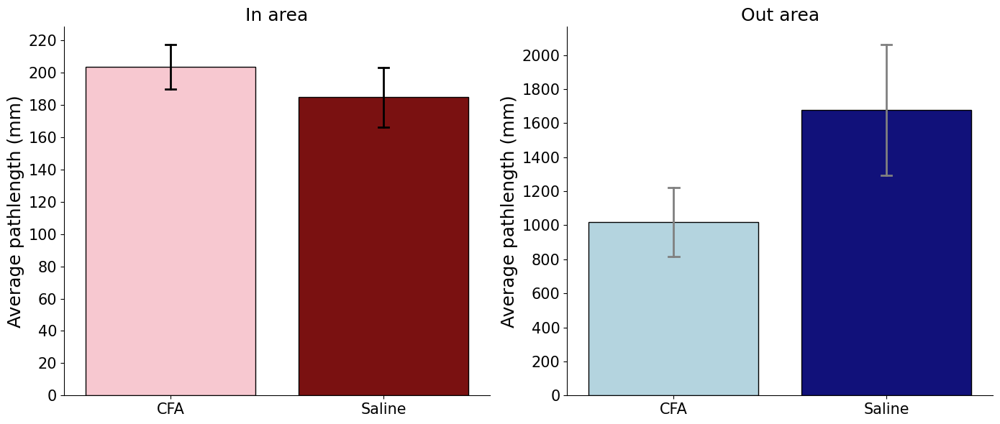

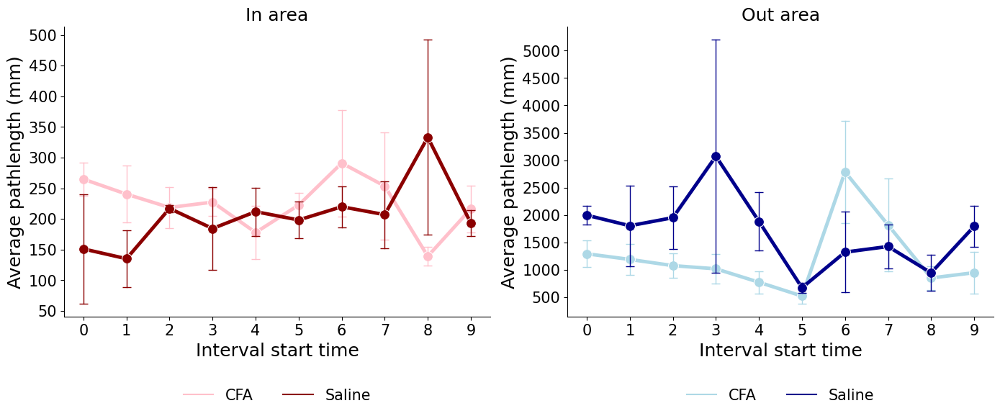

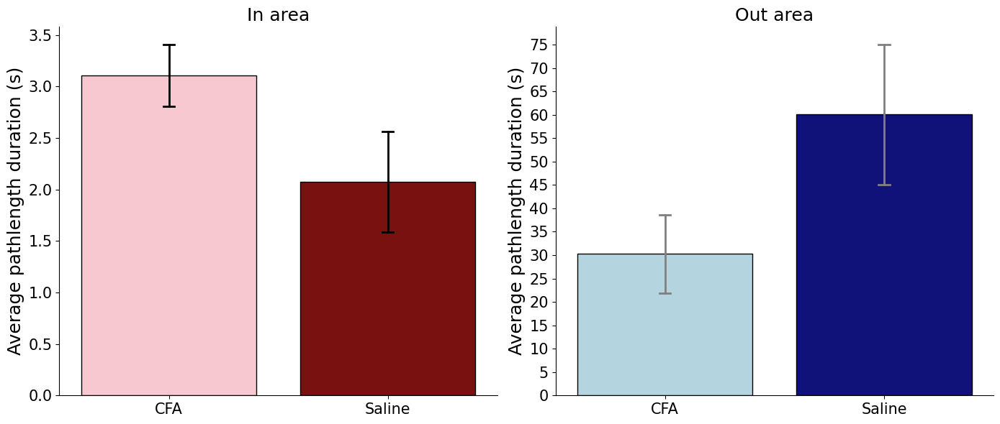

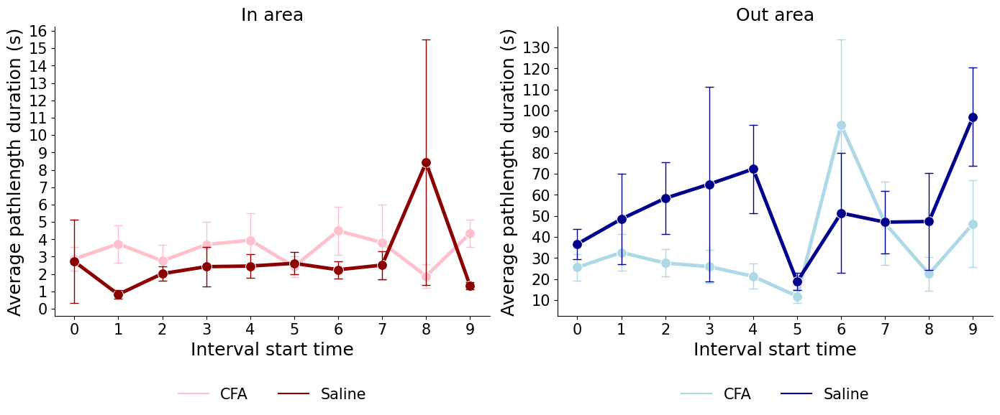

In [83]:
session = "OF_threat"
experiment_duration = 10
x_major_increment = 1
date = "nov2023"
# Plotting average speed 
ylabel = "Average speed (cm/s)"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "average_speed_total", y_tick_increment_total = 0.5,
                      y_in_column_name = "in_average_speed_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_speed_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_speed_total", y_tick_increment_total = 0.5,
                     y_in_column_name = "in_interval_speed_total", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_speed_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total distance 
ylabel = "Total distance (m)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "distance_total", y_tick_increment_total = 2,
                      y_in_column_name = "in_distance_total", y_tick_increment_in = 2,  
                      y_out_column_name = "out_distance_total", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_distance_total", y_tick_increment_total = 0.2,
                     y_in_column_name = "in_interval_distance_total", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_total", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting distance to center
ylabel = "Distance to center (cm)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "average_distance_to_center", y_tick_increment_total = 2,
                      y_in_column_name = "in_average_distance_to_center", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_distance_to_center", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )

interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_distance_to_center", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_distance_to_center", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_to_center", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total duration in/out area 
ylabel = "Total duration (min)"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_time_total", y_tick_increment_in = 0.1,  
                      y_out_column_name = "out_time_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = "NA",
                     y_in_column_name = "in_interval_time_total", y_tick_increment_in = 0.05, 
                     y_out_column_name = "out_interval_time_total", y_tick_increment_out = 0.2, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Nr of trials in/out area 
ylabel = "Nr of trials"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_nr_of_trials", y_tick_increment_in = 2,  
                      y_out_column_name = "out_nr_of_trials", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_nr_of_trials", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_nr_of_trials", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Average pathlengths mm in/out area 
ylabel = "Average pathlength (mm)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_mm", y_tick_increment_in = 20,  
                      y_out_column_name = "out_average_pathlength_mm", y_tick_increment_out = 200, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_average_pathlength_mm", y_tick_increment_in = 50, 
                     y_out_column_name = "out_interval_average_pathlength_mm", y_tick_increment_out = 500, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Average pathlength duration s in/out area 
ylabel = "Average pathlength duration (s)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_duration_s", y_tick_increment_in = 0.5,  
                      y_out_column_name = "out_average_pathlength_duration_s", y_tick_increment_out = 5, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_duration", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_duration", y_tick_increment_out = 10, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)




### aug2022 habituation 15min session

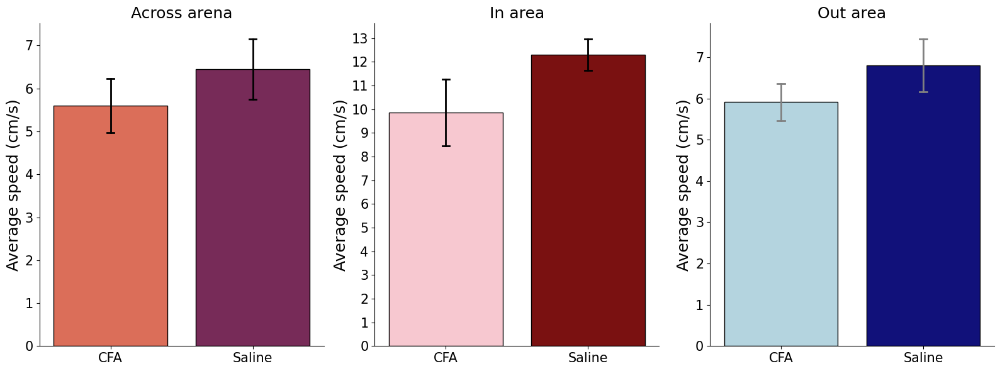

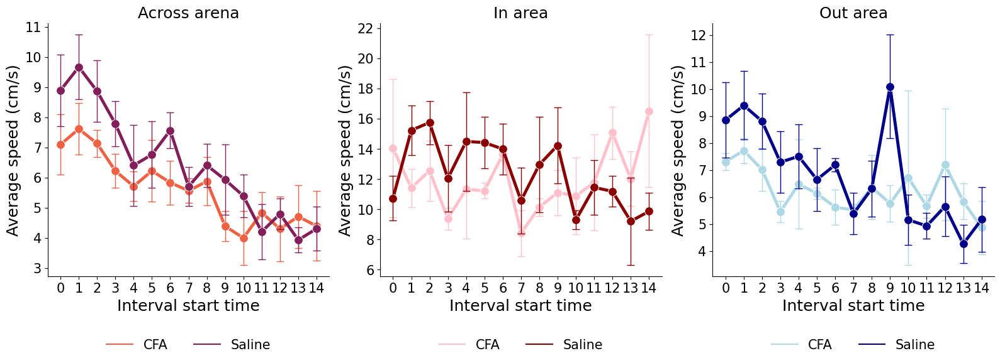

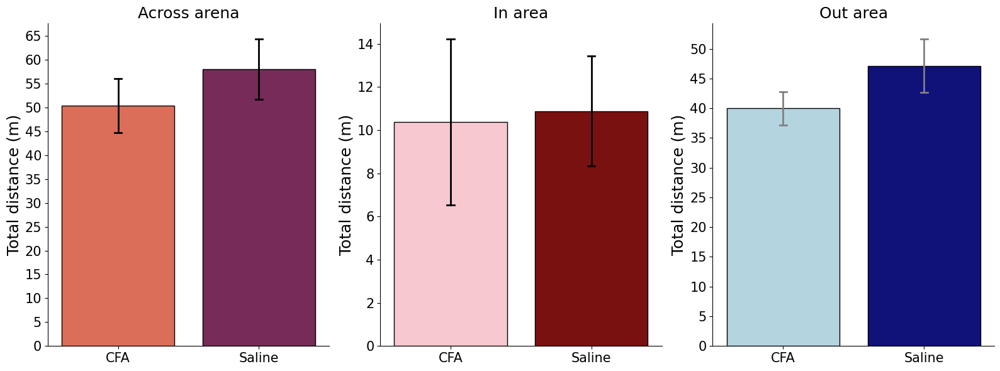

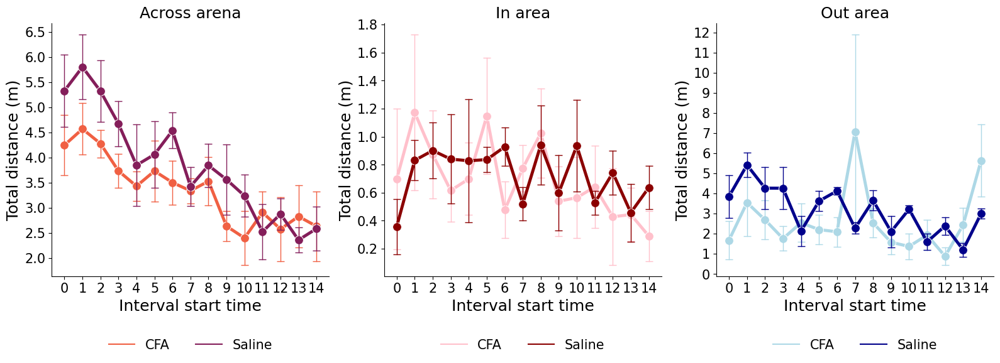

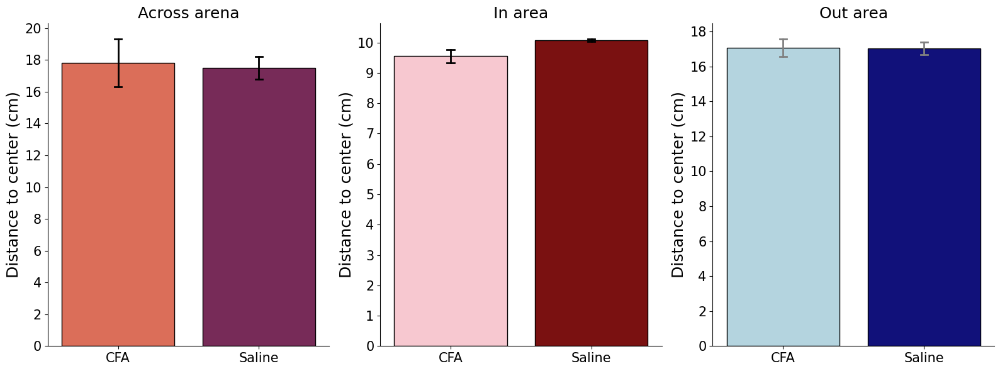

...

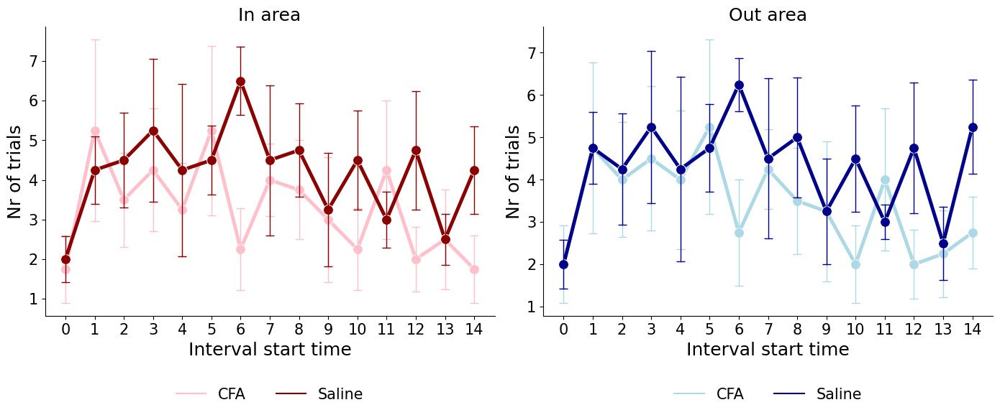

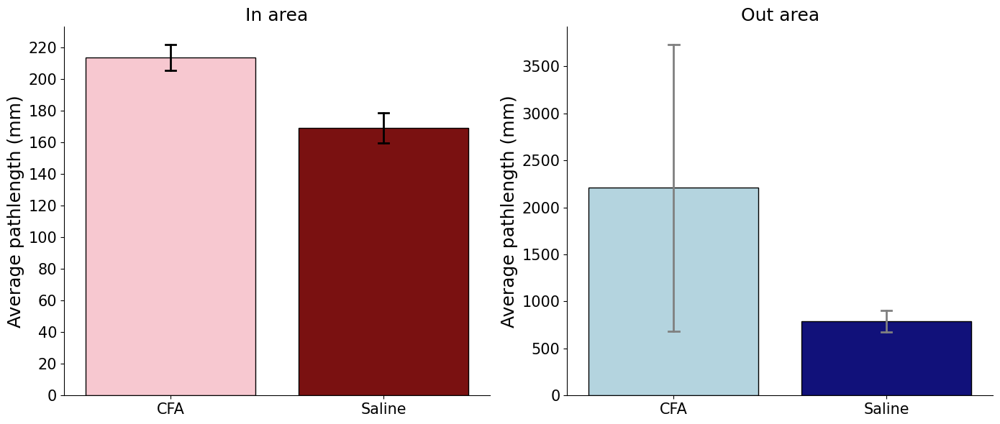

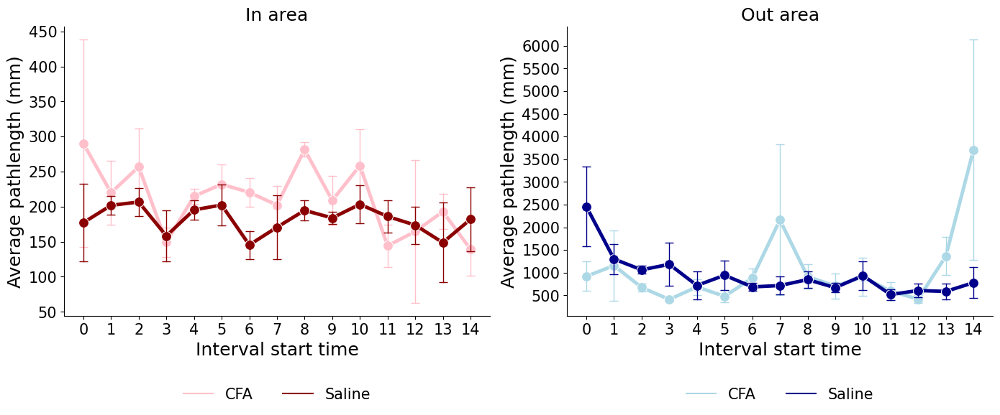

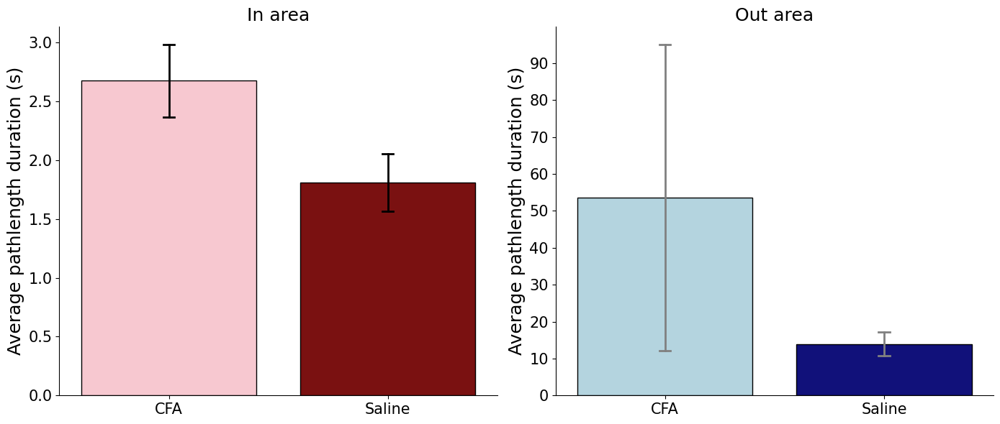

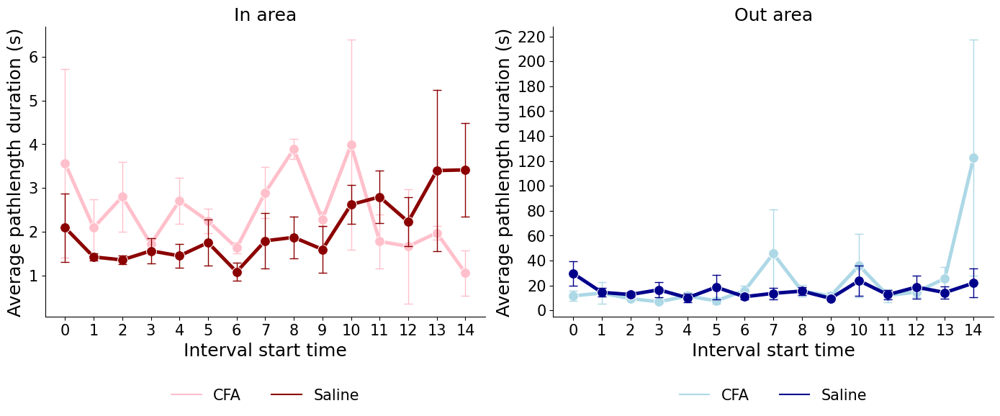

In [85]:
date= "aug2022"
session = "habituation"
experiment_duration = 15
x_major_increment = 1

# Plotting average speed 
ylabel = "Average speed (cm/s)"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "average_speed_total", y_tick_increment_total = 1,
                      y_in_column_name = "in_average_speed_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_speed_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_speed_total", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_speed_total", y_tick_increment_in = 2, 
                     y_out_column_name = "out_interval_speed_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total distance 
ylabel = "Total distance (m)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "distance_total", y_tick_increment_total = 5,
                      y_in_column_name = "in_distance_total", y_tick_increment_in = 2,  
                      y_out_column_name = "out_distance_total", y_tick_increment_out = 5, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_distance_total", y_tick_increment_total = 0.5,
                     y_in_column_name = "in_interval_distance_total", y_tick_increment_in = 0.2, 
                     y_out_column_name = "out_interval_distance_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting distance to center
ylabel = "Distance to center (cm)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "average_distance_to_center", y_tick_increment_total = 2,
                      y_in_column_name = "in_average_distance_to_center", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_distance_to_center", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )

interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_distance_to_center", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_distance_to_center", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_to_center", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total duration in/out area 
ylabel = "Total duration (min)"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_time_total", y_tick_increment_in =0.3,  
                      y_out_column_name = "out_time_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = "NA",
                     y_in_column_name = "in_interval_time_total", y_tick_increment_in = 0.05, 
                     y_out_column_name = "out_interval_time_total", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Nr of trials in/out area 
ylabel = "Nr of trials"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_nr_of_trials", y_tick_increment_in = 10,  
                      y_out_column_name = "out_nr_of_trials", y_tick_increment_out = 10, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_nr_of_trials", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_nr_of_trials", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Average pathlengths mm in/out area 
ylabel = "Average pathlength (mm)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_mm", y_tick_increment_in = 20,  
                      y_out_column_name = "out_average_pathlength_mm", y_tick_increment_out = 500, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_average_pathlength_mm", y_tick_increment_in = 50, 
                     y_out_column_name = "out_interval_average_pathlength_mm", y_tick_increment_out = 500, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Average pathlength duration s in/out area 
ylabel = "Average pathlength duration (s)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_duration_s", y_tick_increment_in = 0.5,  
                      y_out_column_name = "out_average_pathlength_duration_s", y_tick_increment_out = 10, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_duration", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_duration", y_tick_increment_out = 20, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)




### aug2022 experiment 45min session

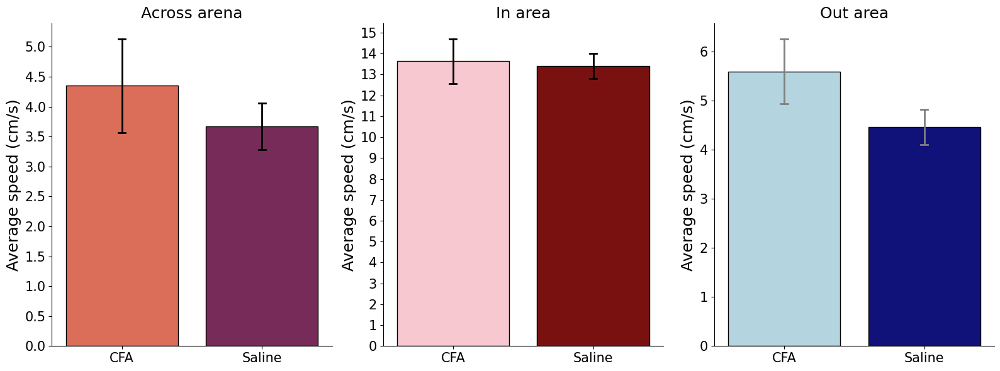

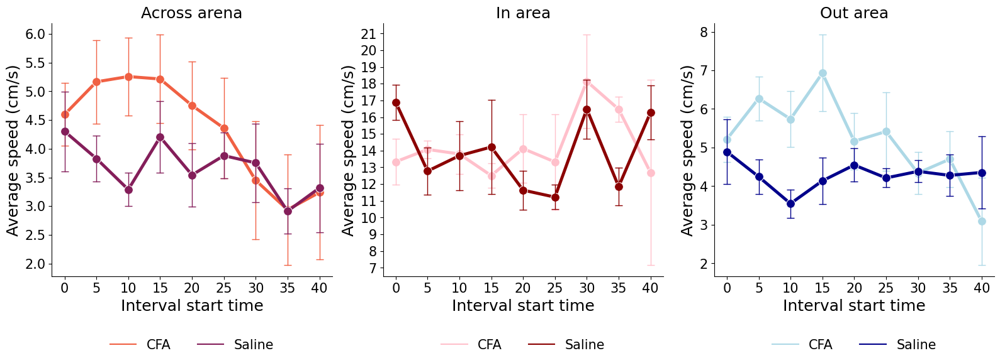

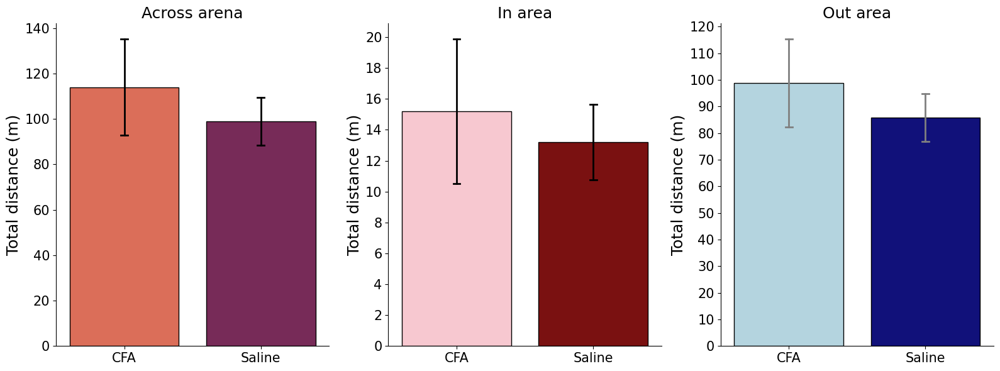

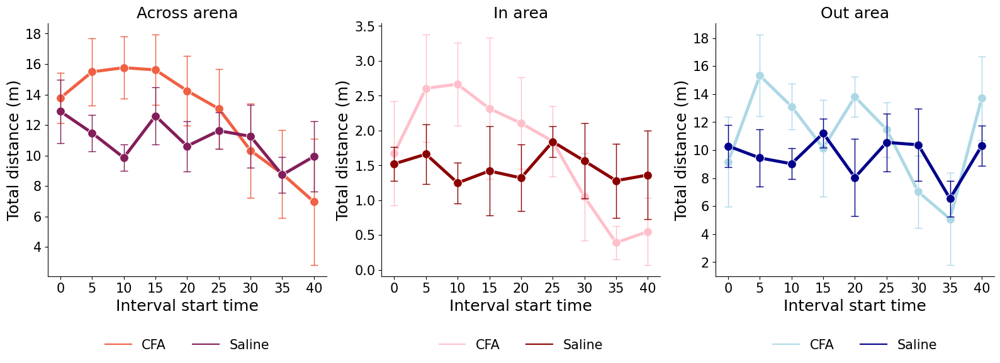

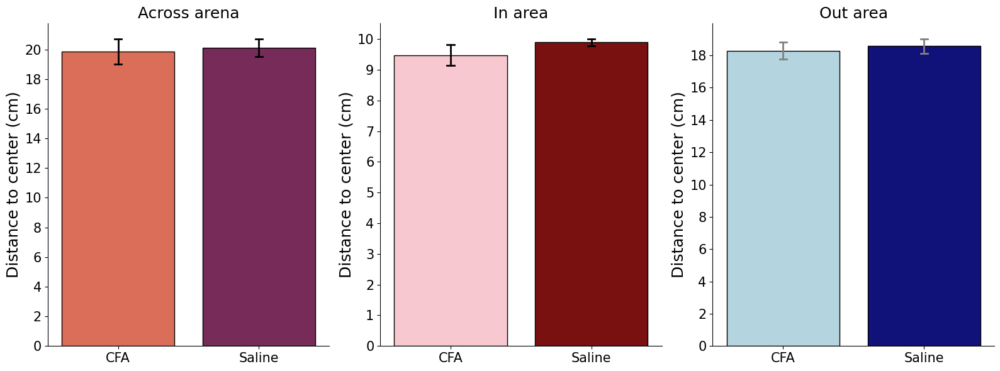

...

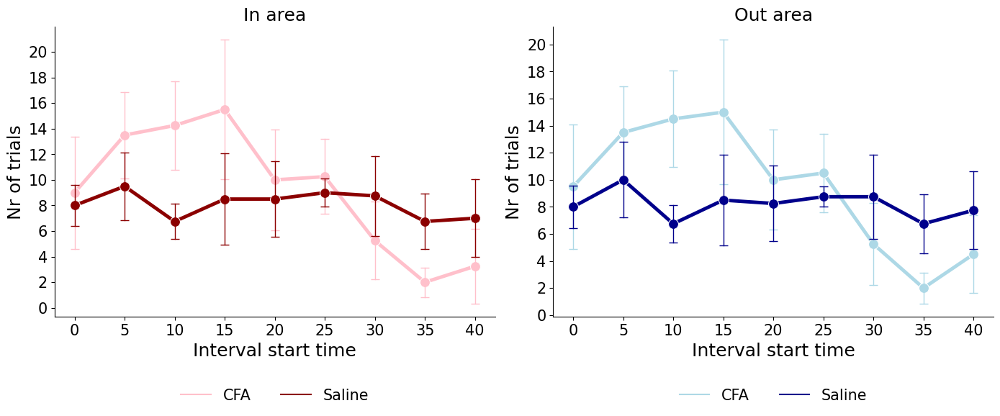

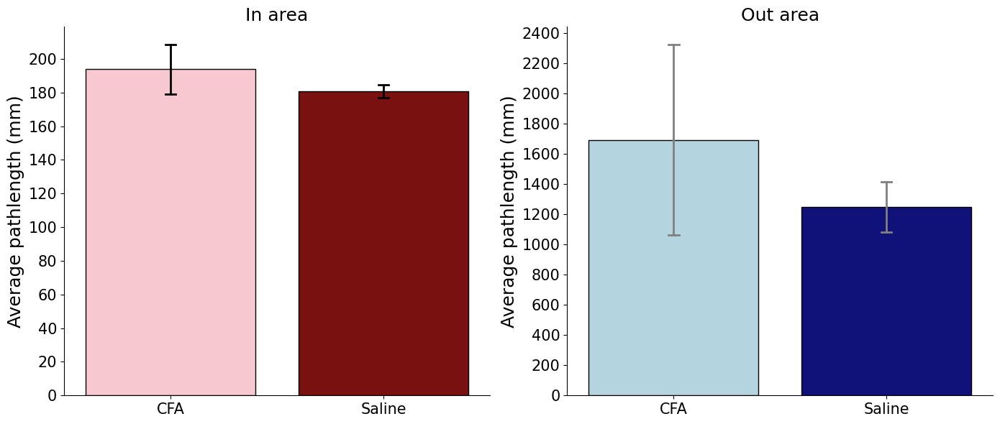

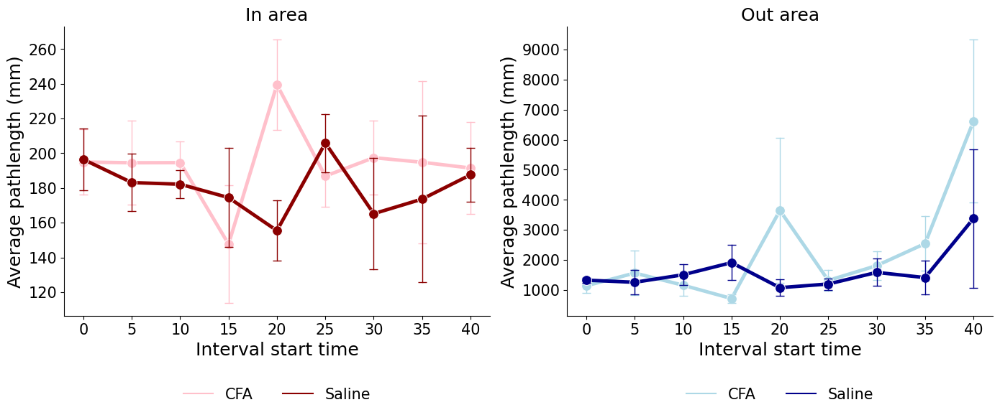

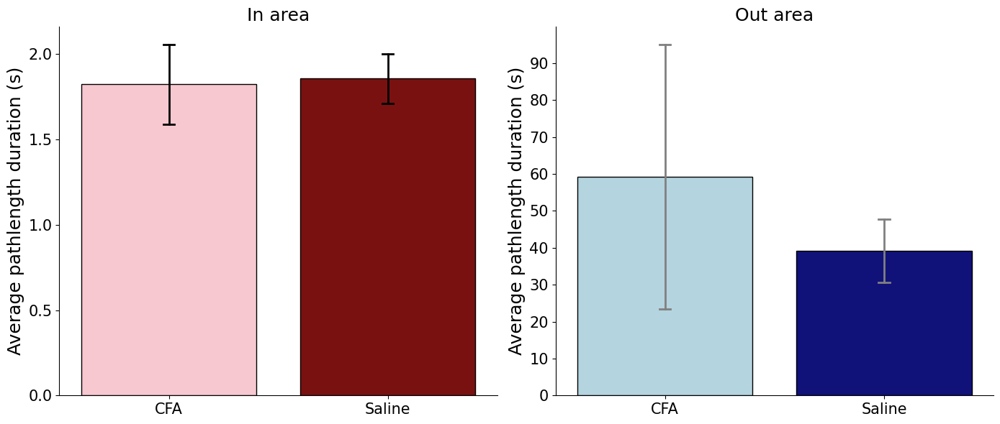

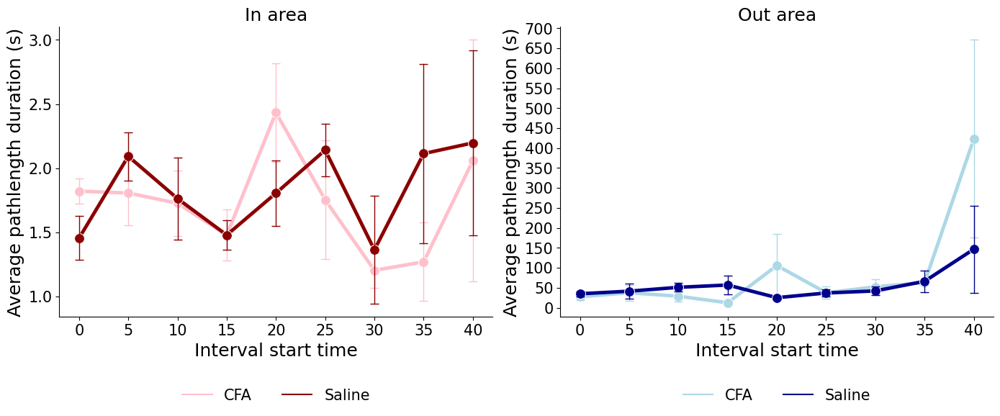

In [86]:
# experiment 45 min 

date= "aug2022"
session = "experiment"
experiment_duration = 45
x_major_increment = 1

# Plotting average speed 
ylabel = "Average speed (cm/s)"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "average_speed_total", y_tick_increment_total = 0.5,
                      y_in_column_name = "in_average_speed_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_speed_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_speed_total", y_tick_increment_total = 0.5,
                     y_in_column_name = "in_interval_speed_total", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_speed_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total distance 
ylabel = "Total distance (m)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "distance_total", y_tick_increment_total = 20,
                      y_in_column_name = "in_distance_total", y_tick_increment_in = 2,  
                      y_out_column_name = "out_distance_total", y_tick_increment_out = 10, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_distance_total", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_distance_total", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_total", y_tick_increment_out = 2, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting distance to center
ylabel = "Distance to center (cm)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "average_distance_to_center", y_tick_increment_total = 2,
                      y_in_column_name = "in_average_distance_to_center", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_distance_to_center", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )

interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="interval_distance_to_center", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_distance_to_center", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_to_center", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total duration in/out area 
ylabel = "Total duration (min)"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_time_total", y_tick_increment_in = 0.5,  
                      y_out_column_name = "out_time_total", y_tick_increment_out = 5, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = "NA",
                     y_in_column_name = "in_interval_time_total", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_time_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Nr of trials in/out area 
ylabel = "Nr of trials"
total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_nr_of_trials", y_tick_increment_in = 10,  
                      y_out_column_name = "out_nr_of_trials", y_tick_increment_out = 10, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_nr_of_trials", y_tick_increment_in = 2, 
                     y_out_column_name = "out_interval_nr_of_trials", y_tick_increment_out = 2, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Average pathlengths mm in/out area 
ylabel = "Average pathlength (mm)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_mm", y_tick_increment_in = 20,  
                      y_out_column_name = "out_average_pathlength_mm", y_tick_increment_out = 200, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_average_pathlength_mm", y_tick_increment_in = 20, 
                     y_out_column_name = "out_interval_average_pathlength_mm", y_tick_increment_out = 1000, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Average pathlength duration s in/out area 
ylabel = "Average pathlength duration (s)"

total_time_barplotter(df = result_dict[date]["sessions"][session]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_duration_s", y_tick_increment_in = 0.5,  
                      y_out_column_name = "out_average_pathlength_duration_s", y_tick_increment_out = 10, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = result_dict[date]["sessions"][session]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_duration", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_duration", y_tick_increment_out = 50, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)




## Plotting KDE diagrams for bodypart distance from centre 

### Comparison: all mice nov2023 vs aug2022

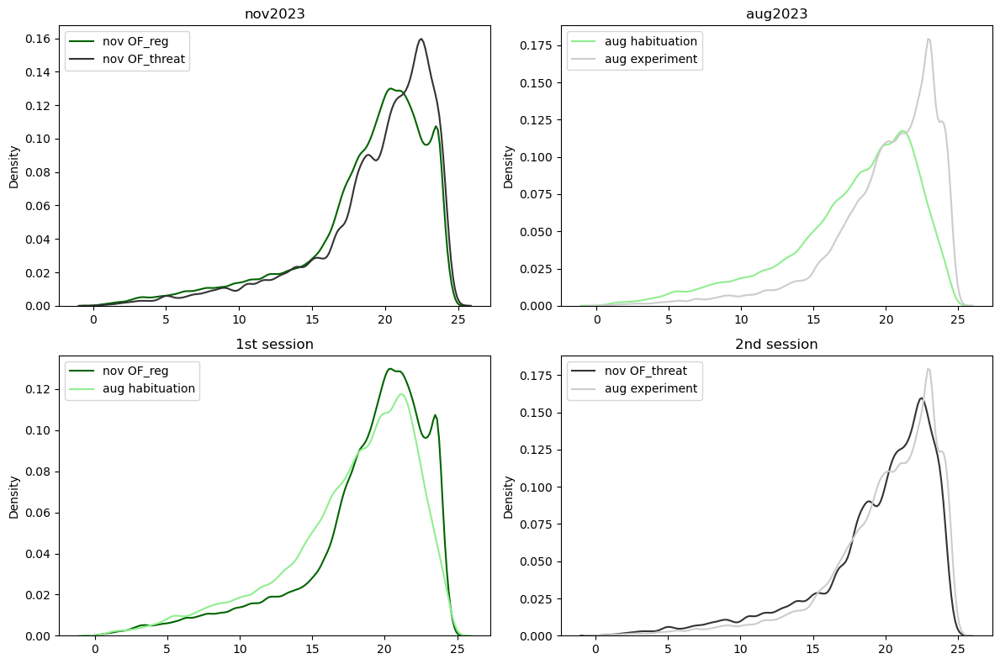

In [53]:

fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (12, 8))
sns.kdeplot(result_dict["nov2023"]["sessions"]["OF_reg"]["distance_to_center_allmice"]["total"], color = "#006400", label = "nov OF_reg", ax = ax[0, 0])
sns.kdeplot(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["total"], color = "#333333", label = "nov OF_threat", ax = ax[0, 0])
ax[0, 0].set_title("nov2023")
ax[0, 0].legend(loc="upper left")

sns.kdeplot(result_dict["aug2022"]["sessions"]["habituation"]["distance_to_center_allmice"]["total"], color = "#90EE90", label = "aug habituation", ax = ax[0, 1])
sns.kdeplot(result_dict["aug2022"]["sessions"]["experiment"]["distance_to_center_allmice"]["total"], color = "#CCCCCC", label = "aug experiment", ax = ax[0, 1])
ax[0, 1].set_title("aug2023")
ax[0, 1].legend(loc="upper left")


sns.kdeplot(result_dict["nov2023"]["sessions"]["OF_reg"]["distance_to_center_allmice"]["total"], color = "#006400", label = "nov OF_reg", ax = ax[1, 0])
sns.kdeplot(result_dict["aug2022"]["sessions"]["habituation"]["distance_to_center_allmice"]["total"], color = "#90EE90", label = "aug habituation", ax = ax[1, 0])
ax[1, 0].set_title("1st session")
ax[1, 0].legend(loc="upper left")

sns.kdeplot(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["total"], color = "#333333", label = "nov OF_threat", ax = ax[1, 1])
sns.kdeplot(result_dict["aug2022"]["sessions"]["experiment"]["distance_to_center_allmice"]["total"], color = "#CCCCCC", label = "aug experiment", ax = ax[1, 1])
ax[1, 1].set_title("2nd session")
ax[1, 1].legend(loc="upper left")


plt.tight_layout()
plt.show()


### Comparison: CFA vs Saline vs total in each session 

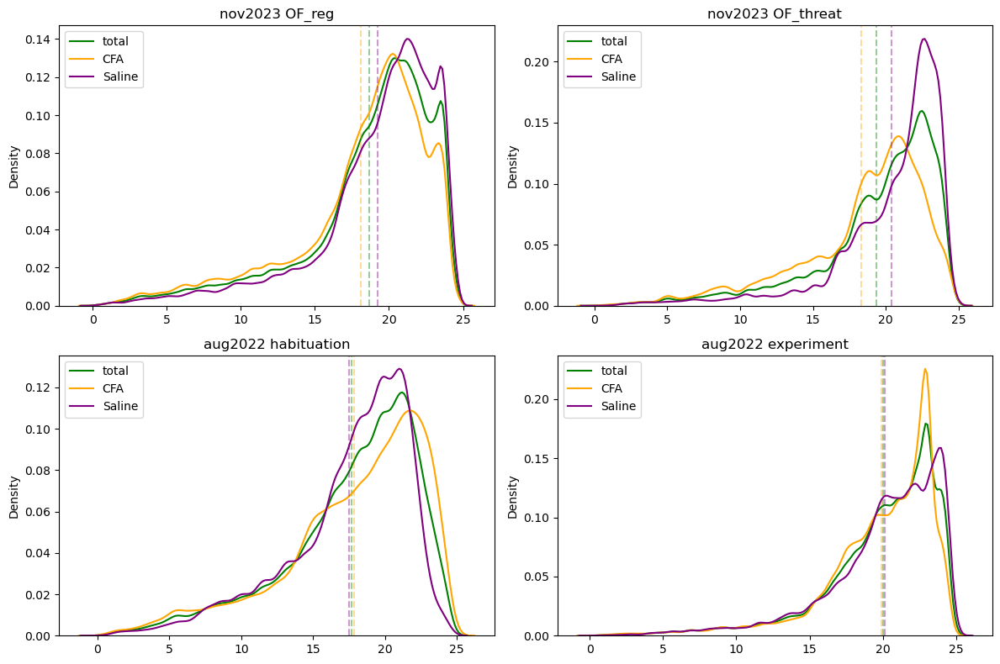

In [52]:
plot_dict = {"nov2023": ["OF_reg", "OF_threat"], "aug2022": ["habituation", "experiment"]}
color_dict = {"total": "green", "CFA": "orange", "Saline": "purple"}

# Create subplots
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

for i, date in enumerate(plot_dict):
    for j, session in enumerate(plot_dict[date]):
        for group in color_dict:
            data = result_dict[date]["sessions"][session]["distance_to_center_allmice"][group]
            mean_value = np.mean(data)

            sns.kdeplot(data, color=color_dict[group], label=group, ax=ax[i, j])
            ax[i, j].axvline(mean_value, color=color_dict[group], linestyle='--', alpha=0.4)

        ax[i, j].set_title(f"{date} {session}")
        ax[i, j].legend(loc="upper left")

# Adjust layout and show plot
plt.tight_layout()
plt.show()


### Comparison: within group differences between session 1 vs Session 2 in nov2023 and aug2022

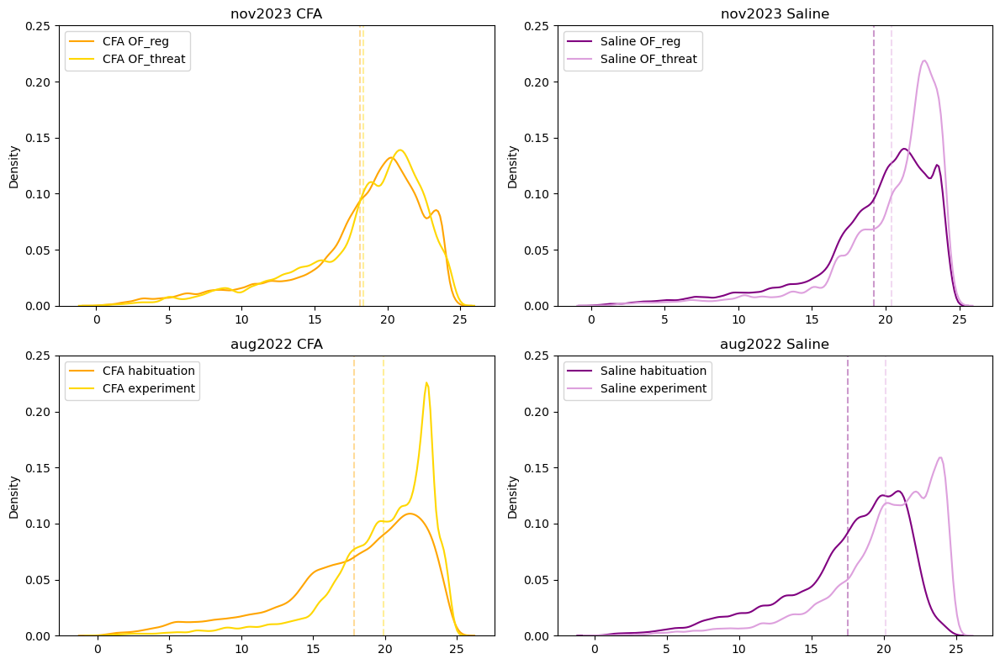

In [63]:
plot_dict = {"nov2023": ["OF_reg", "OF_threat"], "aug2022": ["habituation", "experiment"]}
color_dict = {"CFA": {"session_1": "orange", "session_2": "#FFD700"}, "Saline": {"session_1": "#800080", "session_2": "#DDA0DD"}}

# Create subplots
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

for i, date in enumerate(plot_dict):
    for j, group in enumerate(color_dict):
        for session in plot_dict[date]:
            data = result_dict[date]["sessions"][session]["distance_to_center_allmice"][group]
            mean_value = np.mean(data)
            
            if (session == "OF_reg") | (session == "habituation"): 
                sns.kdeplot(data, color=color_dict[group]["session_1"], label=group+" "+session, ax=ax[i, j])
                ax[i, j].axvline(mean_value, color=color_dict[group]["session_1"], linestyle='--', alpha=0.4)
            elif (session == "OF_threat") | (session == "experiment"): 
                sns.kdeplot(data, color=color_dict[group]["session_2"], label=group+" "+session, ax=ax[i, j])
                ax[i, j].axvline(mean_value, color=color_dict[group]["session_2"], linestyle='--', alpha=0.4)
                
            
            ax[i, j].set_title(f"{date} {group}")
            ax[i, j].set_ylim(0, 0.25)
            ax[i, j].legend(loc="upper left")

plt.tight_layout()
plt.show()

## Heatmaps for XY coordinates of all mice

### nov2023 

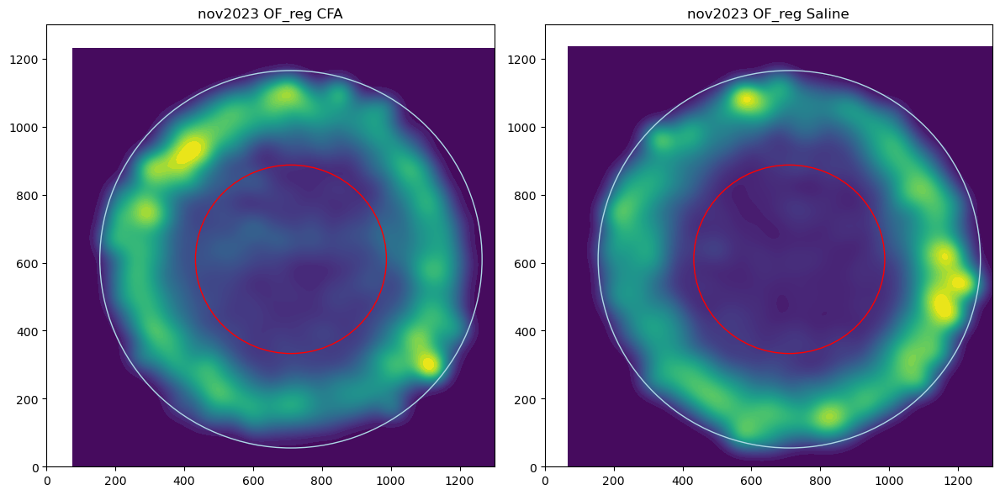

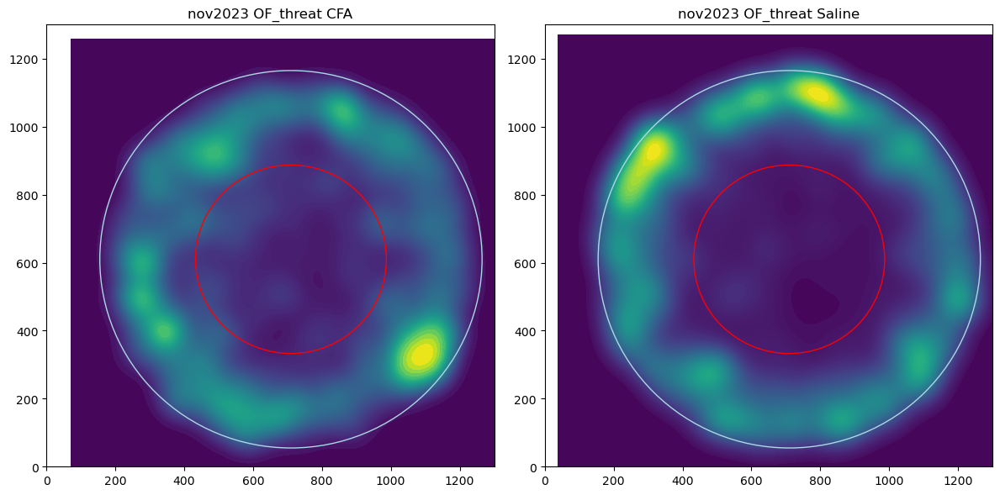

In [64]:
center_x = 710
center_y = 610
radius_og = 555

#For circle drawing function pixels used instead of cm, convert radius_new into pxl 
radius_small = 277.2

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))

circle1_CFA = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
circle3_CFA = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

sns.kdeplot(x=result_dict["nov2023"]["sessions"]["OF_reg"]["X_Y_coordinates_allmice"]["CFA"]["x"],
            y=result_dict["nov2023"]["sessions"]["OF_reg"]["X_Y_coordinates_allmice"]["CFA"]["y"],
            cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[0])
ax[0].set_ylim(0,1300)
ax[0].set_xlim(0,1300)
ax[0].set_title("nov2023 OF_reg CFA")
ax[0].add_patch(circle1_CFA)
ax[0].add_patch(circle3_CFA)


circle1_Saline = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
circle3_Saline = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

sns.kdeplot(x=result_dict["nov2023"]["sessions"]["OF_reg"]["X_Y_coordinates_allmice"]["Saline"]["x"],
            y=result_dict["nov2023"]["sessions"]["OF_reg"]["X_Y_coordinates_allmice"]["Saline"]["y"],
            cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[1])
ax[1].set_title("nov2023 OF_reg Saline")
ax[1].set_ylim(0,1300)
ax[1].set_xlim(0,1300)
ax[1].add_patch(circle1_Saline)
ax[1].add_patch(circle3_Saline)

plt.tight_layout()
plt.show()

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))
circle1_CFA = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
circle3_CFA = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

sns.kdeplot(x=result_dict["nov2023"]["sessions"]["OF_threat"]["X_Y_coordinates_allmice"]["CFA"]["x"],
            y=result_dict["nov2023"]["sessions"]["OF_threat"]["X_Y_coordinates_allmice"]["CFA"]["y"],
            cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[0])
ax[0].set_ylim(0,1300)
ax[0].set_xlim(0,1300)
ax[0].set_title("nov2023 OF_threat CFA")
ax[0].add_patch(circle1_CFA)
ax[0].add_patch(circle3_CFA)

circle1_Saline = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
circle3_Saline = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

sns.kdeplot(x=result_dict["nov2023"]["sessions"]["OF_threat"]["X_Y_coordinates_allmice"]["Saline"]["x"],
            y=result_dict["nov2023"]["sessions"]["OF_threat"]["X_Y_coordinates_allmice"]["Saline"]["y"],
            cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[1])
ax[1].set_title("nov2023 OF_threat Saline")
ax[1].set_ylim(0,1300)
ax[1].set_xlim(0,1300)
ax[1].add_patch(circle1_Saline)
ax[1].add_patch(circle3_Saline)

plt.tight_layout()
plt.show()


### aug2022

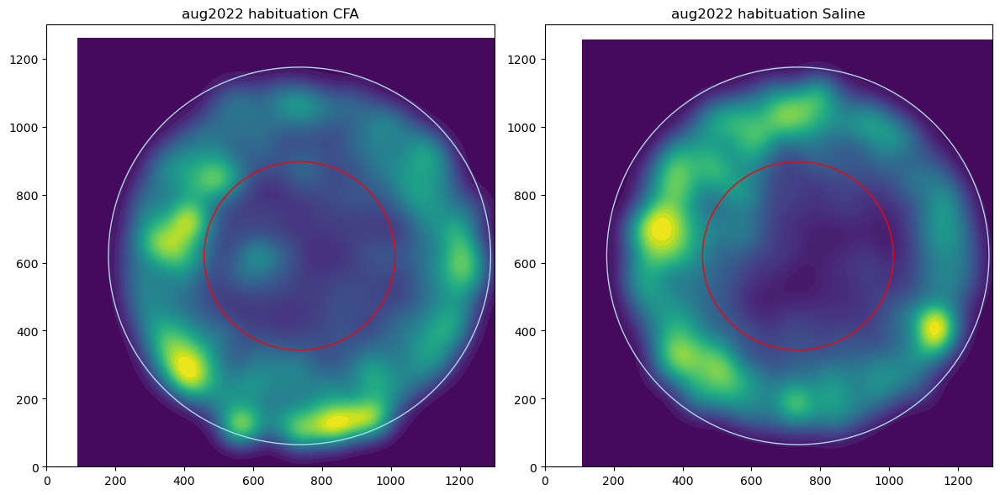

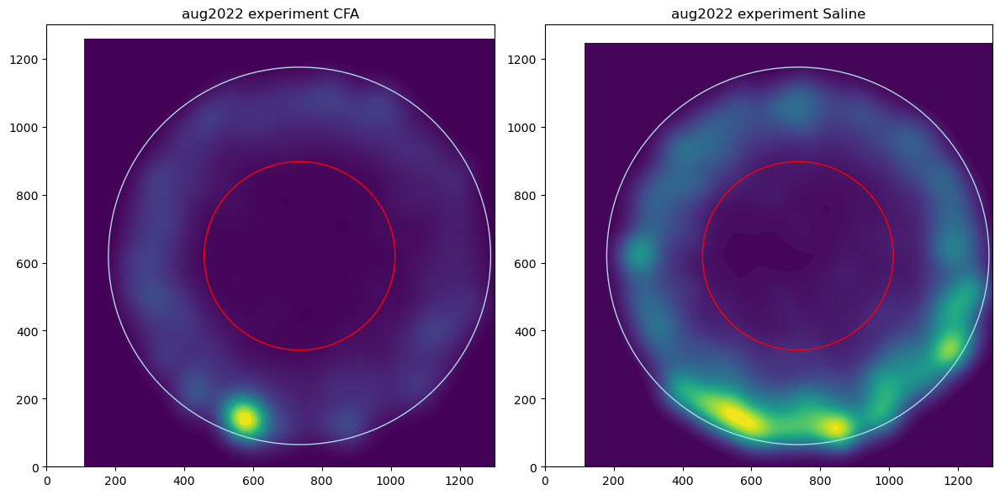

In [66]:
center_x = 735
center_y = 620
radius_og = 555
radius_small = 277.2

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))

circle1_CFA = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
circle3_CFA = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

sns.kdeplot(x=result_dict["aug2022"]["sessions"]["habituation"]["X_Y_coordinates_allmice"]["CFA"]["x"],
            y=result_dict["aug2022"]["sessions"]["habituation"]["X_Y_coordinates_allmice"]["CFA"]["y"],
            cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[0])
ax[0].set_ylim(0,1300)
ax[0].set_xlim(0,1300)
ax[0].set_title("aug2022 habituation CFA")
ax[0].add_patch(circle1_CFA)
ax[0].add_patch(circle3_CFA)

circle1_Saline = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
circle3_Saline = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

sns.kdeplot(x=result_dict["aug2022"]["sessions"]["habituation"]["X_Y_coordinates_allmice"]["Saline"]["x"],
            y=result_dict["aug2022"]["sessions"]["habituation"]["X_Y_coordinates_allmice"]["Saline"]["y"],
            cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[1])
ax[1].set_title("aug2022 habituation Saline")
ax[1].set_ylim(0,1300)
ax[1].set_xlim(0,1300)
ax[1].add_patch(circle1_Saline)
ax[1].add_patch(circle3_Saline)

plt.tight_layout()
plt.show()

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))
circle1_CFA = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
circle3_CFA = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

sns.kdeplot(x=result_dict["aug2022"]["sessions"]["experiment"]["X_Y_coordinates_allmice"]["CFA"]["x"],
            y=result_dict["aug2022"]["sessions"]["experiment"]["X_Y_coordinates_allmice"]["CFA"]["y"],
            cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[0])
ax[0].set_ylim(0,1300)
ax[0].set_xlim(0,1300)
ax[0].set_title("aug2022 experiment CFA")
ax[0].add_patch(circle1_CFA)
ax[0].add_patch(circle3_CFA)

circle1_Saline = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
circle3_Saline = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

sns.kdeplot(x=result_dict["aug2022"]["sessions"]["experiment"]["X_Y_coordinates_allmice"]["Saline"]["x"],
            y=result_dict["aug2022"]["sessions"]["experiment"]["X_Y_coordinates_allmice"]["Saline"]["y"],
            cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[1])
ax[1].set_title("aug2022 experiment Saline")
ax[1].set_ylim(0,1300)
ax[1].set_xlim(0,1300)
ax[1].add_patch(circle1_Saline)
ax[1].add_patch(circle3_Saline)

plt.tight_layout()
plt.show()


# Novelty/Threat experiment analysis (includes all 4 subsessions of OF_threat session)

In [119]:
# Creating a result_dict for all 4 subsessions of the OF_threat session (this is redundant code, could be combined with the OF analysis code)
path = '/Users/annam/Desktop/OF_CFA'

# Filtering bodypart_df
likelihood = 0
bodypart = "tail_base"
radius_new = 12.5
distance_filter_mm = 22.5 
time_filter_ms = 100

#Filtering in_df/out_df (for code to work min_points has to be at least 1)
min_points = 1

#Filtering for speed & duration of slow speed episodes
smooth_window = 20 
speed_limit_cm_per_s = 2
time_limit_s = 10


object_result_dict = {"bodypart_df_novel": {"X_Y_coordinates_allmice": {"total": {"x": [], "y": []}, "CFA": {"x": [], "y": []}, "Saline": {"x": [], "y": []}}, 
                             "distance_to_center_allmice":{"total": [], "CFA": [], "Saline": []},
                             "speed_allmice":{"total": [], "CFA": [], "Saline": []},
                             "total_df": [], "interval_df": [], 
                             "mouse_dict": {"90L": {}, "90RR": {}, "89R":{}, "89LL": {}, "88LL": {}, "88R": {}, 
                                            "87RR":{}, "87L":{}, "90R":{}, "90LL":{}, "89RR":{}, "89L":{}, 
                                            "88RR":{}, "88L":{}, "87R":{}, "87LL":{}}},
                      "bodypart_df_post_object": {"X_Y_coordinates_allmice": {"total": {"x": [], "y": []}, "CFA": {"x": [], "y": []}, "Saline": {"x": [], "y": []}}, 
                             "distance_to_center_allmice":{"total": [], "CFA": [], "Saline": []},
                             "speed_allmice":{"total": [], "CFA": [], "Saline": []},
                             "total_df": [], "interval_df": [], 
                             "mouse_dict": {"90L": {}, "90RR": {}, "89R":{}, "89LL": {}, "88LL": {}, "88R": {}, 
                                            "87RR":{}, "87L":{}, "90R":{}, "90LL":{}, "89RR":{}, "89L":{}, 
                                            "88RR":{}, "88L":{}, "87R":{}, "87LL":{}}},
                      "bodypart_df_threat": {"X_Y_coordinates_allmice": {"total": {"x": [], "y": []}, "CFA": {"x": [], "y": []}, "Saline": {"x": [], "y": []}}, 
                             "distance_to_center_allmice":{"total": [], "CFA": [], "Saline": []},
                             "speed_allmice":{"total": [], "CFA": [], "Saline": []},
                             "total_df": [], "interval_df": [], 
                             "mouse_dict": {"90L": {}, "90RR": {}, "89R":{}, "89LL": {}, "88LL": {}, "88R": {}, 
                                            "87RR":{}, "87L":{}, "90R":{}, "90LL":{}, "89RR":{}, "89L":{}, 
                                            "88RR":{}, "88L":{}, "87R":{}, "87LL":{}}}
                     }
                           

session = "OF_threat"

for epoch in object_result_dict: 
    
    print(epoch)
    # Set up lists for making total_df, which will contain averages/sums of variables (e.g., average speed) for each mouse across session
    mouse_names = []
    group_names = []

    average_speed_total = []
    average_distance_to_center = []

    distance_total = []

    in_distance_total = []
    out_distance_total = []

    in_time_total = []
    out_time_total = []

    in_average_speed_total = []
    out_average_speed_total = []

    in_nr_of_trials = []
    out_nr_of_trials = []

    in_average_pathlength_mm = []
    out_average_pathlength_mm = []

    in_average_pathlength_duration_s = []
    out_average_pathlength_duration_s = []

    in_average_distance_to_center = []
    out_average_distance_to_center = []


    # Set up lists for making interval_df, which will contain averages/sums of variables (e.g., average speed) for each mouse across intervals of the session 

    interval_names = []
    interval_mouse_names = []
    interval_group_names = []
    interval_speed_total = []
    interval_distance_total = []
    interval_distance_to_center = []

    in_interval_distance_total = []
    out_interval_distance_total = []

    in_interval_time_total = []
    out_interval_time_total = []

    in_interval_average_speed_total = []
    out_interval_average_speed_total = []

    in_interval_duration = []
    out_interval_duration = []

    in_nr_of_trials = []
    out_nr_of_trials = []

    in_interval_nr_of_trials = []
    out_interval_nr_of_trials = []

    in_interval_average_pathlength_mm = []
    out_interval_average_pathlength_mm = []

    in_interval_distance_to_center = []
    out_interval_distance_to_center = []


    for mouse in mouse_list_nov: 

        center_x = data_dict["nov2023"]["center_x"]
        center_y = data_dict["nov2023"]["center_y"]

        experiment_duration = data_dict["nov2023"]["sessions"]["OF_threat"]["duration"]
        interval = data_dict["nov2023"]["sessions"]["OF_threat"]["interval"]

        interval_bins = list(range(0, experiment_duration+interval, interval))
        interval_list = [str(interval_bins[i]) + ":" + str(interval_bins[i+1]) for i in range(len(interval_bins)-1)]

        bodypart_df = result_dict["nov2023"]["sessions"]["OF_threat"]["mouse_dict"][mouse][epoch] 

        timestamp_min = [(bodypart_df["timestamp_min"].iloc[i] - bodypart_df["timestamp_min"].iloc[0]) for i in range(len(bodypart_df))]
        bodypart_df["timestamp_min"] = timestamp_min


        bodypart_df = bodypart_df_maker(bodypart_df, distance_filter_mm, time_filter_ms)

        bodypart_df = interval_labeller(bodypart_df, interval, experiment_duration, "timestamp_min")
        
        # Remove # if speed filtering is necessary 
        # bodypart_df, bodypart_df_slow = speed_filtered_bodypart_df_maker(bodypart_df, speed_limit_cm_per_s, time_limit_s, smooth_window)

        object_result_dict[epoch]["mouse_dict"][mouse]["bodypart_df"] = bodypart_df
        
        # Remove # if df containing only the frames removed by the speed filtering needs to be stored
        # object_result_dict[epoch]["mouse_dict"][mouse]["bodypart_df_slow"] = bodypart_df_slow

        # stores X, Y coordinates and distance_to_centre for all mice, CFA or Saline mice in mouse_dict, accessed later for generating heatmaps across session and distance_to_centre histograms, respectively
        object_result_dict[epoch]["X_Y_coordinates_allmice"]["total"]["x"] = object_result_dict[epoch]["X_Y_coordinates_allmice"]["total"]["x"] + bodypart_df["x"].tolist()
        object_result_dict[epoch]["X_Y_coordinates_allmice"]["total"]["y"] = object_result_dict[epoch]["X_Y_coordinates_allmice"]["total"]["y"] + bodypart_df["y"].tolist()
        object_result_dict[epoch]["distance_to_center_allmice"]["total"] = object_result_dict[epoch]["distance_to_center_allmice"]["total"] + bodypart_df["distance_from_center"].tolist()
        object_result_dict[epoch]["speed_allmice"]["total"]  = object_result_dict[epoch]["speed_allmice"]["total"] + bodypart_df["speed_cm_per_s"].tolist()

        if mouse in data_dict["nov2023"]["Groups"]["CFA"]: 
            object_result_dict[epoch]["X_Y_coordinates_allmice"]["CFA"]["x"] = object_result_dict[epoch]["X_Y_coordinates_allmice"]["CFA"]["x"] + bodypart_df["x"].tolist()  
            object_result_dict[epoch]["X_Y_coordinates_allmice"]["CFA"]["y"] = object_result_dict[epoch]["X_Y_coordinates_allmice"]["CFA"]["y"] + bodypart_df["y"].tolist()  
            object_result_dict[epoch]["distance_to_center_allmice"]["CFA"] = object_result_dict[epoch]["distance_to_center_allmice"]["CFA"] + bodypart_df["distance_from_center"].tolist()
            object_result_dict[epoch]["speed_allmice"]["CFA"]  = object_result_dict[epoch]["speed_allmice"]["CFA"] + bodypart_df["speed_cm_per_s"].tolist()
            group_names.append("CFA")

        elif mouse in data_dict["nov2023"]["Groups"]["Saline"]:
            object_result_dict[epoch]["X_Y_coordinates_allmice"]["Saline"]["x"] = object_result_dict[epoch]["X_Y_coordinates_allmice"]["Saline"]["x"] + bodypart_df["x"].tolist()  
            object_result_dict[epoch]["X_Y_coordinates_allmice"]["Saline"]["y"] = object_result_dict[epoch]["X_Y_coordinates_allmice"]["Saline"]["y"] + bodypart_df["y"].tolist()  
            object_result_dict[epoch]["distance_to_center_allmice"]["Saline"] = object_result_dict[epoch]["distance_to_center_allmice"]["Saline"] + bodypart_df["distance_from_center"].tolist()
            object_result_dict[epoch]["speed_allmice"]["Saline"]  = object_result_dict[epoch]["speed_allmice"]["Saline"] + bodypart_df["speed_cm_per_s"].tolist()
            group_names.append("Saline")

        bodypart_df_in, bodypart_df_out = label_individual_paths(bodypart_df)

        in_df, out_df = pathlength_calculator(bodypart_df_in), pathlength_calculator(bodypart_df_out)
        in_df, out_df = interval_labeller(in_df, interval, experiment_duration, "end_time"), interval_labeller(out_df, interval, experiment_duration, "end_time")
        
        #Stores pathlengths performed outside and inside centre area in mouse_dict, for access if needed 
        object_result_dict[epoch]["mouse_dict"][mouse]["in_df"] = in_df
        object_result_dict[epoch]["mouse_dict"][mouse]["out_df"] = out_df




        # Collect data for total_df 
        mouse_names.append(mouse)

        average_speed_total.append(bodypart_df["speed_cm_per_s"].mean())

        distance_total.append(bodypart_df["ds_mm"].sum()/1000)

        average_distance_to_center.append(bodypart_df["distance_from_center"].mean())

        in_distance_total.append(in_df["total_distance_mm"].sum()/1000)
        out_distance_total.append(out_df["total_distance_mm"].sum()/1000)

        in_time_total.append(in_df["duration_s"].sum()/60)
        out_time_total.append(out_df["duration_s"].sum()/60)

        in_average_speed_total.append(in_df["avg_speed_cm_per_s"].mean())
        out_average_speed_total.append(out_df["avg_speed_cm_per_s"].mean())

        in_nr_of_trials.append(len(in_df))
        out_nr_of_trials.append(len(out_df))

        in_average_pathlength_mm.append(in_df["total_distance_mm"].mean())
        out_average_pathlength_mm.append(out_df["total_distance_mm"].mean())

        in_average_pathlength_duration_s.append(in_df["duration_s"].mean())
        out_average_pathlength_duration_s.append(out_df["duration_s"].mean())

        in_average_distance_to_center.append(in_df["distance_from_center"].mean())
        out_average_distance_to_center.append(out_df["distance_from_center"].mean())

        # Collect data for total_df 

        for interval_1 in interval_list:   

            interval_names.append(interval_1)
            interval_mouse_names.append(mouse)

            if mouse in data_dict["nov2023"]["Groups"]["CFA"]: 
                interval_group_names.append("CFA")
            elif mouse in data_dict["nov2023"]["Groups"]["Saline"]: 
                interval_group_names.append("Saline")

            interval_df = bodypart_df.loc[bodypart_df["interval"] == interval_1]

            interval_speed_total.append(interval_df["speed_cm_per_s"].mean())

            interval_distance_total.append(interval_df["ds_mm"].sum()/1000)

            interval_distance_to_center.append(interval_df["distance_from_center"].mean())

            in_interval_df = in_df.loc[in_df["interval"] == interval_1]
            out_interval_df = out_df.loc[out_df["interval"] == interval_1]

            in_interval_distance_total.append(in_interval_df["total_distance_mm"].sum()/1000)
            out_interval_distance_total.append(out_interval_df["total_distance_mm"].sum()/1000)

            in_interval_time_total.append(in_interval_df["duration_s"].sum()/60)
            out_interval_time_total.append(out_interval_df["duration_s"].sum()/60)

            in_interval_duration.append(in_interval_df["duration_s"].mean())
            out_interval_duration.append(out_interval_df["duration_s"].mean())

            in_interval_average_speed_total.append(in_interval_df["avg_speed_cm_per_s"].mean())
            out_interval_average_speed_total.append(out_interval_df["avg_speed_cm_per_s"].mean())

            in_interval_nr_of_trials.append(len(in_interval_df))
            out_interval_nr_of_trials.append(len(out_interval_df))

            in_interval_average_pathlength_mm.append(in_interval_df["total_distance_mm"].mean())
            out_interval_average_pathlength_mm.append(out_interval_df["total_distance_mm"].mean())

            in_interval_distance_to_center.append(in_interval_df["distance_from_center"].mean())
            out_interval_distance_to_center.append(out_interval_df["distance_from_center"].mean())

        print(mouse+" done")

    # Create total_df and store it in results_dict
    total_dict = {"mouse_names":mouse_names, "group_names":group_names, "average_speed_total":average_speed_total, "in_average_speed_total":in_average_speed_total, "out_average_speed_total":out_average_speed_total, 
                  "distance_total": distance_total, "in_distance_total":in_distance_total, "out_distance_total":out_distance_total, 
                  "in_time_total":in_time_total, "out_time_total":out_time_total, 
                  "in_nr_of_trials":in_nr_of_trials, "out_nr_of_trials":out_nr_of_trials, 
                  "in_average_pathlength_mm":in_average_pathlength_mm, "out_average_pathlength_mm":out_average_pathlength_mm, 
                  "average_distance_to_center":average_distance_to_center, "in_average_distance_to_center":in_average_distance_to_center, "out_average_distance_to_center": out_average_distance_to_center,
                  "in_average_pathlength_duration_s": in_average_pathlength_duration_s, "out_average_pathlength_duration_s": out_average_pathlength_duration_s}

    total_df = pd.DataFrame(total_dict)

    object_result_dict[epoch]["total_df"] = total_df

    # Create interval_df and store it in results_dict
    interval_dict = {"interval_names":interval_names, "mouse_names":interval_mouse_names, "group_names":interval_group_names, 
                     "interval_speed_total":interval_speed_total, "in_interval_speed_total":in_interval_average_speed_total, "out_interval_speed_total":out_interval_average_speed_total, 
                     "interval_distance_total":interval_distance_total, "in_interval_distance_total":in_interval_distance_total, "out_interval_distance_total":out_interval_distance_total, 
                     "in_interval_time_total" :in_interval_time_total, "out_interval_time_total":out_interval_time_total, 
                     "in_interval_duration":in_interval_duration, "out_interval_duration":out_interval_duration, 
                     "interval_distance_to_center":interval_distance_to_center, "in_interval_distance_to_center":in_interval_distance_to_center, "out_interval_distance_to_center": out_interval_distance_to_center, 
                     "in_interval_nr_of_trials":in_interval_nr_of_trials, "out_interval_nr_of_trials":out_interval_nr_of_trials, 
                     "in_interval_average_pathlength_mm":in_interval_average_pathlength_mm, "out_interval_average_pathlength_mm": out_interval_average_pathlength_mm}

    interval_df = pd.DataFrame(interval_dict)
    object_result_dict[epoch]["interval_df"] = interval_df

test_dict = dict()
test_dict["bodypart_df_open"] = result_dict["nov2023"]["sessions"]["OF_threat"]

object_result_dict = {**test_dict, **object_result_dict}


bodypart_df_novel
87L done
87LL done
87R done
87RR done
88L done
88LL done
88R done
88RR done
89L done
89LL done
89R done
89RR done
90L done
90LL done
90R done
90RR done
bodypart_df_post_object
87L done
87LL done
87R done
87RR done
88L done
88LL done
88R done
88RR done
89L done
89LL done
89R done
89RR done
90L done
90LL done
90R done
90RR done
bodypart_df_threat
87L done
87LL done
87R done
87RR done
88L done
88LL done
88R done
88RR done
89L done
89LL done
89R done
89RR done
90L done
90LL done
90R done
90RR done


# Plotting for Novelty/Threat (includes all 4 subsessions of OF_threat)

## Lineplots and barplots (separate for each subsession)

### OF_threat open arena subsession 10min

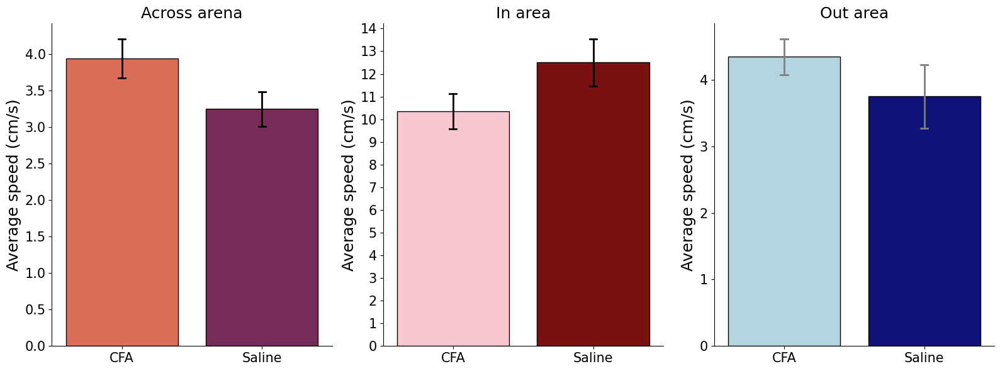

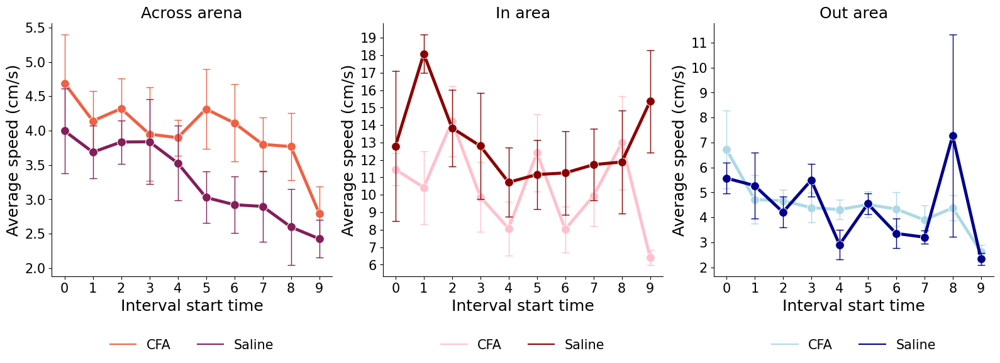

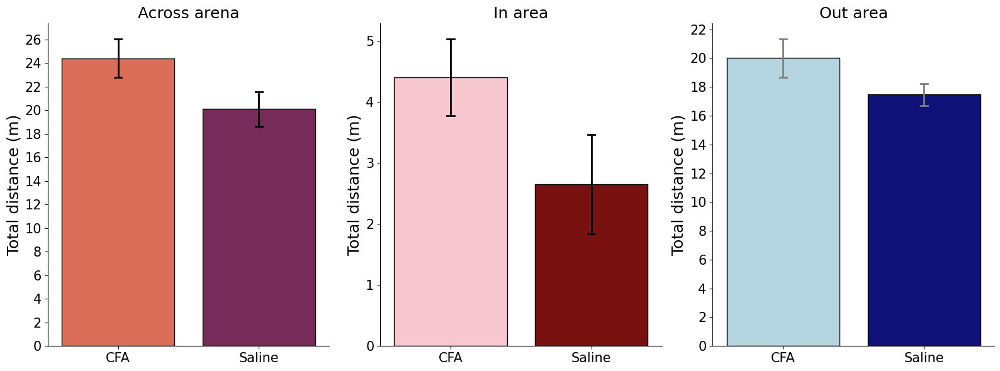

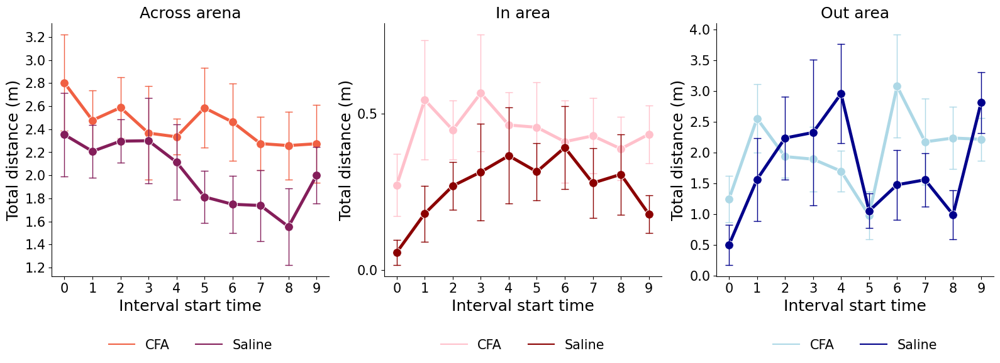

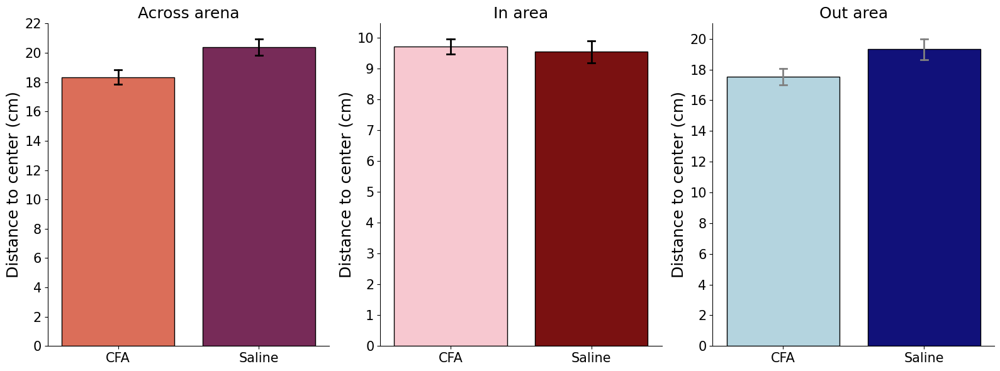

...

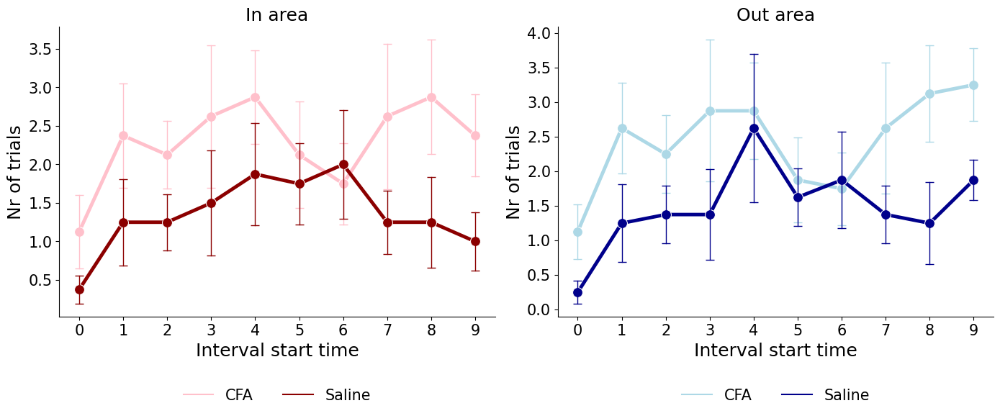

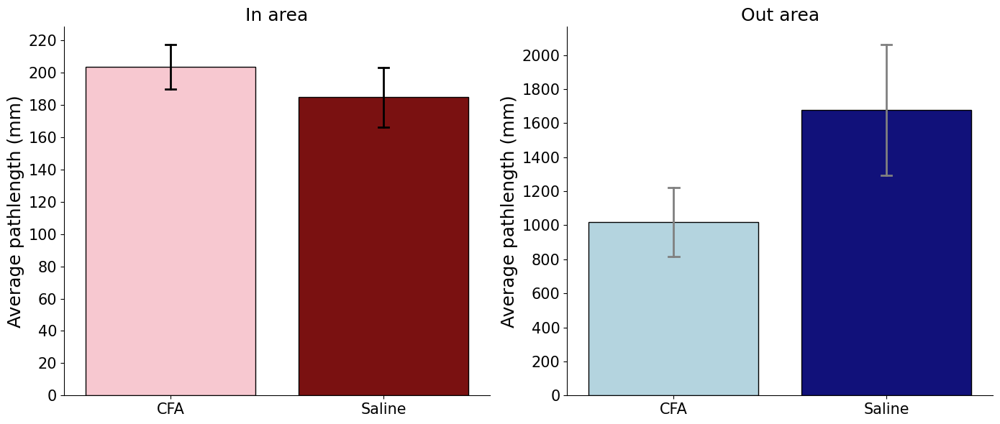

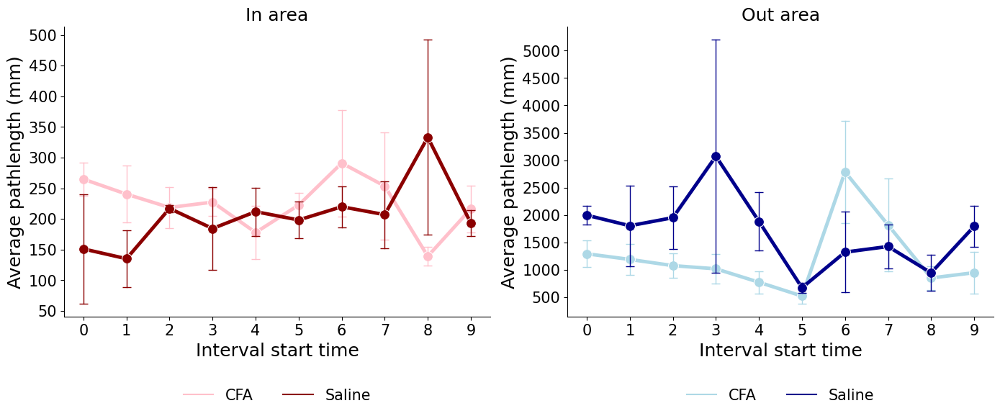

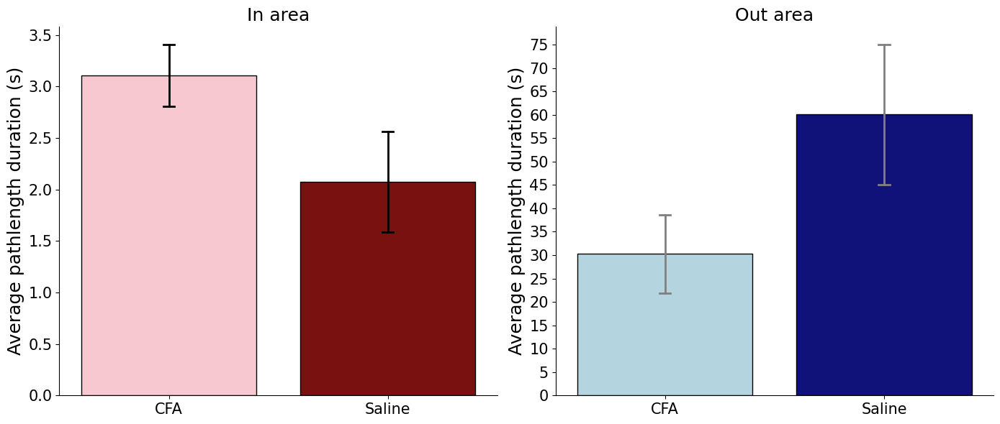

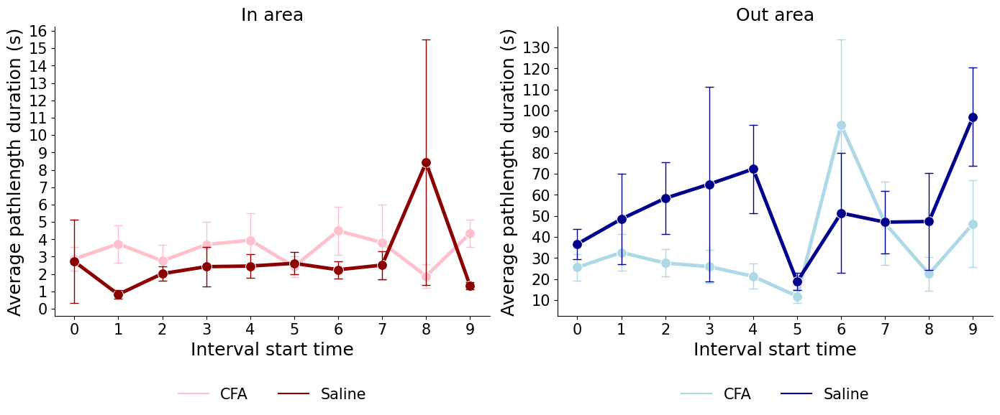

In [121]:
epoch = "bodypart_df_open"
x_major_increment = 1
experiment_duration = 10

# Plotting average speed 
ylabel = "Average speed (cm/s)"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "average_speed_total", y_tick_increment_total = 0.5,
                      y_in_column_name = "in_average_speed_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_speed_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_speed_total", y_tick_increment_total = 0.5,
                     y_in_column_name = "in_interval_speed_total", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_speed_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total distance 
ylabel = "Total distance (m)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "distance_total", y_tick_increment_total = 2,
                      y_in_column_name = "in_distance_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_distance_total", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_distance_total", y_tick_increment_total = 0.2,
                     y_in_column_name = "in_interval_distance_total", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_total", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting distance to center
ylabel = "Distance to center (cm)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "average_distance_to_center", y_tick_increment_total = 2,
                      y_in_column_name = "in_average_distance_to_center", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_distance_to_center", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )

interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_distance_to_center", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_distance_to_center", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_to_center", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total duration in/out area 
ylabel = "Total duration (min)"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_time_total", y_tick_increment_in = 0.1,  
                      y_out_column_name = "out_time_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = "NA",
                     y_in_column_name = "in_interval_time_total", y_tick_increment_in = 0.05, 
                     y_out_column_name = "out_interval_time_total", y_tick_increment_out = 0.3, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Nr of trials in/out area 
ylabel = "Nr of trials"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_nr_of_trials", y_tick_increment_in = 2,  
                      y_out_column_name = "out_nr_of_trials", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_nr_of_trials", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_nr_of_trials", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Average pathlengths mm in/out area 
ylabel = "Average pathlength (mm)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_mm", y_tick_increment_in = 20,  
                      y_out_column_name = "out_average_pathlength_mm", y_tick_increment_out = 200, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_average_pathlength_mm", y_tick_increment_in = 50, 
                     y_out_column_name = "out_interval_average_pathlength_mm", y_tick_increment_out = 500, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Average pathlength duration s in/out area 
ylabel = "Average pathlength duration (s)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_duration_s", y_tick_increment_in = 0.5,  
                      y_out_column_name = "out_average_pathlength_duration_s", y_tick_increment_out = 5, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_duration", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_duration", y_tick_increment_out = 10, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)




### OF_threat novel object 10min subsession

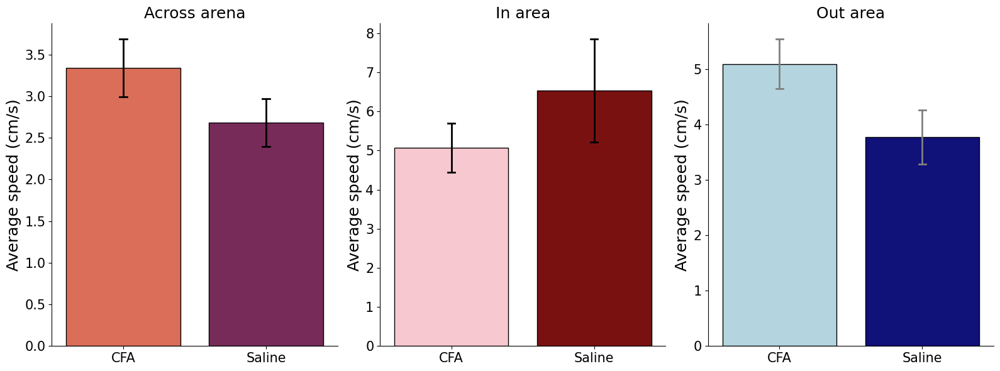

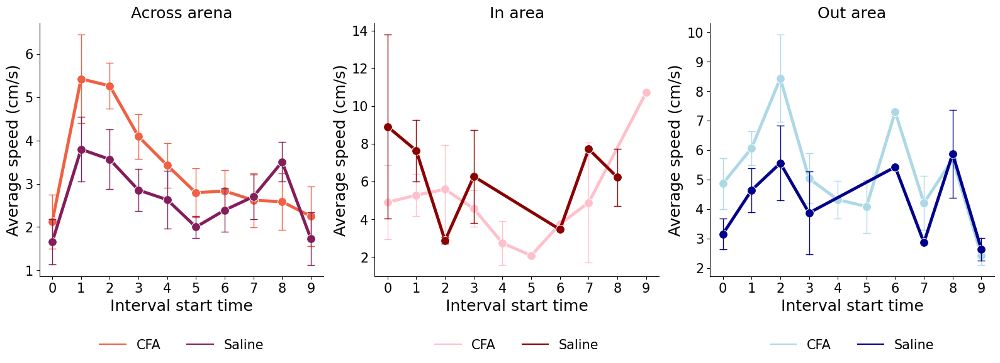

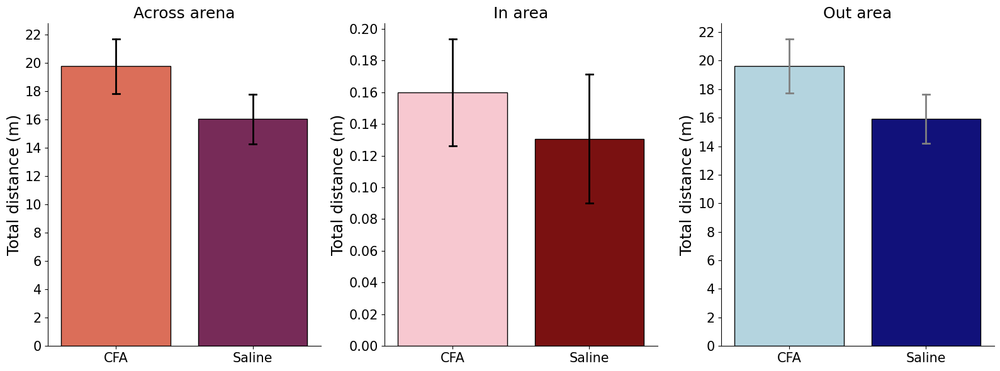

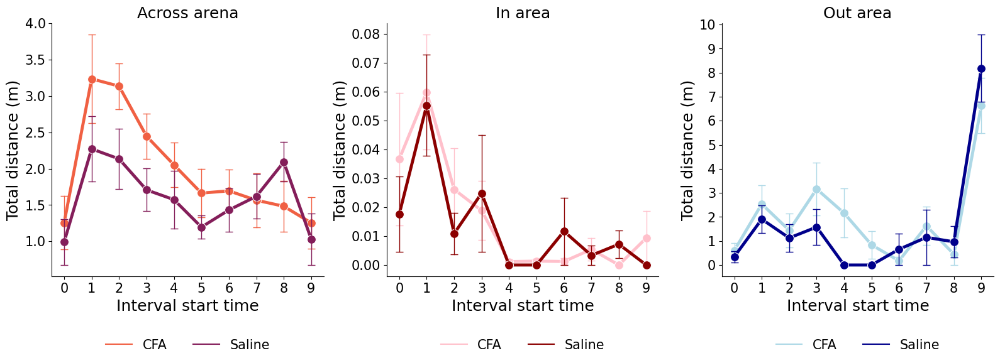

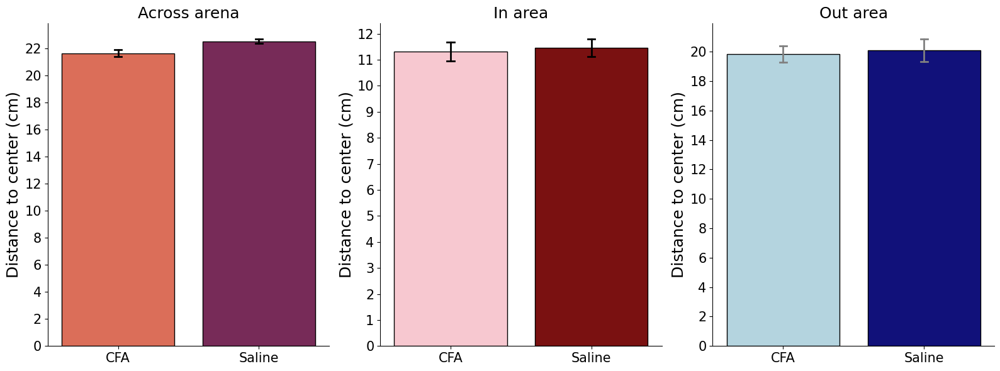

...

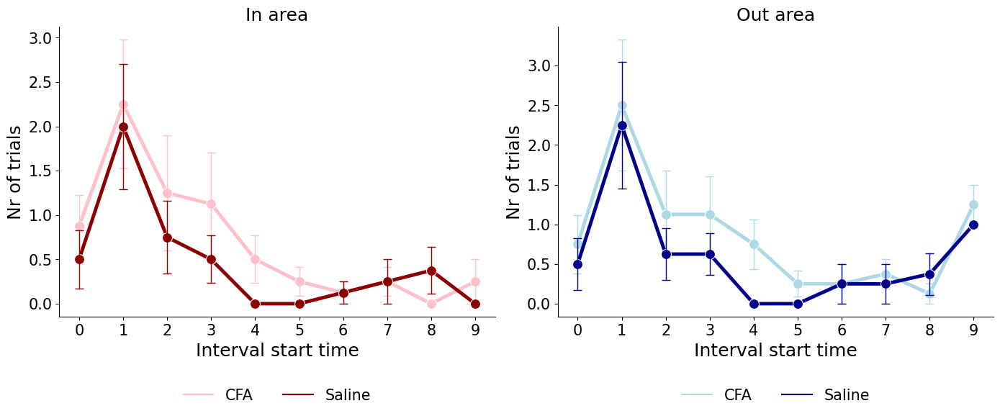

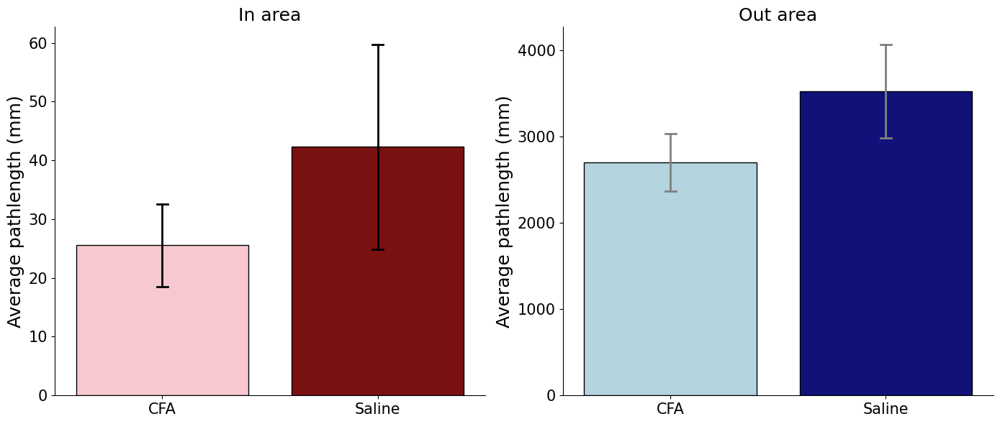

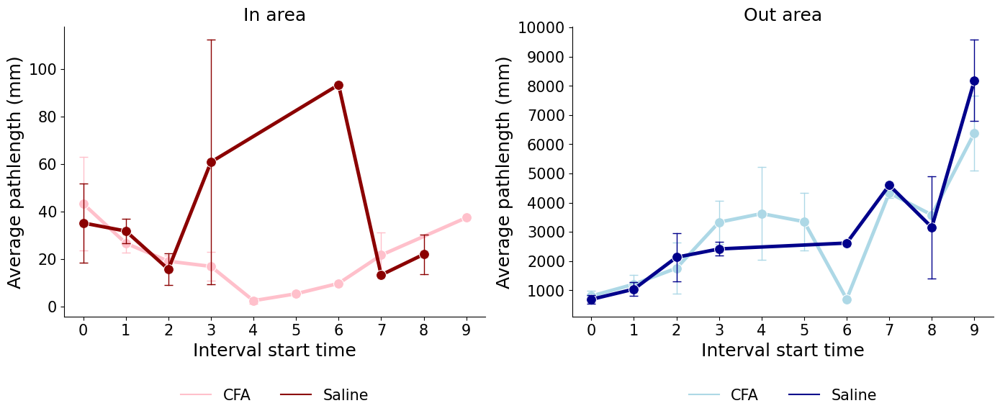

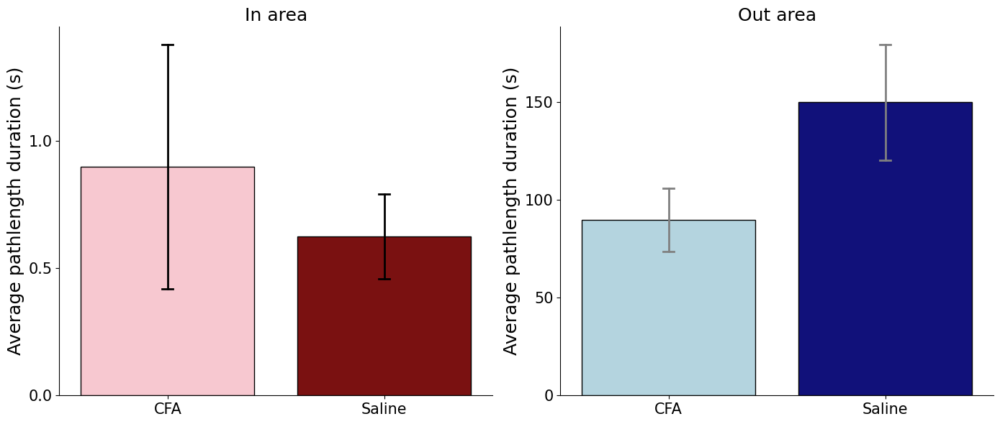

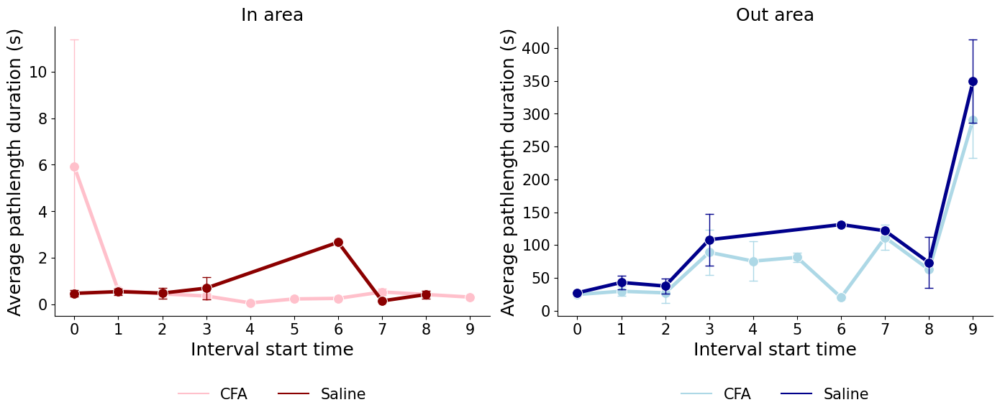

In [122]:
epoch = "bodypart_df_novel"
x_major_increment = 1
experiment_duration = 10


# Plotting average speed 
ylabel = "Average speed (cm/s)"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "average_speed_total", y_tick_increment_total = 0.5,
                      y_in_column_name = "in_average_speed_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_speed_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_speed_total", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_speed_total", y_tick_increment_in = 2, 
                     y_out_column_name = "out_interval_speed_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total distance 
ylabel = "Total distance (m)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "distance_total", y_tick_increment_total = 2,
                      y_in_column_name = "in_distance_total", y_tick_increment_in = 0.02,  
                      y_out_column_name = "out_distance_total", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_distance_total", y_tick_increment_total = 0.5,
                     y_in_column_name = "in_interval_distance_total", y_tick_increment_in = 0.01, 
                     y_out_column_name = "out_interval_distance_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting distance to center
ylabel = "Distance to center (cm)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "average_distance_to_center", y_tick_increment_total = 2,
                      y_in_column_name = "in_average_distance_to_center", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_distance_to_center", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_distance_to_center", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_distance_to_center", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_distance_to_center", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Plotting total duration in/out area 
ylabel = "Total duration (min)"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_time_total", y_tick_increment_in = 0.05,  
                      y_out_column_name = "out_time_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = "NA",
                     y_in_column_name = "in_interval_time_total", y_tick_increment_in = 0.02, 
                     y_out_column_name = "out_interval_time_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Nr of trials in/out area 
ylabel = "Nr of trials"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_nr_of_trials", y_tick_increment_in = 1,  
                      y_out_column_name = "out_nr_of_trials", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_nr_of_trials", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_nr_of_trials", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Average pathlengths mm in/out area 
ylabel = "Average pathlength (mm)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_mm", y_tick_increment_in = 10,  
                      y_out_column_name = "out_average_pathlength_mm", y_tick_increment_out = 1000, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_average_pathlength_mm", y_tick_increment_in = 20, 
                     y_out_column_name = "out_interval_average_pathlength_mm", y_tick_increment_out = 1000, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Average pathlength duration s in/out area 
ylabel = "Average pathlength duration (s)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_duration_s", y_tick_increment_in = 0.5,  
                      y_out_column_name = "out_average_pathlength_duration_s", y_tick_increment_out = 50, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 50,
                     y_in_column_name = "in_interval_duration", y_tick_increment_in = 2, 
                     y_out_column_name = "out_interval_duration", y_tick_increment_out = 50, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)




### OF_threat post-object 10min session

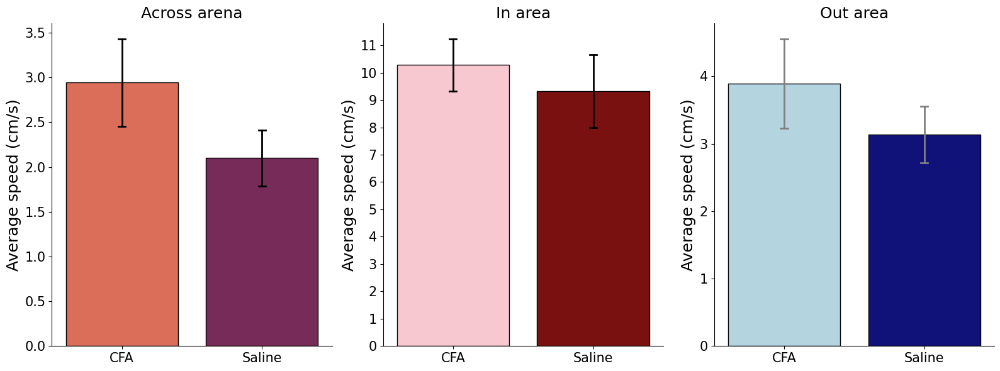

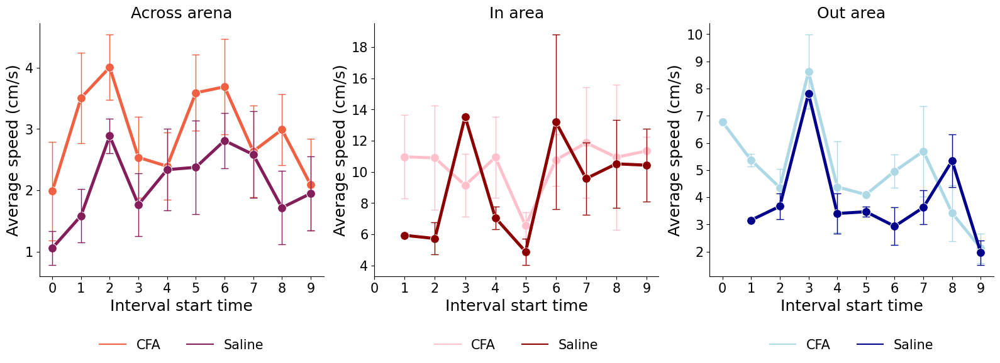

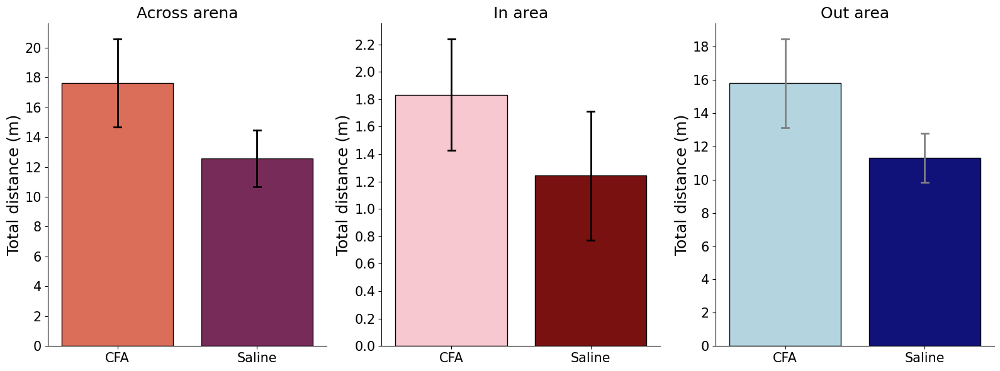

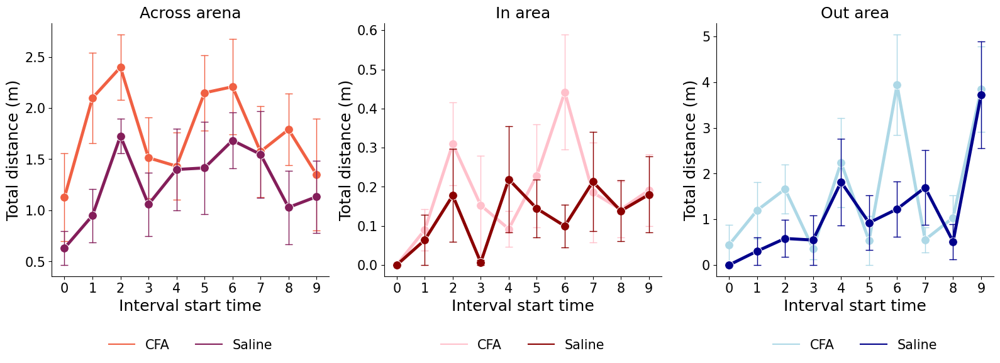

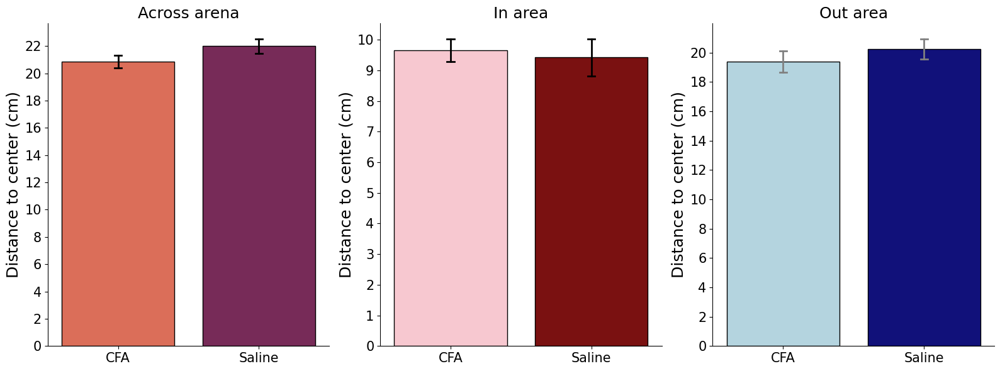

...

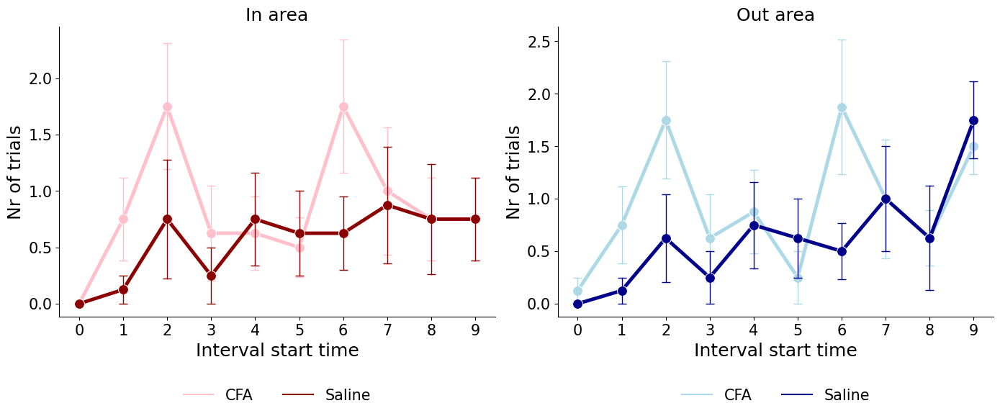

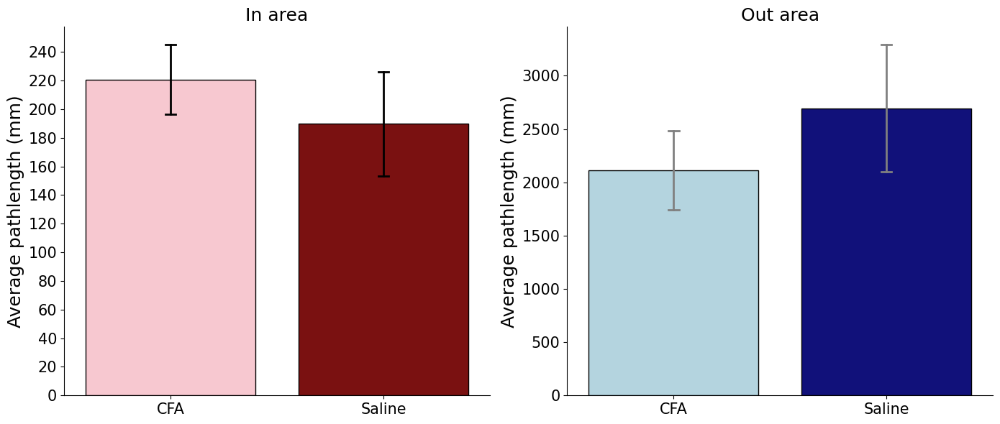

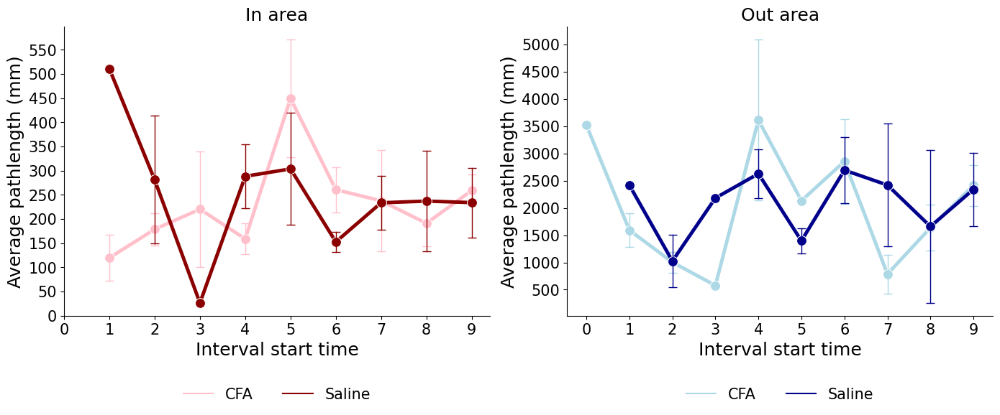

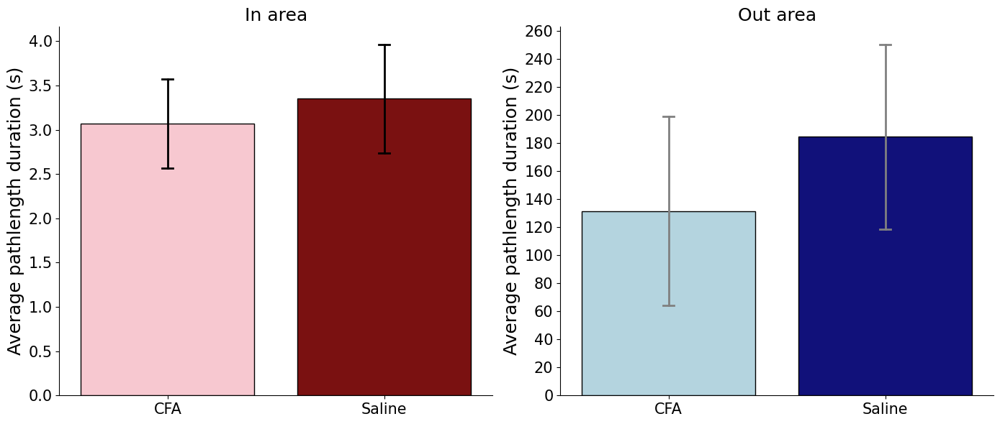

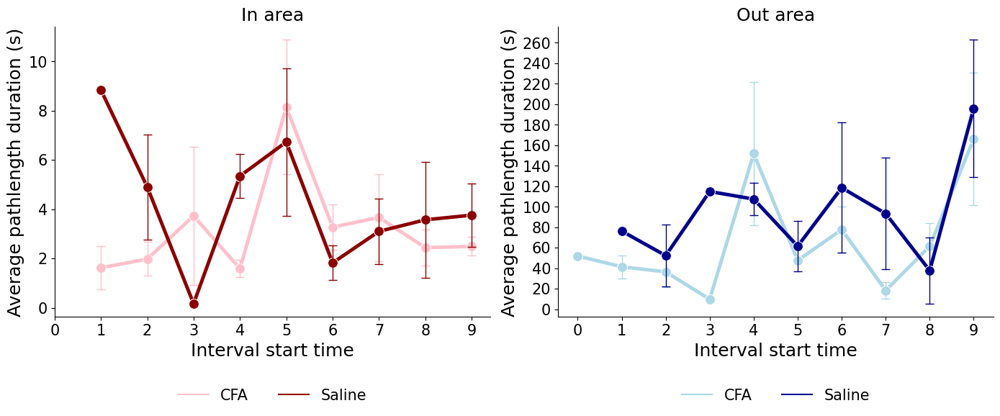

In [123]:
epoch = "bodypart_df_post_object"
experiment_duration = 10
x_major_increment = 1

# Plotting average speed 
ylabel = "Average speed (cm/s)"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "average_speed_total", y_tick_increment_total = 0.5,
                      y_in_column_name = "in_average_speed_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_speed_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_speed_total", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_speed_total", y_tick_increment_in = 2, 
                     y_out_column_name = "out_interval_speed_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total distance 
ylabel = "Total distance (m)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "distance_total", y_tick_increment_total = 2,
                      y_in_column_name = "in_distance_total", y_tick_increment_in = 0.2,  
                      y_out_column_name = "out_distance_total", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_distance_total", y_tick_increment_total = 0.5,
                     y_in_column_name = "in_interval_distance_total", y_tick_increment_in = 0.1, 
                     y_out_column_name = "out_interval_distance_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting distance to center
ylabel = "Distance to center (cm)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "average_distance_to_center", y_tick_increment_total = 2,
                      y_in_column_name = "in_average_distance_to_center", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_distance_to_center", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_distance_to_center", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_distance_to_center", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_distance_to_center", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Plotting total duration in/out area 
ylabel = "Total duration (min)"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_time_total", y_tick_increment_in = 0.05,  
                      y_out_column_name = "out_time_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = "NA",
                     y_in_column_name = "in_interval_time_total", y_tick_increment_in = 0.02, 
                     y_out_column_name = "out_interval_time_total", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Nr of trials in/out area 
ylabel = "Nr of trials"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_nr_of_trials", y_tick_increment_in = 1,  
                      y_out_column_name = "out_nr_of_trials", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_nr_of_trials", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_nr_of_trials", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Average pathlengths mm in/out area 
ylabel = "Average pathlength (mm)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_mm", y_tick_increment_in = 20,  
                      y_out_column_name = "out_average_pathlength_mm", y_tick_increment_out = 500, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_average_pathlength_mm", y_tick_increment_in = 50, 
                     y_out_column_name = "out_interval_average_pathlength_mm", y_tick_increment_out = 500, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Average pathlength duration s in/out area 
ylabel = "Average pathlength duration (s)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_duration_s", y_tick_increment_in = 0.5,  
                      y_out_column_name = "out_average_pathlength_duration_s", y_tick_increment_out = 20, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 50,
                     y_in_column_name = "in_interval_duration", y_tick_increment_in = 2, 
                     y_out_column_name = "out_interval_duration", y_tick_increment_out = 20, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)




### OF_threat threat tone 10min session

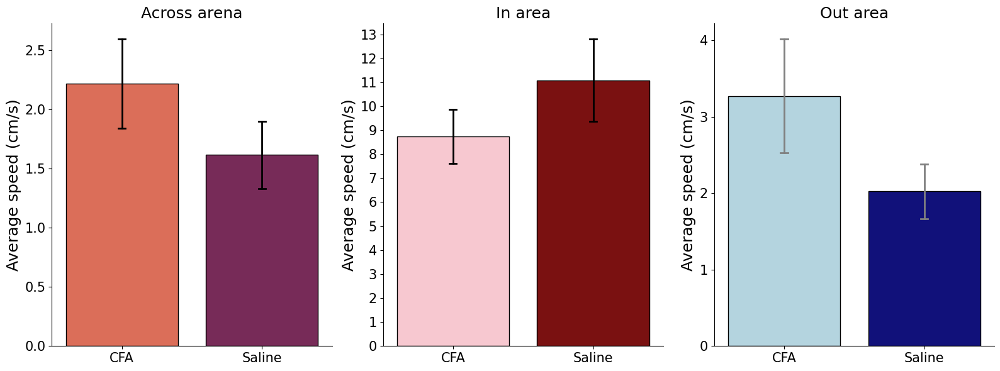

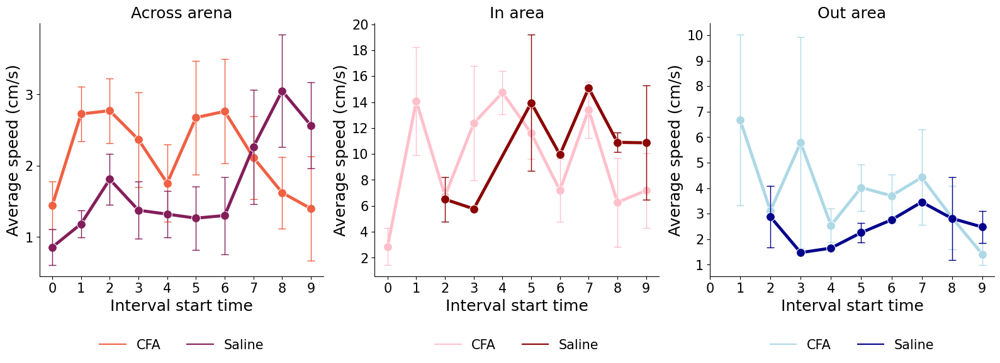

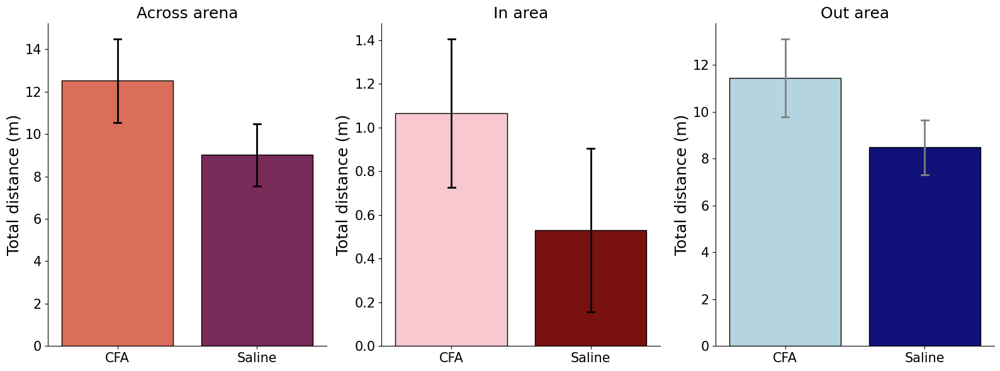

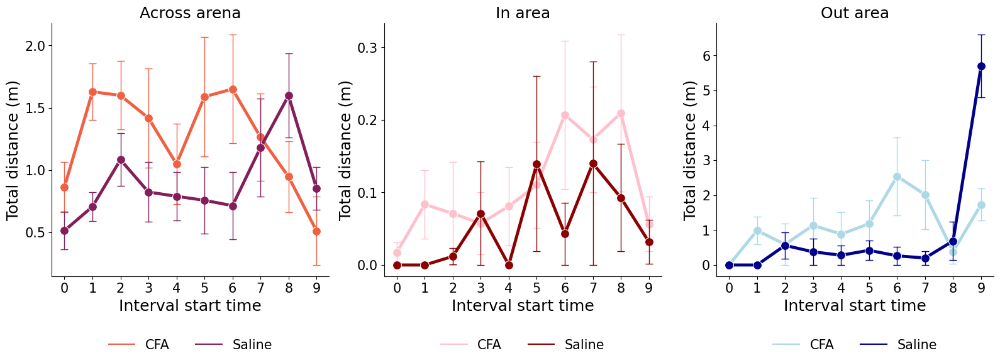

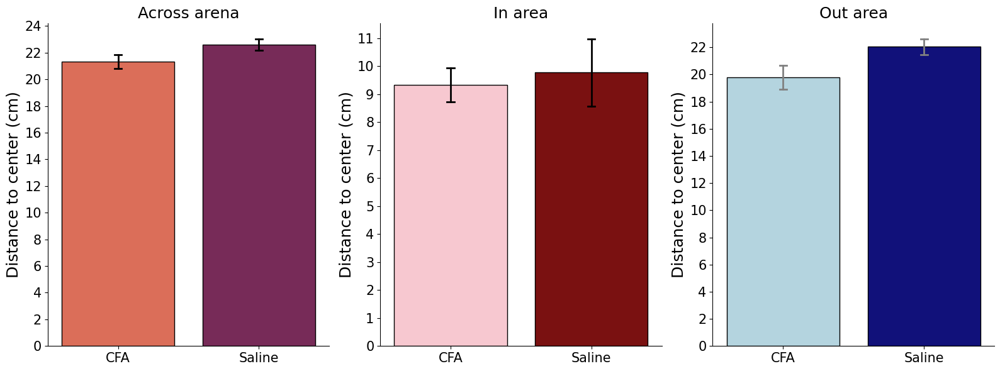

...

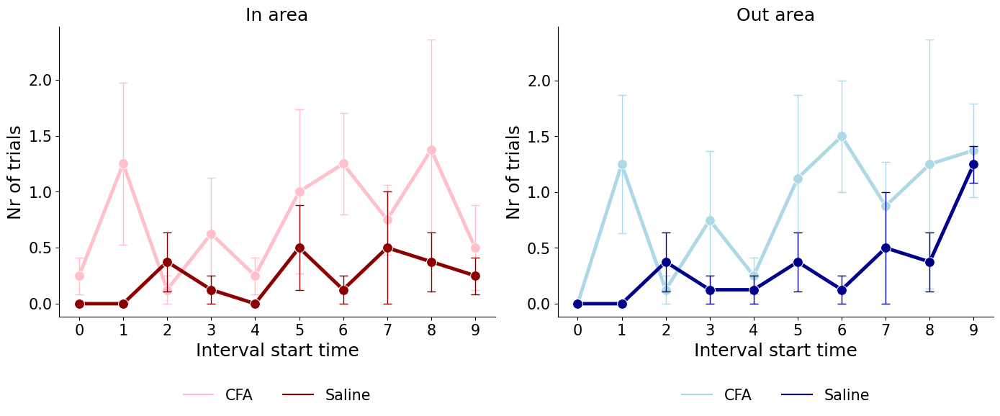

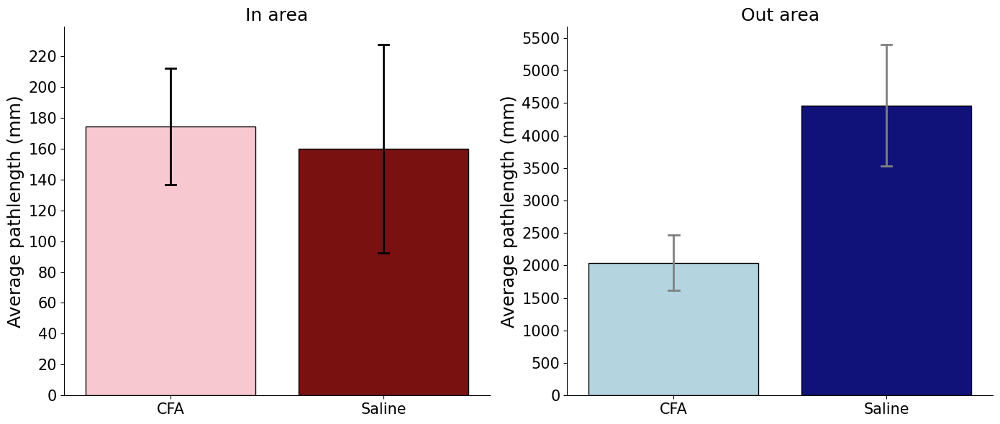

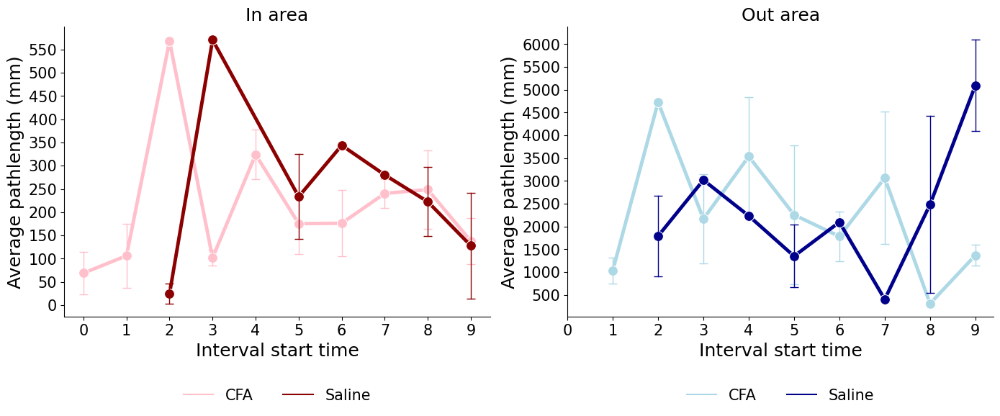

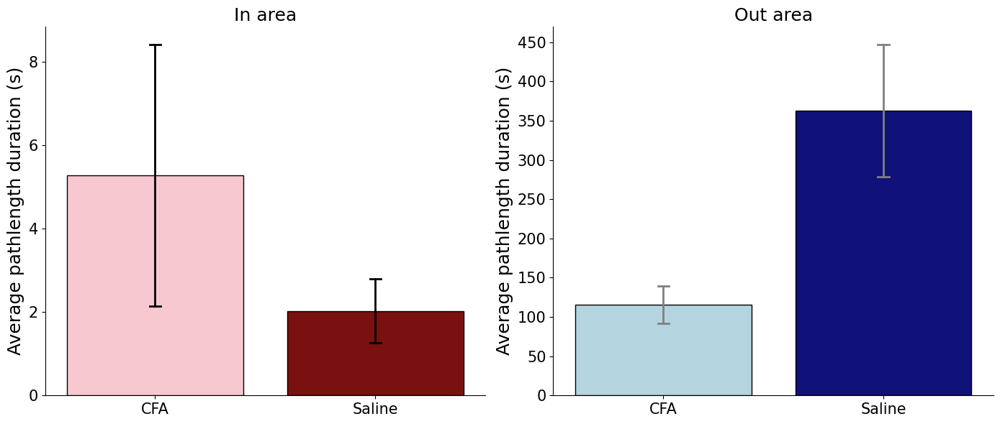

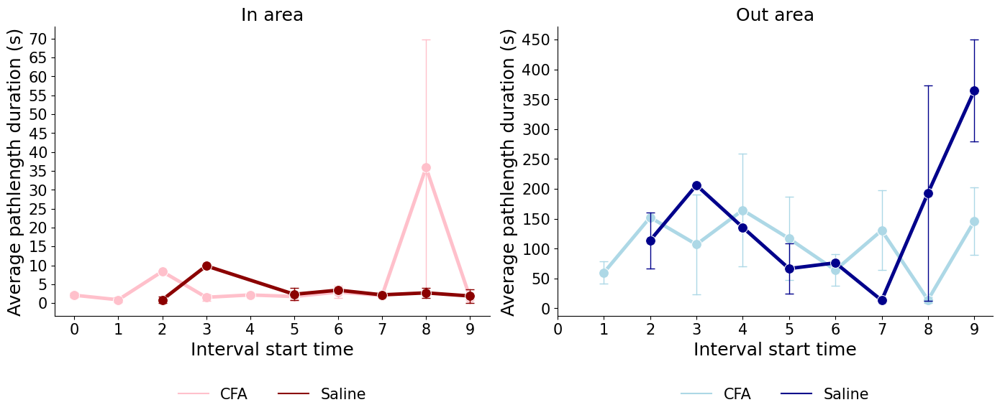

In [109]:
epoch = "bodypart_df_threat"
x_major_increment = 1
experiment_duration = 10

# Plotting average speed 
ylabel = "Average speed (cm/s)"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "average_speed_total", y_tick_increment_total = 0.5,
                      y_in_column_name = "in_average_speed_total", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_speed_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_speed_total", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_speed_total", y_tick_increment_in = 2, 
                     y_out_column_name = "out_interval_speed_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting total distance 
ylabel = "Total distance (m)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "distance_total", y_tick_increment_total = 2,
                      y_in_column_name = "in_distance_total", y_tick_increment_in = 0.2,  
                      y_out_column_name = "out_distance_total", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_distance_total", y_tick_increment_total = 0.5,
                     y_in_column_name = "in_interval_distance_total", y_tick_increment_in = 0.1, 
                     y_out_column_name = "out_interval_distance_total", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Plotting distance to center
ylabel = "Distance to center (cm)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "average_distance_to_center", y_tick_increment_total = 2,
                      y_in_column_name = "in_average_distance_to_center", y_tick_increment_in = 1,  
                      y_out_column_name = "out_average_distance_to_center", y_tick_increment_out = 2, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="interval_distance_to_center", y_tick_increment_total = 1,
                     y_in_column_name = "in_interval_distance_to_center", y_tick_increment_in = 1, 
                     y_out_column_name = "out_interval_distance_to_center", y_tick_increment_out = 1, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Plotting total duration in/out area 
ylabel = "Total duration (min)"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_time_total", y_tick_increment_in = 0.05,  
                      y_out_column_name = "out_time_total", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = "NA",
                     y_in_column_name = "in_interval_time_total", y_tick_increment_in = 0.05, 
                     y_out_column_name = "out_interval_time_total", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Nr of trials in/out area 
ylabel = "Nr of trials"
total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_nr_of_trials", y_tick_increment_in = 1,  
                      y_out_column_name = "out_nr_of_trials", y_tick_increment_out = 1, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_nr_of_trials", y_tick_increment_in = 0.5, 
                     y_out_column_name = "out_interval_nr_of_trials", y_tick_increment_out = 0.5, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)

# Average pathlengths mm in/out area 
ylabel = "Average pathlength (mm)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_mm", y_tick_increment_in = 20,  
                      y_out_column_name = "out_average_pathlength_mm", y_tick_increment_out = 500, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 2,
                     y_in_column_name = "in_interval_average_pathlength_mm", y_tick_increment_in = 50, 
                     y_out_column_name = "out_interval_average_pathlength_mm", y_tick_increment_out = 500, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)


# Average pathlength duration s in/out area 
ylabel = "Average pathlength duration (s)"

total_time_barplotter(df = object_result_dict[epoch]["total_df"], y_total_column_name = "None", y_tick_increment_total = "NA",
                      y_in_column_name = "in_average_pathlength_duration_s", y_tick_increment_in = 2,  
                      y_out_column_name = "out_average_pathlength_duration_s", y_tick_increment_out = 50, 
                      ylabel = ylabel, 
                      xlabel = "" )
interval_lineplotter(df = object_result_dict[epoch]["interval_df"], y_total_column_name ="None", y_tick_increment_total = 50,
                     y_in_column_name = "in_interval_duration", y_tick_increment_in = 5, 
                     y_out_column_name = "out_interval_duration", y_tick_increment_out = 50, 
                     ylabel = ylabel, xlabel = "Interval start time", x_major_increment = x_major_increment, experiment_duration = experiment_duration)




## Barplots and lineplots (Plots for each subsession in same row)

### Barplots

Averagee speed
Averagee speed
Averagee speed


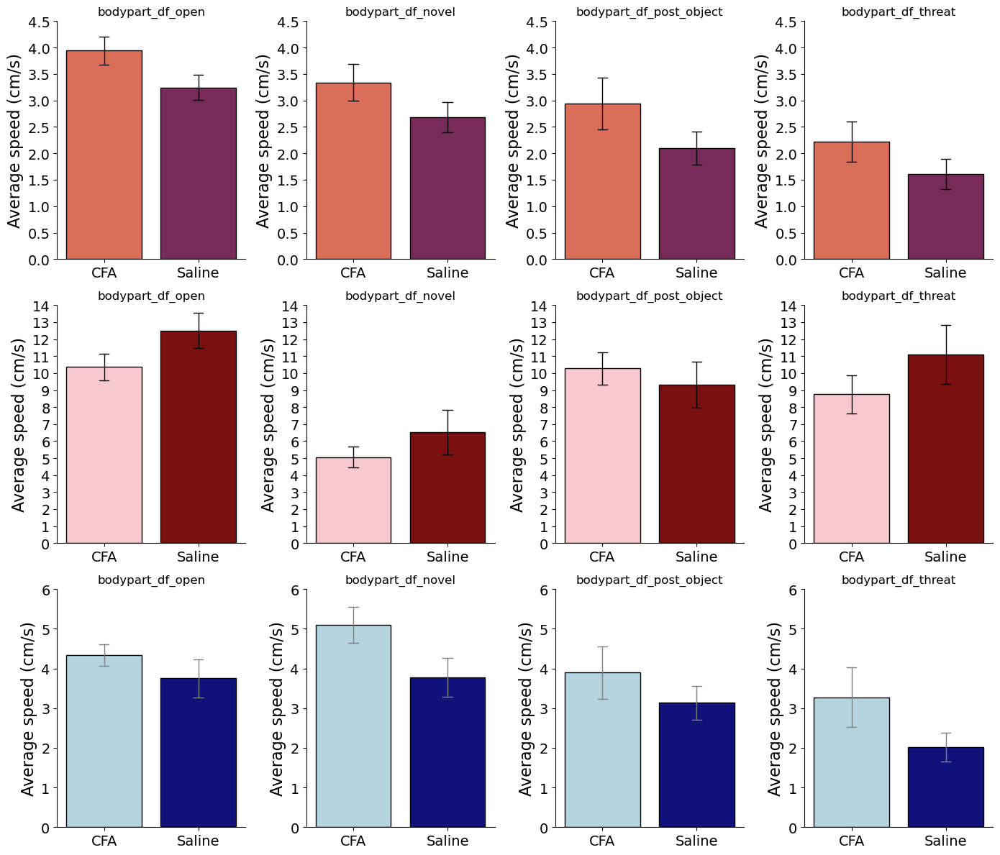

Total distance
Total distance
Total distance


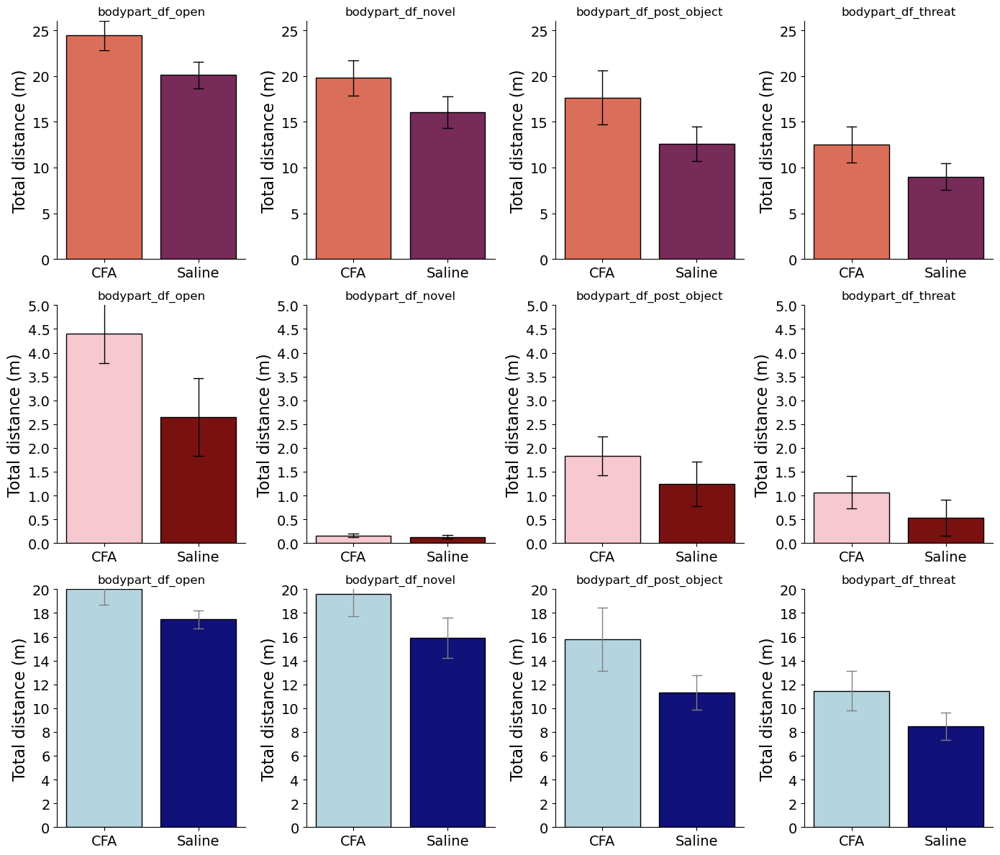

Distance to centre
Distance to centre
Distance to centre


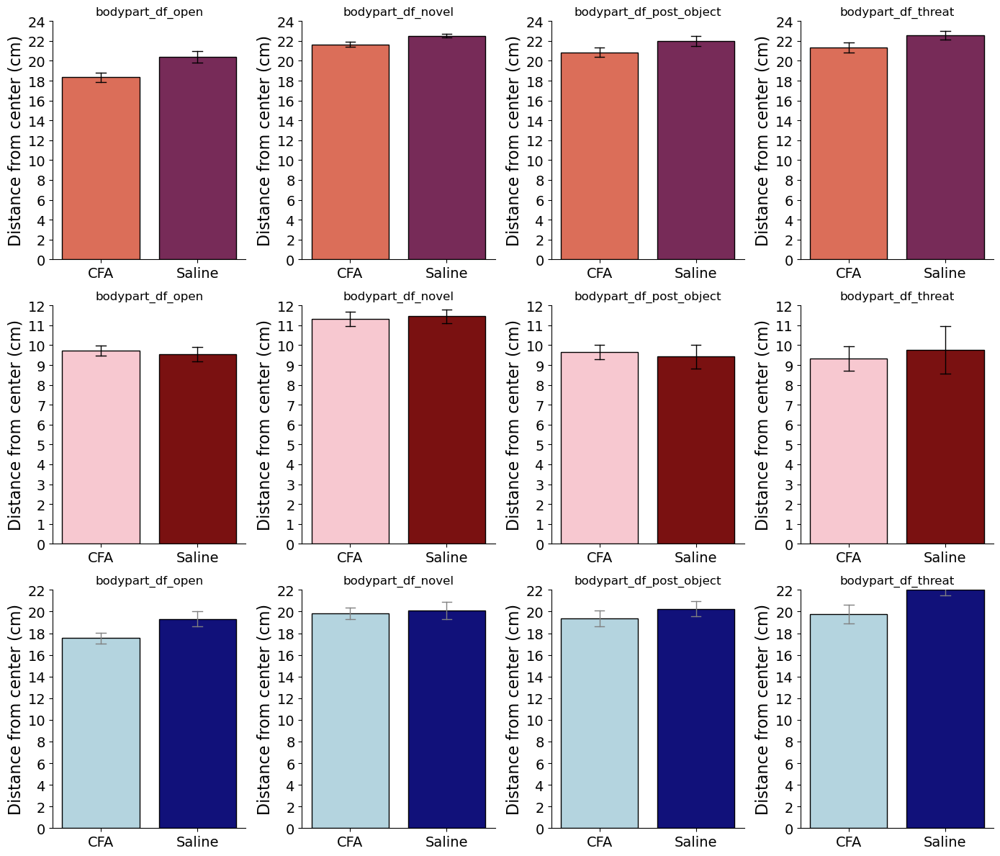

Time in/out centre 
Time in/out centre 
Time in/out centre 


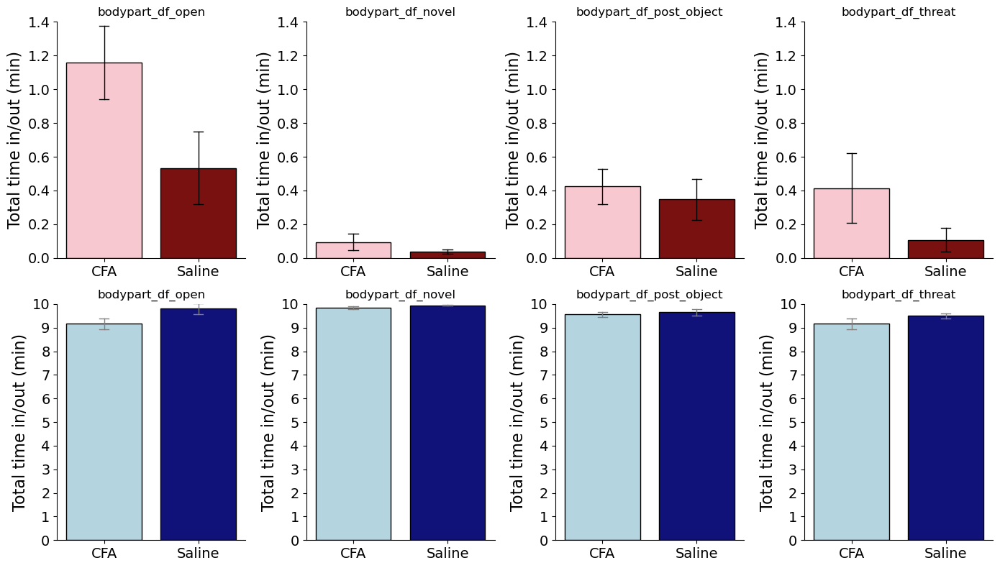

Nr of trials
Nr of trials
Nr of trials


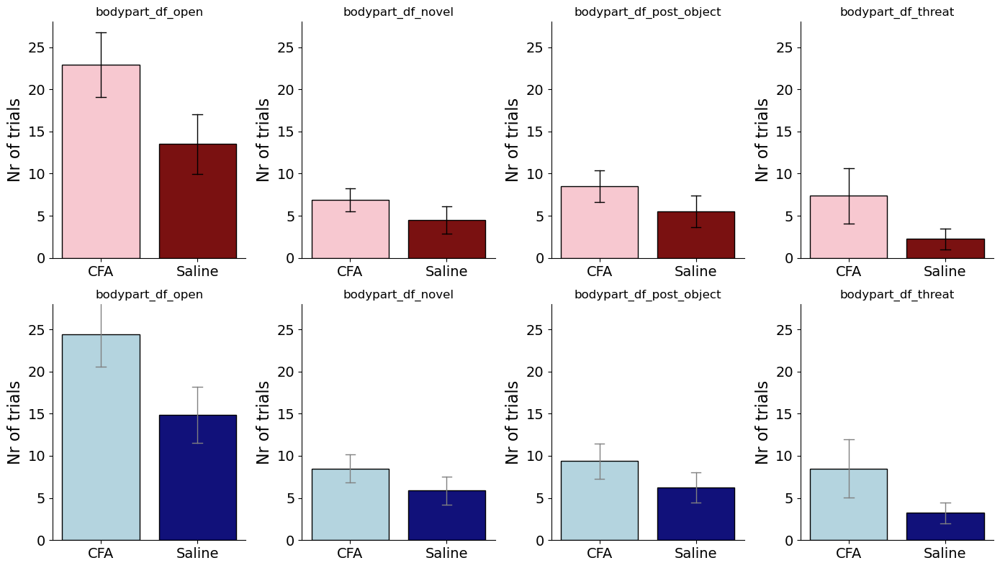

Average pathlength
Average pathlength
Average pathlength


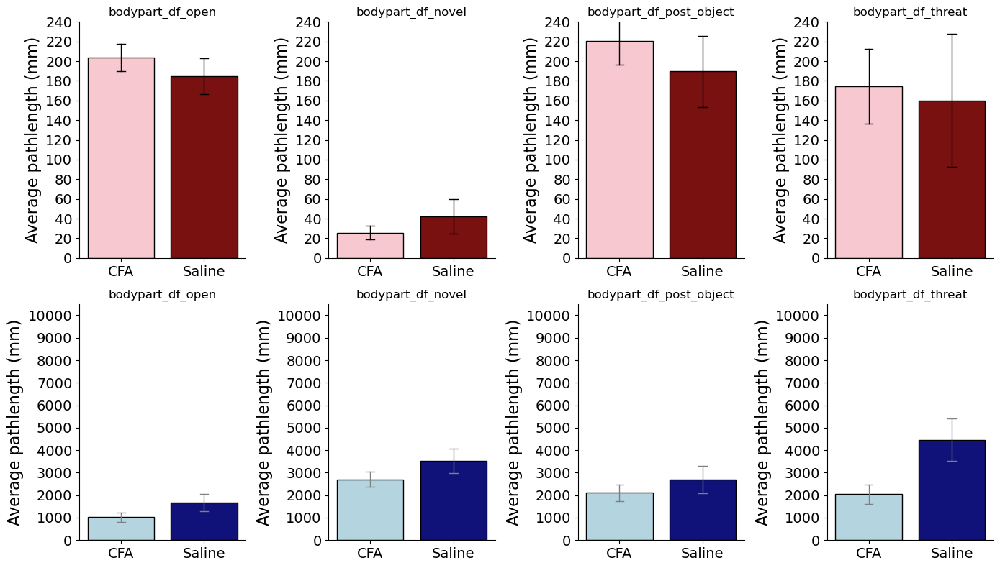

Average pathlength duration
Average pathlength duration
Average pathlength duration


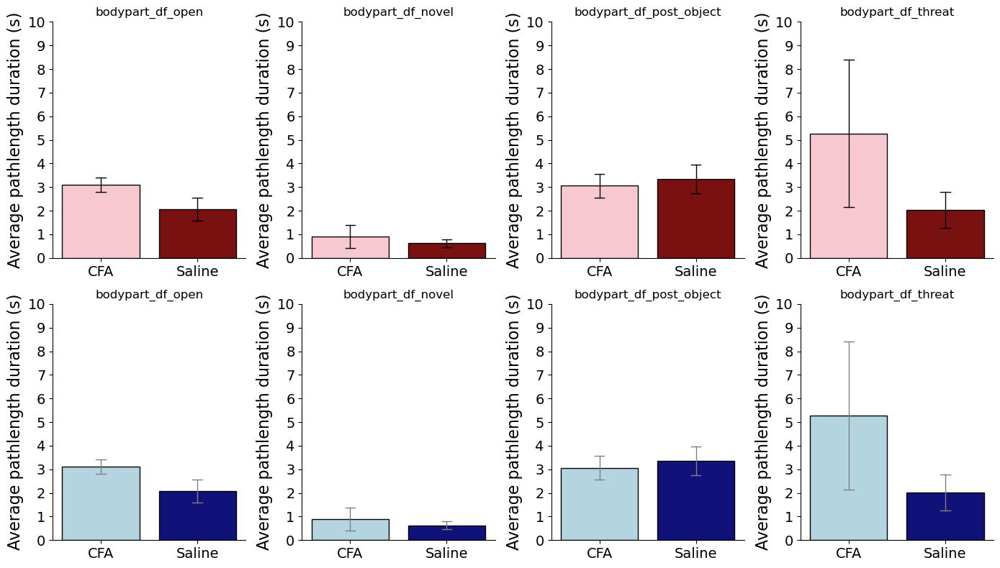

In [134]:
print("Averagee speed")
print("Averagee speed")
print("Averagee speed")

total_barplotter_all_OF_threat(total_column_name = "average_speed_total", in_column_name = "in_average_speed_total", 
                               out_column_name = "out_average_speed_total", y_total_major_tick = 0.5, y_in_major_tick = 1, 
                               y_out_major_tick = 1, total_ylim = 4.5, in_ylim = 14 , out_ylim = 6, xlabel = "", ylabel = "Average speed (cm/s)")

print("Total distance")
print("Total distance")
print("Total distance")

total_barplotter_all_OF_threat(total_column_name = "distance_total", in_column_name = "in_distance_total", 
                               out_column_name = "out_distance_total", y_total_major_tick = 5, y_in_major_tick = 0.5, 
                               y_out_major_tick = 2, total_ylim = 26, in_ylim = 5 , out_ylim = 20, xlabel = "", ylabel = "Total distance (m)")
print("Distance to centre")
print("Distance to centre")
print("Distance to centre")

total_barplotter_all_OF_threat(total_column_name = "average_distance_to_center", in_column_name = "in_average_distance_to_center", 
                               out_column_name = "out_average_distance_to_center", y_total_major_tick = 2, y_in_major_tick = 1, 
                               y_out_major_tick = 2, total_ylim = 24, in_ylim = 12 , out_ylim = 22, xlabel = "", ylabel = "Distance from center (cm)")
print("Time in/out centre ")
print("Time in/out centre ")
print("Time in/out centre ")

total_barplotter_all_OF_threat(total_column_name = "None", in_column_name = "in_time_total", 
                               out_column_name = "out_time_total", y_total_major_tick = 2, y_in_major_tick = 0.2, 
                               y_out_major_tick = 1, total_ylim = 4.5, in_ylim = 1.4 , out_ylim = 10, xlabel = "", ylabel = "Total time in/out (min)")

print("Nr of trials")
print("Nr of trials")
print("Nr of trials")

total_barplotter_all_OF_threat(total_column_name = "None", in_column_name = "in_nr_of_trials", 
                               out_column_name = "out_nr_of_trials", y_total_major_tick = 2, y_in_major_tick = 5, 
                               y_out_major_tick = 5, total_ylim = 28, in_ylim = 28 , out_ylim = 28, xlabel = "", ylabel = "Nr of trials")

print("Average pathlength")
print("Average pathlength")
print("Average pathlength")

total_barplotter_all_OF_threat(total_column_name = "None", in_column_name = "in_average_pathlength_mm", 
                               out_column_name = "out_average_pathlength_mm", y_total_major_tick = 2, y_in_major_tick = 20, 
                               y_out_major_tick = 1000, total_ylim = 4.5, in_ylim = 240 , out_ylim = 10500, xlabel = "", ylabel = "Average pathlength (mm)")

print("Average pathlength duration")
print("Average pathlength duration")
print("Average pathlength duration")

total_barplotter_all_OF_threat(total_column_name = "None", in_column_name = "in_average_pathlength_duration_s", 
                               out_column_name = "in_average_pathlength_duration_s", y_total_major_tick = 2, y_in_major_tick = 1, 
                               y_out_major_tick = 1, total_ylim = 4.5, in_ylim = 10 , out_ylim = 10, xlabel = "", ylabel = "Average pathlength duration (s)")

### Lineplots

Averagee speed
Averagee speed
Averagee speed


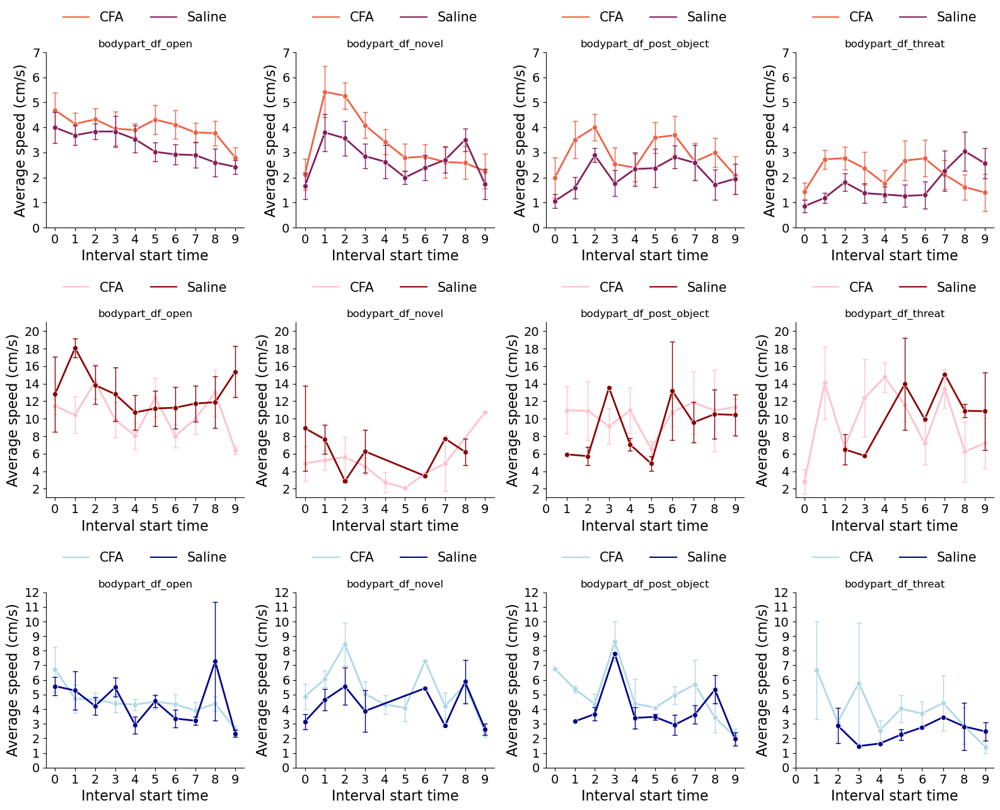

Total distance
Total distance
Total distance


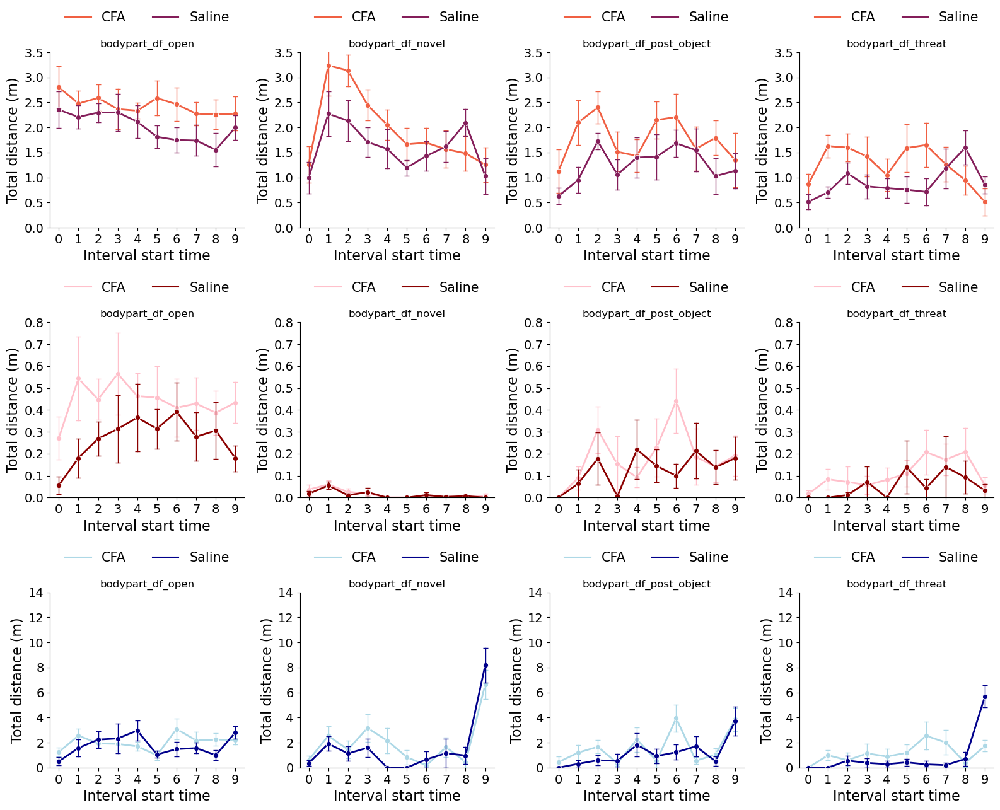

Distance to centre
Distance to centre
Distance to centre


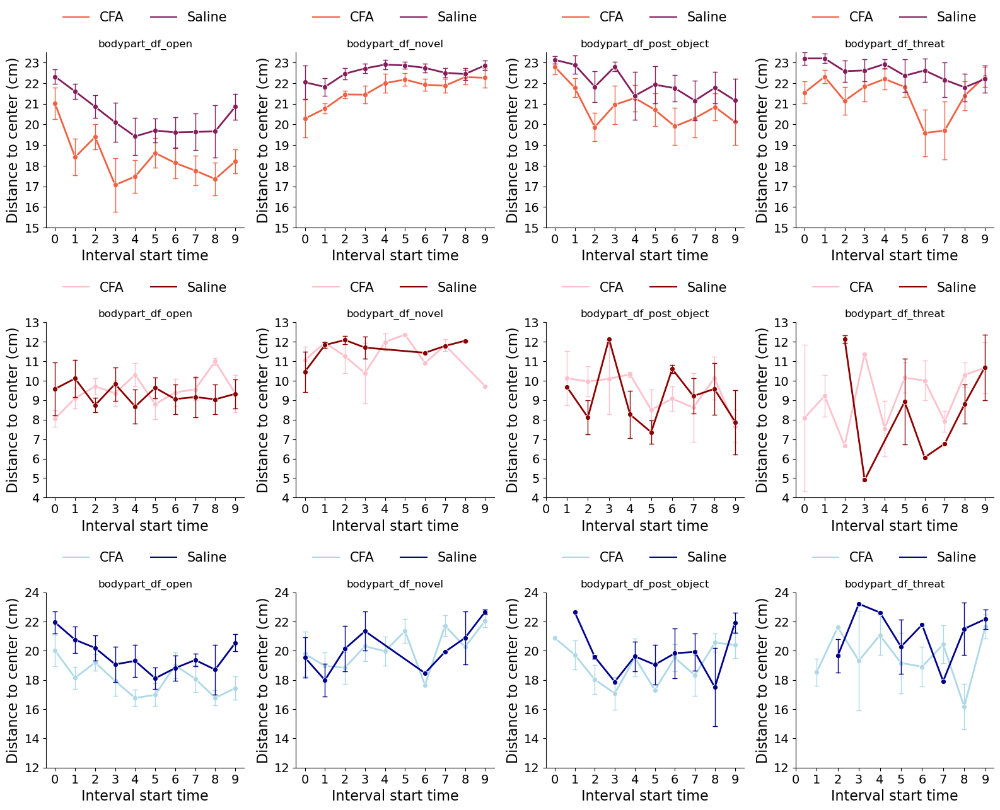

Time in/out centre 
Time in/out centre 
Time in/out centre 


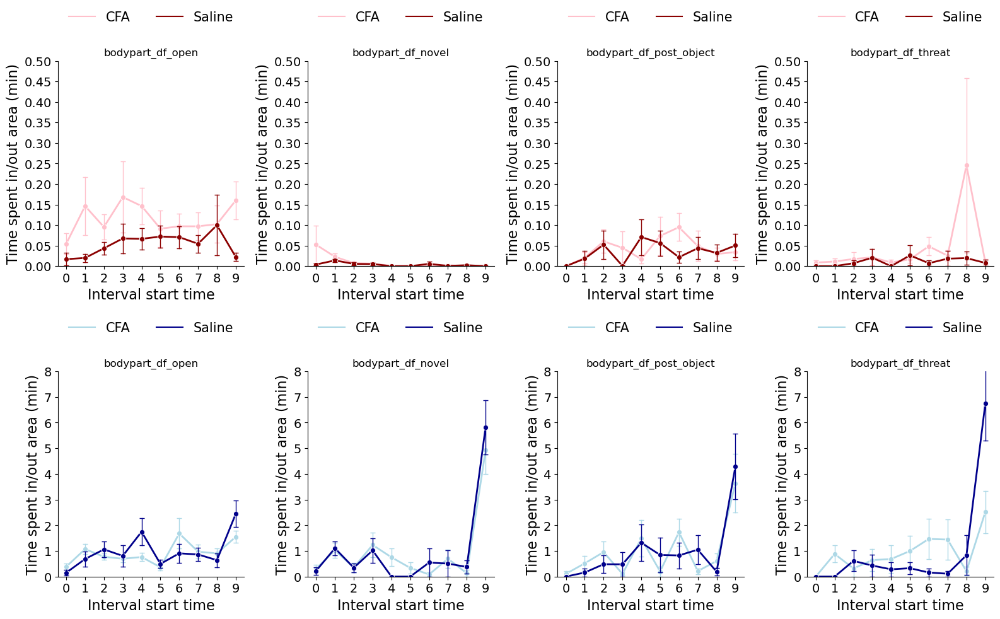

Nr of trials
Nr of trials
Nr of trials


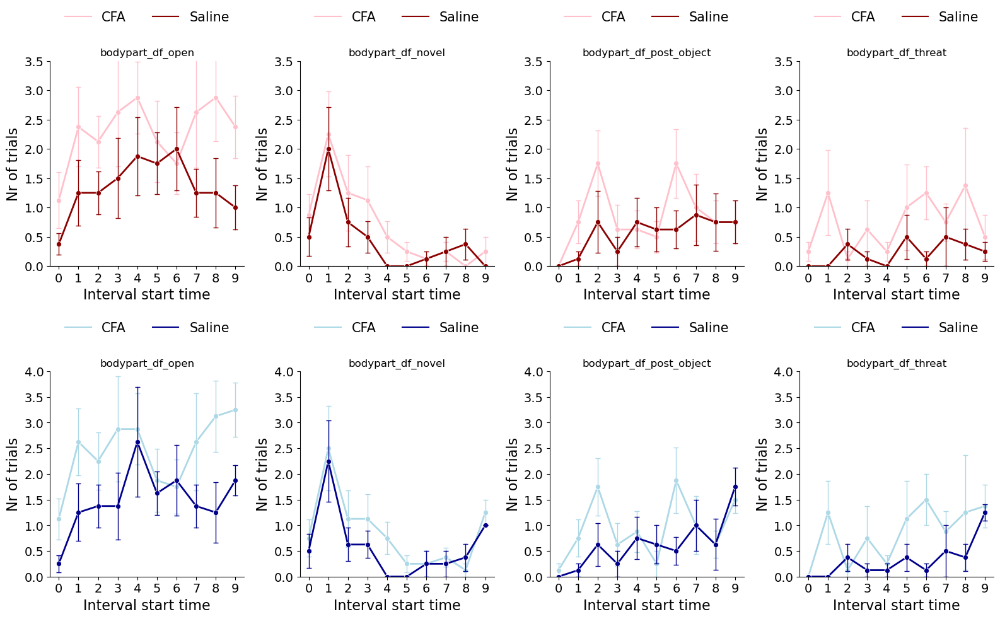

Average pathlength
Average pathlength
Average pathlength


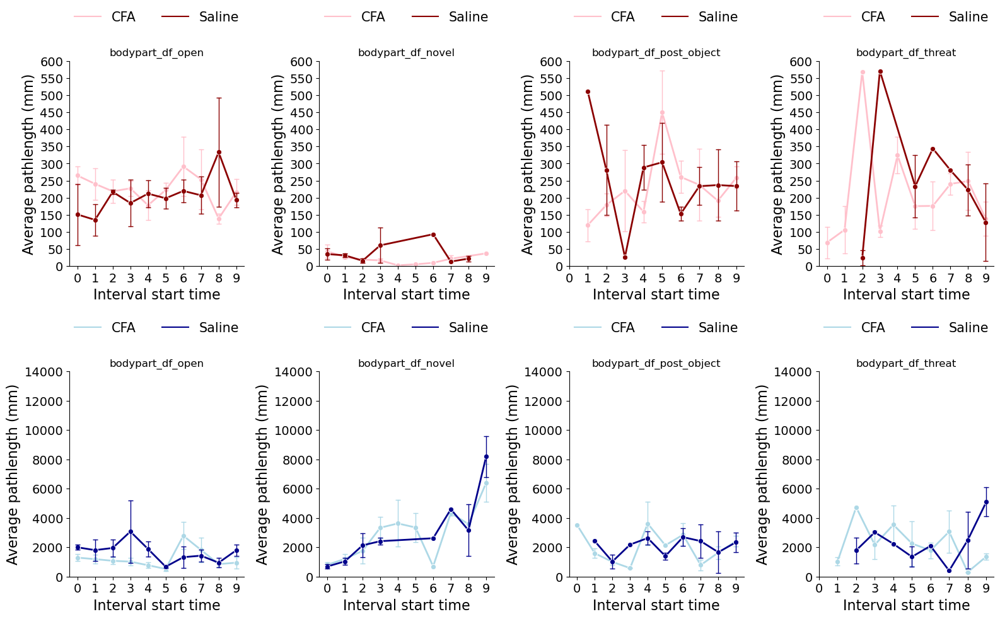

Average pathlength duration
Average pathlength duration
Average pathlength duration


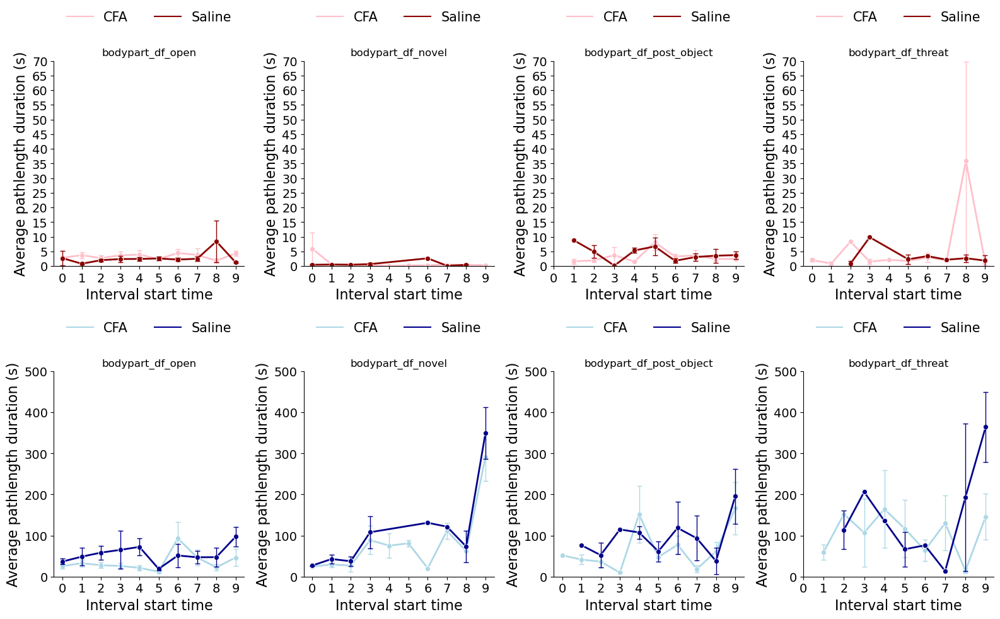

In [158]:
print("Averagee speed")
print("Averagee speed")
print("Averagee speed")

total_lineplotter_all_OF_threat(total_column_name = "interval_speed_total", in_column_name = "in_interval_speed_total", out_column_name = "out_interval_speed_total", 
                                xlabel = "Interval start time", ylabel = "Average speed (cm/s)", 
                                y_total_major_tick = 1, total_ylim = (0, 7),
                                y_in_major_tick = 2, in_ylim = (1, 21),
                                y_out_major_tick = 1, out_ylim = (0, 12))

print("Total distance")
print("Total distance")
print("Total distance")
total_lineplotter_all_OF_threat(total_column_name = "interval_distance_total", in_column_name = "in_interval_distance_total", out_column_name = "out_interval_distance_total", 
                                xlabel = "Interval start time", ylabel = "Total distance (m)", 
                                y_total_major_tick = 0.5, total_ylim = (0, 3.5),
                                y_in_major_tick = 0.1, in_ylim = (0, 0.8),
                                y_out_major_tick = 2, out_ylim = (0, 14))

print("Distance to centre")
print("Distance to centre")
print("Distance to centre")
total_lineplotter_all_OF_threat(total_column_name = "interval_distance_to_center", in_column_name = "in_interval_distance_to_center", out_column_name = "out_interval_distance_to_center", 
                                xlabel = "Interval start time", ylabel = "Distance to center (cm)", 
                                y_total_major_tick = 1, total_ylim = (15, 23.5),
                                y_in_major_tick = 1, in_ylim = (4, 13),
                                y_out_major_tick = 2, out_ylim = (12, 24))

print("Time in/out centre ")
print("Time in/out centre ")
print("Time in/out centre ")
total_lineplotter_all_OF_threat(total_column_name = "None", in_column_name = "in_interval_time_total", out_column_name = "out_interval_time_total", 
                                xlabel = "Interval start time", ylabel = "Time spent in/out area (min)", 
                                y_total_major_tick = 0.05, total_ylim = (0, 0.5),
                                y_in_major_tick = 0.05, in_ylim = (0, 0.5),
                                y_out_major_tick = 1, out_ylim = (0, 8))

print("Nr of trials")
print("Nr of trials")
print("Nr of trials")
total_lineplotter_all_OF_threat(total_column_name = "None", in_column_name = "in_interval_nr_of_trials", out_column_name = "out_interval_nr_of_trials", 
                                xlabel = "Interval start time", ylabel = "Nr of trials", 
                                y_total_major_tick = 0.05, total_ylim = (0, 3.5),
                                y_in_major_tick = 0.5, in_ylim = (0, 3.5),
                                y_out_major_tick = 0.5, out_ylim = (0, 4))

print("Average pathlength")
print("Average pathlength")
print("Average pathlength")
total_lineplotter_all_OF_threat(total_column_name = "None", in_column_name = "in_interval_average_pathlength_mm", out_column_name = "out_interval_average_pathlength_mm", 
                                xlabel = "Interval start time", ylabel = "Average pathlength (mm)", 
                                y_total_major_tick = 0.05, total_ylim = (0, 3.5),
                                y_in_major_tick = 50, in_ylim = (0, 600),
                                y_out_major_tick = 1000, out_ylim = (0, 14000))

print("Average pathlength duration")
print("Average pathlength duration")
print("Average pathlength duration")
total_lineplotter_all_OF_threat(total_column_name = "None", in_column_name = "in_interval_duration", out_column_name = "out_interval_duration", 
                                xlabel = "Interval start time", ylabel = "Average pathlength duration (s)", 
                                y_total_major_tick = 0.05, total_ylim = (0, 3.5),
                                y_in_major_tick = 5, in_ylim = (0, 70),
                                y_out_major_tick = 50, out_ylim = (0, 500))

## Barplots of all subsessions in one barplot

In [ ]:
# Make threat_session_df from individual, labelled subsession bodypart_dfs

threat_session_df_list = []

for epoch in object_result_dict: 
    object_result_dict[epoch]["total_df"] = session_label_adder(object_result_dict[epoch]["total_df"], epoch)
    threat_session_df_list.append(object_result_dict[epoch]["total_df"])

threat_session_df = pd.concat(threat_session_df_list, ignore_index=True) 


Average speed
Average speed
Average speed


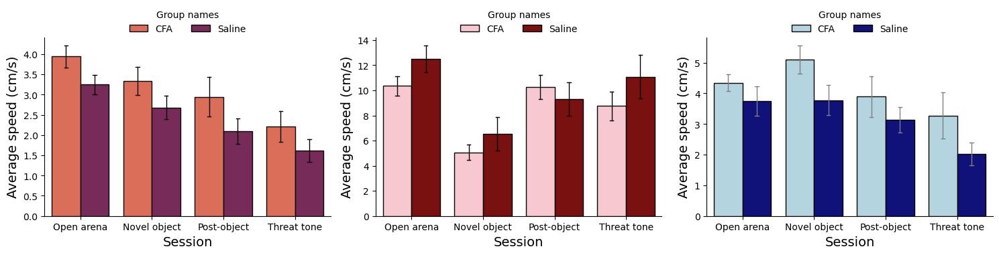

Total distance
Total distance
Total distance


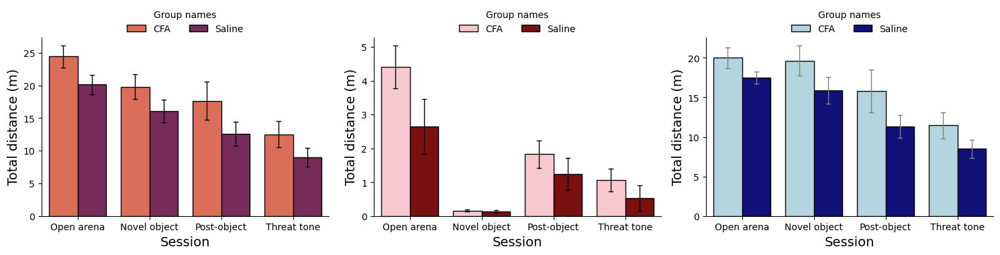

Distance to centre
Distance to centre
Distance to centre


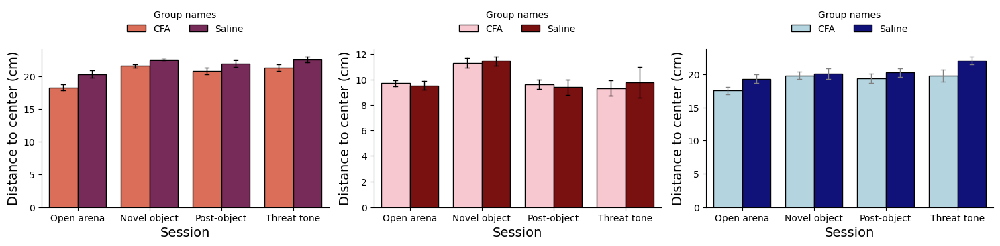

Time spent inside/outside centre area
Time spent inside/outside centre area
Time spent inside/outside centre area


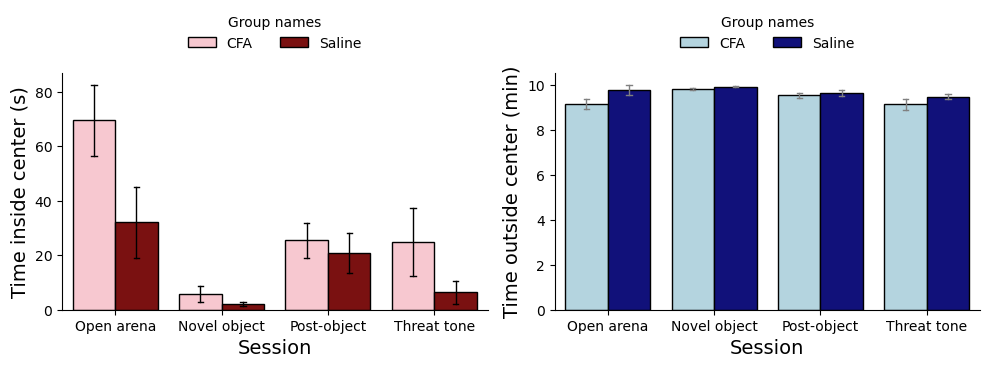

Nr of trials
Nr of trials
Nr of trials


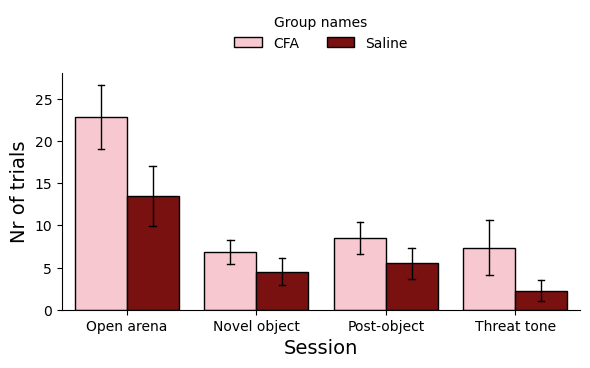

In [161]:
def session_label_adder(df, label): 
    df = df.copy()
    session_label = [label for x in range(len(df))]
    df["session"] = session_label
    
    return df


threat_session_df_list = []
for epoch in object_result_dict: 
    object_result_dict[epoch]["total_df"] = session_label_adder(object_result_dict[epoch]["total_df"], epoch)
    threat_session_df_list.append(object_result_dict[epoch]["total_df"])

threat_session_df = pd.concat(threat_session_df_list, ignore_index=True)


print("Average speed")
print("Average speed")
print("Average speed")

fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (15, 4))
x_tick_labels = ["Open arena", "Novel object", "Post-object", "Threat tone"]
ylabel = "Average speed (cm/s)"

sns.barplot(data = threat_session_df, x = "session", y = "average_speed_total", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "black", errwidth = 1, 
            edgecolor = "black", palette = "rocket_r", ax = ax[0])
sns.despine(top=True, right=True, ax = ax[0])
ax[0].set_xticklabels(x_tick_labels)
ax[0].set_xlabel("Session", fontsize = 14)
ax[0].set_ylabel(ylabel, fontsize = 14)
ax[0].legend(loc='upper center',bbox_to_anchor=(0.5, 1.20), frameon=False, ncol = 2, title = "Group names")

sns.barplot(data = threat_session_df, x = "session", y = "in_average_speed_total", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "black", errwidth = 1, 
            edgecolor = "black", palette = ["pink", "darkred"], ax = ax[1])
sns.despine(top=True, right=True, ax = ax[1])
ax[1].set_xticklabels(x_tick_labels)
ax[1].set_xlabel("Session", fontsize = 14)
ax[1].set_ylabel(ylabel, fontsize = 14)
ax[1].legend(loc='upper center',bbox_to_anchor=(0.5, 1.20), frameon=False, ncol = 2, title = "Group names")

sns.barplot(data = threat_session_df, x = "session", y = "out_average_speed_total", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "gray", errwidth = 1, 
            edgecolor = "black", palette = ["lightblue", "darkblue"], ax = ax[2])
sns.despine(top=True, right=True, ax = ax[2])
ax[2].set_xticklabels(x_tick_labels)
ax[2].set_xlabel("Session", fontsize = 14)
ax[2].set_ylabel(ylabel, fontsize = 14)
ax[2].legend(loc='upper center',bbox_to_anchor=(0.5, 1.20), frameon=False, ncol = 2, title = "Group names")


plt.tight_layout()
plt.show()

print ("Total distance")
print ("Total distance")
print ("Total distance")

fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (15, 4))
x_tick_labels = ["Open arena", "Novel object", "Post-object", "Threat tone"]
ylabel = "Total distance (m)"

sns.barplot(data = threat_session_df, x = "session", y = "distance_total", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "black", errwidth = 1, 
            edgecolor = "black", palette = "rocket_r", ax = ax[0])
sns.despine(top=True, right=True, ax = ax[0])
ax[0].set_xticklabels(x_tick_labels)
ax[0].set_xlabel("Session", fontsize = 14)
ax[0].set_ylabel(ylabel, fontsize = 14)
ax[0].legend(loc='upper center',bbox_to_anchor=(0.5, 1.20), frameon=False, ncol = 2, title = "Group names")

sns.barplot(data = threat_session_df, x = "session", y = "in_distance_total", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "black", errwidth = 1, 
            edgecolor = "black", palette = ["pink", "darkred"], ax = ax[1])
sns.despine(top=True, right=True, ax = ax[1])
ax[1].set_xticklabels(x_tick_labels)
ax[1].set_xlabel("Session", fontsize = 14)
ax[1].set_ylabel(ylabel, fontsize = 14)
ax[1].legend(loc='upper center',bbox_to_anchor=(0.5, 1.20), frameon=False, ncol = 2, title = "Group names")

sns.barplot(data = threat_session_df, x = "session", y = "out_distance_total", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "gray", errwidth = 1, 
            edgecolor = "black", palette = ["lightblue", "darkblue"], ax = ax[2])
sns.despine(top=True, right=True, ax = ax[2])
ax[2].set_xticklabels(x_tick_labels)
ax[2].set_xlabel("Session", fontsize = 14)
ax[2].set_ylabel(ylabel, fontsize = 14)
ax[2].legend(loc='upper center',bbox_to_anchor=(0.5, 1.20), frameon=False, ncol = 2, title = "Group names")


plt.tight_layout()
plt.show()

print("Distance to centre")
print("Distance to centre")
print("Distance to centre")

fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (15, 4))
x_tick_labels = ["Open arena", "Novel object", "Post-object", "Threat tone"]
ylabel = "Distance to center (cm)"

sns.barplot(data = threat_session_df, x = "session", y = "average_distance_to_center", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "black", errwidth = 1, 
            edgecolor = "black", palette = "rocket_r", ax = ax[0])
sns.despine(top=True, right=True, ax = ax[0])
ax[0].set_xticklabels(x_tick_labels)
ax[0].set_xlabel("Session", fontsize = 14)
ax[0].set_ylabel(ylabel, fontsize = 14)
ax[0].legend(loc='upper center',bbox_to_anchor=(0.5, 1.30), frameon=False, ncol = 2, title = "Group names")

sns.barplot(data = threat_session_df, x = "session", y = "in_average_distance_to_center", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "black", errwidth = 1, 
            edgecolor = "black", palette = ["pink", "darkred"], ax = ax[1])
sns.despine(top=True, right=True, ax = ax[1])
ax[1].set_xticklabels(x_tick_labels)
ax[1].set_xlabel("Session", fontsize = 14)
ax[1].set_ylabel(ylabel, fontsize = 14)
ax[1].legend(loc='upper center',bbox_to_anchor=(0.5, 1.30), frameon=False, ncol = 2, title = "Group names")

sns.barplot(data = threat_session_df, x = "session", y = "out_average_distance_to_center", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "gray", errwidth = 1, 
            edgecolor = "black", palette = ["lightblue", "darkblue"], ax = ax[2])
sns.despine(top=True, right=True, ax = ax[2])
ax[2].set_xticklabels(x_tick_labels)
ax[2].set_xlabel("Session", fontsize = 14)
ax[2].set_ylabel(ylabel, fontsize = 14)
ax[2].legend(loc='upper center',bbox_to_anchor=(0.5, 1.30), frameon=False, ncol = 2, title = "Group names")


plt.tight_layout()
plt.show()

print("Time spent inside/outside centre area")
print("Time spent inside/outside centre area")
print("Time spent inside/outside centre area")

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
x_tick_labels = ["Open arena", "Novel object", "Post-object", "Threat tone"]
ylabel = ""

sns.barplot( x = threat_session_df["session"], y = threat_session_df["in_time_total"]*60, hue = threat_session_df["group_names"], 
            errorbar = "se", capsize=0.05, errcolor = "black", errwidth = 1, 
            edgecolor = "black", palette = ["pink", "darkred"], ax = ax[0])
sns.despine(top=True, right=True, ax = ax[0])
ax[0].set_xticklabels(x_tick_labels)
ax[0].set_xlabel("Session", fontsize = 14)
ax[0].set_ylabel("Time inside center (s)", fontsize = 14)
ax[0].legend(loc='upper center',bbox_to_anchor=(0.5, 1.30), frameon=False, ncol = 2, title = "Group names")

sns.barplot(data = threat_session_df, x = "session", y = "out_time_total", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "gray", errwidth = 1, 
            edgecolor = "black", palette = ["lightblue", "darkblue"], ax = ax[1])
sns.despine(top=True, right=True, ax = ax[1])
ax[1].set_xticklabels(x_tick_labels)
ax[1].set_xlabel("Session", fontsize = 14)
ax[1].set_ylabel("Time outside center (min)", fontsize = 14)
ax[1].legend(loc='upper center',bbox_to_anchor=(0.5, 1.30), frameon=False, ncol = 2, title = "Group names")


plt.tight_layout()
plt.show()

print("Nr of trials")
print("Nr of trials")
print("Nr of trials")

fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (6, 4))
x_tick_labels = ["Open arena", "Novel object", "Post-object", "Threat tone"]
ylabel = ""

sns.barplot(data = threat_session_df, x = "session", y = "in_nr_of_trials", hue = "group_names", 
            errorbar = "se", capsize=0.05, errcolor = "black", errwidth = 1, 
            edgecolor = "black", palette = ["pink", "darkred"], ax = ax)
sns.despine(top=True, right=True, ax = ax)
ax.set_xticklabels(x_tick_labels)
ax.set_xlabel("Session", fontsize = 14)
ax.set_ylabel("Nr of trials", fontsize = 14)
ax.legend(loc='upper center',bbox_to_anchor=(0.5, 1.30), frameon=False, ncol = 2, title = "Group names")
# ax.set_ylim(0, 1.4)



plt.tight_layout()
plt.show()

## Heatmaps for XY coordinates of all mice

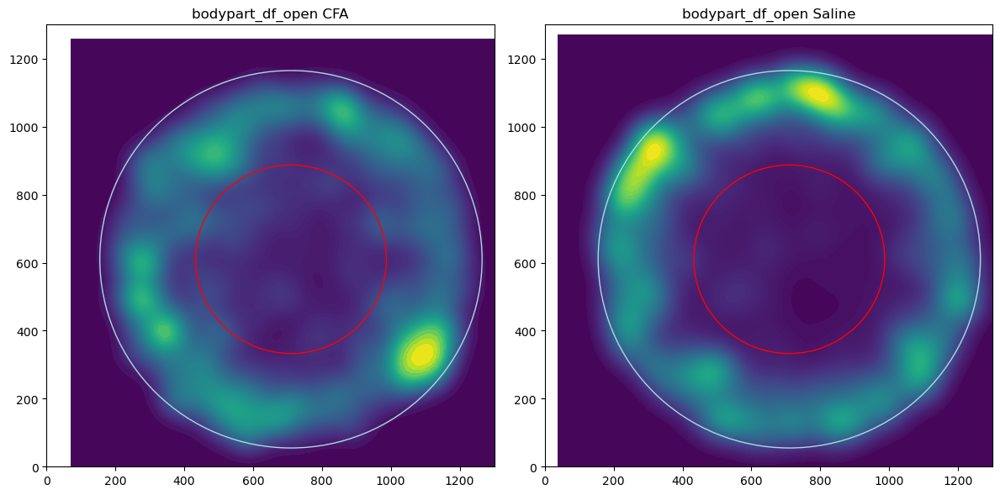

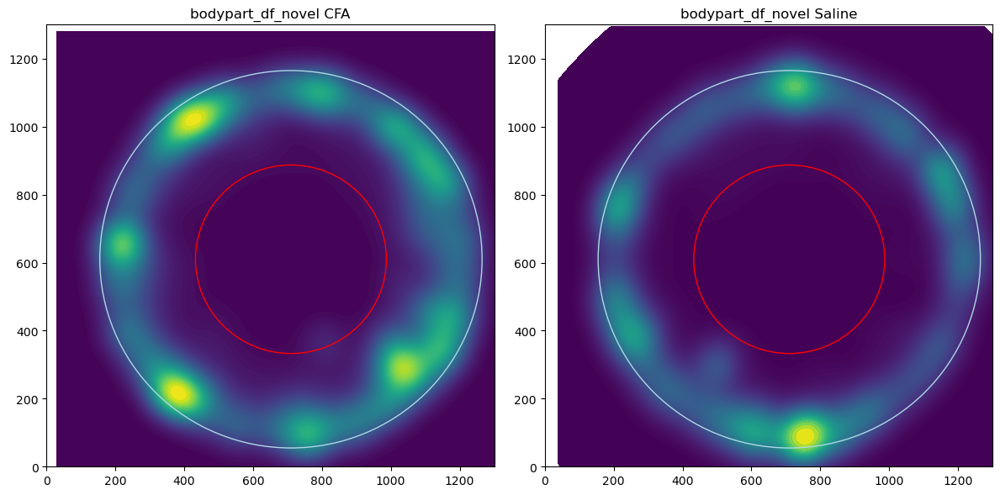

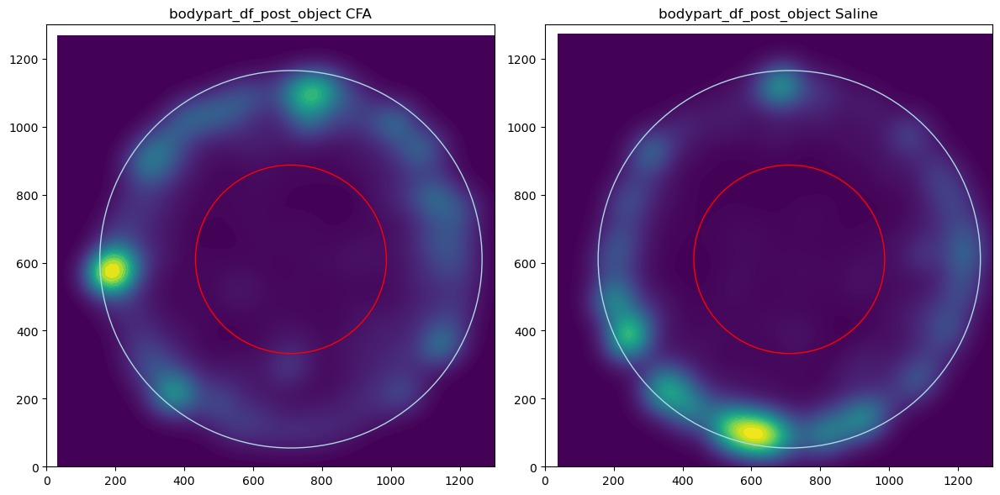

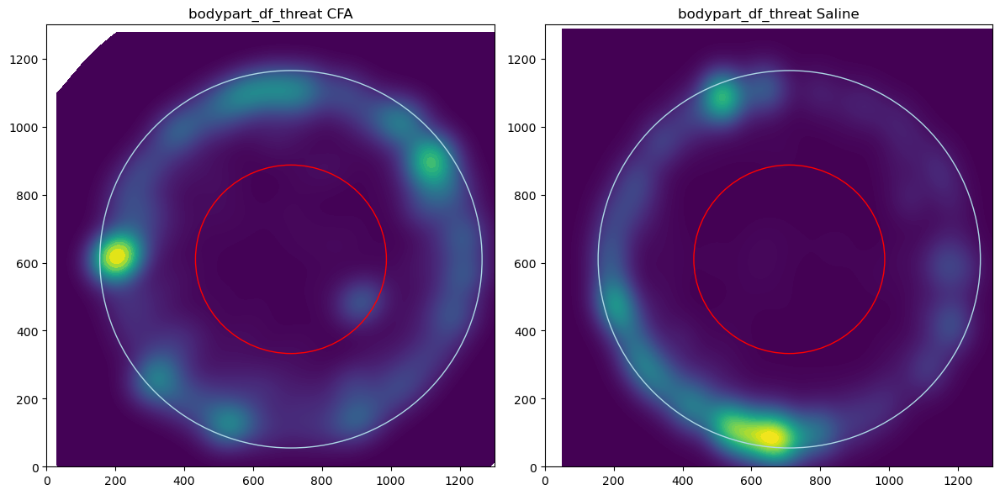

In [162]:
for epoch in object_result_dict: 
    
    center_x = 710
    center_y = 610
    radius_og = 555
    radius_small = 277.2
    fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))

    circle1_CFA = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
    circle3_CFA = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

    sns.kdeplot(x=object_result_dict[epoch]["X_Y_coordinates_allmice"]["CFA"]["x"],
                y=object_result_dict[epoch]["X_Y_coordinates_allmice"]["CFA"]["y"],
                cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[0])
    ax[0].set_ylim(0,1300)
    ax[0].set_xlim(0,1300)
    ax[0].set_title(epoch + " CFA")
    ax[0].add_patch(circle1_CFA)
    ax[0].add_patch(circle3_CFA)

    circle1_Saline = plt.Circle((center_x, center_y), radius_og, color='lightblue', fill=False, label = "arena") 
    circle3_Saline = plt.Circle((center_x, center_y), radius_small, color='red', fill=False, label = "selected area") 

    sns.kdeplot(x=object_result_dict[epoch]["X_Y_coordinates_allmice"]["Saline"]["x"],
                y=object_result_dict[epoch]["X_Y_coordinates_allmice"]["Saline"]["y"],
                cmap='viridis', fill=True, thresh=0, levels=100, ax = ax[1])
    ax[1].set_title(epoch + " Saline")
    ax[1].set_ylim(0,1300)
    ax[1].set_xlim(0,1300)
    ax[1].add_patch(circle1_Saline)
    ax[1].add_patch(circle3_Saline)

    plt.tight_layout()
    plt.show()

## KDE plots for bodypart distance to centre

### Comparison: CFA vs Saline across the different subsessions 

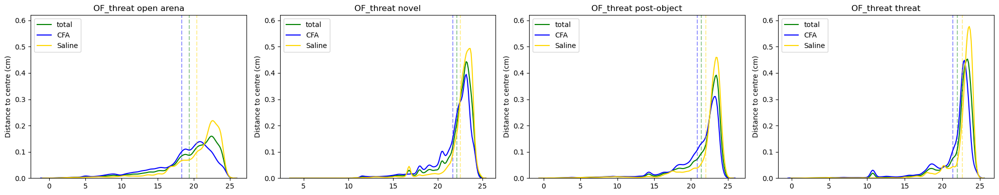

In [164]:
color_dict = {"total": "green", "CFA": "blue", "Saline": "#FFD700"}

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 4))


sns.kdeplot(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["total"], color=color_dict["total"], label="total", ax=ax[0])
object_mean_total = np.mean(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["total"])
ax[0].axvline(object_mean_total, color=color_dict["total"], linestyle='--', alpha=0.4)

sns.kdeplot(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["CFA"], color=color_dict["CFA"], label="CFA", ax=ax[0])
object_mean_g1 = np.mean(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["CFA"])
ax[0].axvline(object_mean_g1, color=color_dict["CFA"], linestyle='--', alpha=0.4)

sns.kdeplot(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["Saline"], color=color_dict["Saline"], label="Saline", ax=ax[0])
object_mean_g2 = np.mean(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["Saline"])
ax[0].axvline(object_mean_g2, color=color_dict["Saline"], linestyle='--', alpha=0.4)
ax[0].set_title("OF_threat open arena")
ax[0].legend(loc="upper left")
ax[0].set_ylim(0, 0.62)
ax[0].set_ylabel("Distance to centre (cm)")

sns.kdeplot(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["total"], color=color_dict["total"], label="total", ax=ax[1])
object_mean_total = np.mean(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["total"])
ax[1].axvline(object_mean_total, color=color_dict["total"], linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["CFA"], color=color_dict["CFA"], label="CFA", ax=ax[1])
object_mean_g1 = np.mean(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["CFA"])
ax[1].axvline(object_mean_g1, color=color_dict["CFA"], linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["Saline"], color=color_dict["Saline"], label="Saline", ax=ax[1])
object_mean_g2 = np.mean(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["Saline"])
ax[1].axvline(object_mean_g2, color=color_dict["Saline"], linestyle='--', alpha=0.4)
ax[1].set_title("OF_threat novel")
ax[1].legend(loc="upper left")
ax[1].set_ylim(0, 0.62)
ax[1].set_ylabel("Distance to centre (cm)")


sns.kdeplot(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["total"], color=color_dict["total"], label="total", ax=ax[2])
object_mean_total = np.mean(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["total"])
ax[2].axvline(object_mean_total, color=color_dict["total"], linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["CFA"], color=color_dict["CFA"], label="CFA", ax=ax[2])
object_mean_g1 = np.mean(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["CFA"])
ax[2].axvline(object_mean_g1, color=color_dict["CFA"], linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["Saline"], color=color_dict["Saline"], label="Saline", ax=ax[2])
object_mean_g2 = np.mean(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["Saline"])
ax[2].axvline(object_mean_g2, color=color_dict["Saline"], linestyle='--', alpha=0.4)
ax[2].set_title("OF_threat post-object")
ax[2].legend(loc="upper left")
ax[2].set_ylim(0, 0.62)
ax[2].set_ylabel("Distance to centre (cm)")

sns.kdeplot(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["total"], color=color_dict["total"], label="total", ax=ax[3])
object_mean_total = np.mean(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["total"])
ax[3].axvline(object_mean_total, color=color_dict["total"], linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["CFA"], color=color_dict["CFA"], label="CFA", ax=ax[3])
object_mean_g1 = np.mean(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["CFA"])
ax[3].axvline(object_mean_g1, color=color_dict["CFA"], linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["Saline"], color=color_dict["Saline"], label="Saline", ax=ax[3])
object_mean_g2 = np.mean(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["Saline"])
ax[3].axvline(object_mean_g2, color=color_dict["Saline"], linestyle='--', alpha=0.4)
ax[3].set_title("OF_threat threat")
ax[3].legend(loc="upper left")
ax[3].set_ylim(0, 0.62)
ax[3].set_ylabel("Distance to centre (cm)")


plt.tight_layout()
plt.show()

### Within group differences between the different subsessions

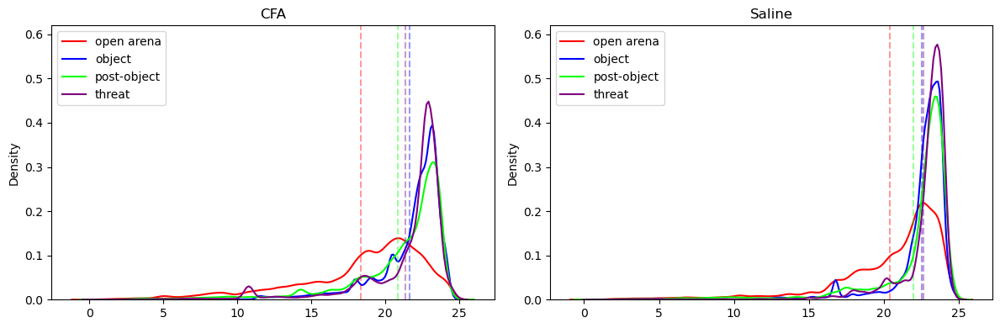

In [165]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))


sns.kdeplot(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["CFA"], color="#FF0000", label="open arena", ax=ax[0])
object_mean_open = np.mean(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["CFA"])
ax[0].axvline(object_mean_open, color="#FF0000", linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["CFA"], color="#0000FF", label="object", ax=ax[0])
object_mean_object = np.mean(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["CFA"])
ax[0].axvline(object_mean_object, color="#0000FF", linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["CFA"], color="#00FF00", label="post-object", ax=ax[0])
object_mean_object = np.mean(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["CFA"])
ax[0].axvline(object_mean_object, color="#00FF00", linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["CFA"], color="#800080", label="threat", ax=ax[0])
object_mean_object = np.mean(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["CFA"])
ax[0].axvline(object_mean_object, color="#800080", linestyle='--', alpha=0.4)


ax[0].set_title("CFA")
ax[0].legend(loc="upper left")
ax[0].set_ylim(0, 0.62)


sns.kdeplot(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["Saline"], color="#FF0000", label="open arena", ax=ax[1])
object_mean_open = np.mean(result_dict["nov2023"]["sessions"]["OF_threat"]["distance_to_center_allmice"]["Saline"])
ax[1].axvline(object_mean_open, color="#FF0000", linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["Saline"], color="#0000FF", label="object", ax=ax[1])
object_mean_object = np.mean(object_result_dict["bodypart_df_novel"]["distance_to_center_allmice"]["Saline"])
ax[1].axvline(object_mean_object, color="#0000FF", linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["Saline"], color="#00FF00", label="post-object", ax=ax[1])
object_mean_object = np.mean(object_result_dict["bodypart_df_post_object"]["distance_to_center_allmice"]["Saline"])
ax[1].axvline(object_mean_object, color="#00FF00", linestyle='--', alpha=0.4)

sns.kdeplot(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["Saline"], color="#800080", label="threat", ax=ax[1])
object_mean_object = np.mean(object_result_dict["bodypart_df_threat"]["distance_to_center_allmice"]["Saline"])
ax[1].axvline(object_mean_object, color="#800080", linestyle='--', alpha=0.4)

ax[1].set_title("Saline")
ax[1].legend(loc="upper left")
ax[1].set_ylim(0, 0.62)


plt.tight_layout()
plt.show()

# Novel object approach number analysis

In [169]:
object_approach_df = pd.read_csv("/Users/annam/Desktop/Rotation1/object_approach_csv.csv")
Group_names = []

for mouse in object_approach_df["Mouse_ID"]:
    if mouse in data_dict["nov2023"]["Groups"]["CFA"]: 
        Group_names.append("CFA")
    elif mouse in data_dict["nov2023"]["Groups"]["Saline"]: 
        Group_names.append("Saline")
        
object_approach_df["Group_names"] = Group_names
Total_approaches = [object_approach_df.loc[object_approach_df["Mouse_ID"] == mouse]["Object_approaches"].sum() for mouse in mouse_list_nov]

Group_names = ["CFA" if mouse in  data_dict["nov2023"]["Groups"]["CFA"] else "Saline" for mouse in mouse_list_nov]
total_approach_dict = {"Mouse_ID": mouse_list_nov, "Group_names":Group_names, "Total_approaches": Total_approaches}
total_approach_df = pd.DataFrame(total_approach_dict)

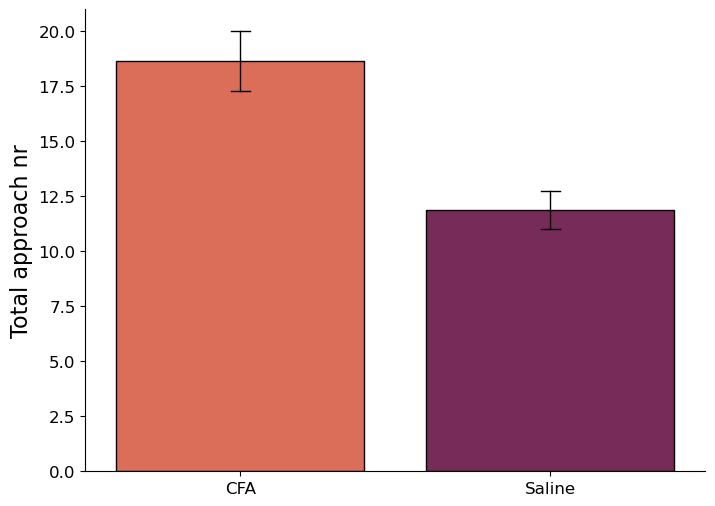

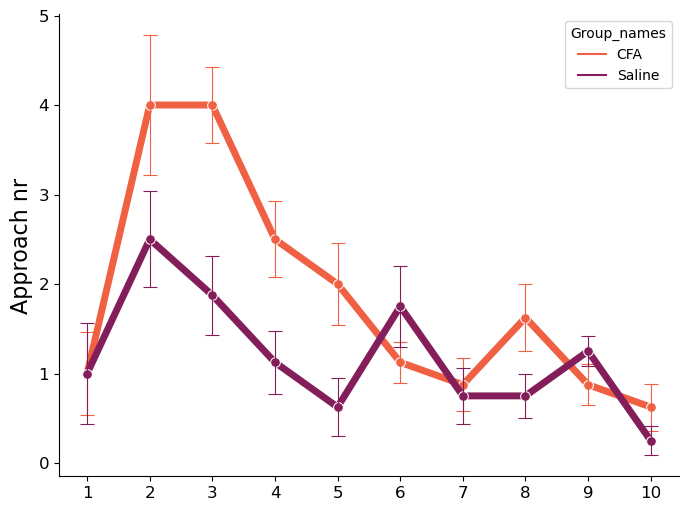

In [170]:
fig, ax = plt.subplots(figsize = (8, 6))

sns.barplot(data = total_approach_df, x = "Group_names", y = "Total_approaches", palette = "rocket_r", errorbar = "se", capsize=0.06, 
                errcolor = "black", errwidth = 1, edgecolor = "black", ax = ax)
sns.despine(top=True, right=True, ax = ax)
ax.set_ylabel("Total approach nr", fontsize = 16)
ax.set_xlabel("", fontsize = 16)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='x', labelsize=12)
plt.show()

fig, ax = plt.subplots(figsize = (8, 6))

sns.lineplot(data = object_approach_df, x = "Until_minute", y = "Object_approaches", palette = "rocket_r", errorbar = "se", ax = ax, err_style = "bars", 
             err_kws={"capsize": 5, "linewidth": 0.8, "capthick": 0.8},  hue = "Group_names", hue_order = ["CFA", "Saline"], markers=True, marker='o', 
                     markersize=7, linewidth = 5)
sns.despine(top=True, right=True, ax = ax)
ax.set_ylabel("Approach nr", fontsize = 16)
ax.set_xlabel("Interval end time", fontsize = 20)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='x', labelsize=12)
ax.xaxis.set_major_locator(MultipleLocator(1))
ax.set_xlabel("")
plt.show()


# Writing csv files of total_df for each session 

## Notes on data storage: 
- Make folder for deposition of csv files (e.g., STATS)
- Within main folder, make folders for total_dfs and interval_dfs (e.g., STATS/interval_df)


In [172]:
path = "/Users/annam/Desktop/Rotation1/STATS/"

for date in data_dict: 
    print(date)
    for session in data_dict[date]["sessions"]: 
        print(session)
        
        csv_name_total_df = path + "total_df/" + date + "_" + session + "_total_df"
        total_df = result_dict[date]["sessions"][session]["total_df"]
        total_df.to_csv(csv_name_total_df, index=False)
        
        csv_name_interval_df = path + "interval_df/" + date + "_" + session + "_interval_df"
        interval_df = result_dict[date]["sessions"][session]["interval_df"]
        interval_df.to_csv(csv_name_interval_df, index=False)

            
            

nov2023
OF_reg
OF_threat
aug2022
habituation
experiment


# Writing csv files of interval_df for each session 

In [173]:
path = "/Users/annam/Desktop/Rotation1/STATS/"
epochs = ["bodypart_df_novel", "bodypart_df_post_object", "bodypart_df_threat"]
session = "OF_threat"
date = "nov2023"

for epoch in epochs: 
    print(epoch)
    
    csv_name_total_df = path + "total_df/" + date + "_" + session + "_" + epoch + "_total_df"
    total_df = object_result_dict[epoch]["total_df"]
        
    total_df.to_csv(csv_name_total_df, index=False)

    csv_name_interval_df = path + "interval_df/" + date + "_" + session + "_" + epoch + "_interval_df"
    interval_df = object_result_dict[epoch]["interval_df"]
    interval_df.to_csv(csv_name_interval_df, index=False)




bodypart_df_novel
bodypart_df_post_object
bodypart_df_threat


# Miscellanious plotting

## Plotting variable (e.g., distance to centre) across time for individual mice of a specific session (e.g., OF_reg)
- CFA mice in first column
- Saline mice in second column

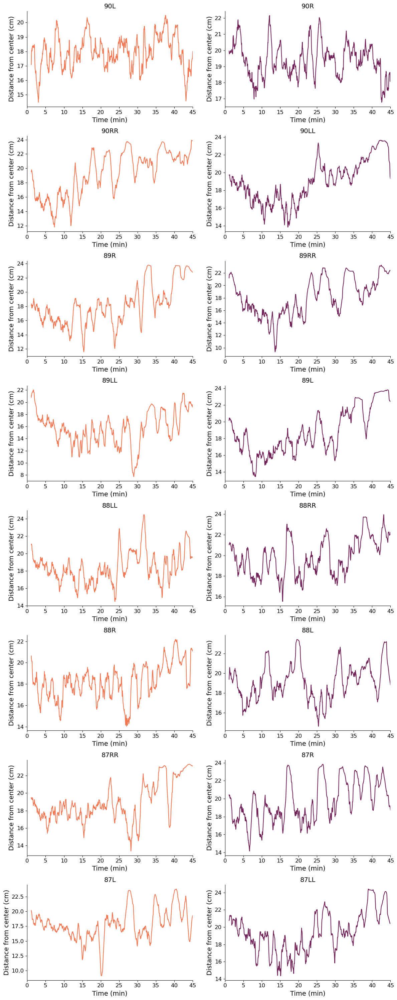

In [171]:
#OF_reg - distance to centre
smooth_window = 2000
fig, ax = plt.subplots(ncols = 2, nrows = 8, figsize = (12,30))


for i, mouse in enumerate(data_dict["nov2023"]["Groups"]["CFA"]): 
    df = result_dict["nov2023"]["sessions"]["OF_reg"]["mouse_dict"][mouse]["bodypart_df"]
    sns.lineplot(x = df["timestamp_min"], y = df["distance_from_center"].rolling(smooth_window).mean(), color = "#f37651", ax = ax[i, 0])
    sns.despine(top=True, right=True, ax = ax[i, 0])
    ax[i, 0].set_title(mouse, fontsize = 14)
    ax[i, 0].set_ylabel("Distance from center (cm)", fontsize = 14)
    ax[i, 0].set_xlabel("Time (min)", fontsize = 14)
    ax[i, 0].set_xlim(0, 45)
    ax[i, 0].tick_params(axis='y', labelsize=12)
    ax[i, 0].tick_params(axis='x', labelsize=12)
    ax[i, 0].xaxis.set_major_locator(MultipleLocator(5))

for i, mouse in enumerate(data_dict["nov2023"]["Groups"]["Saline"]): 
    df = result_dict["nov2023"]["sessions"]["OF_reg"]["mouse_dict"][mouse]["bodypart_df"]
    sns.lineplot(x = df["timestamp_min"], y = df["distance_from_center"].rolling(smooth_window).mean(), color = "#701f57", ax = ax[i, 1])
    sns.despine(top=True, right=True, ax = ax[i, 1])
    ax[i, 1].set_title(mouse, fontsize = 14)
    ax[i, 1].set_ylabel("Distance from center (cm)", fontsize = 14)
    ax[i, 1].set_xlabel("Time (min)", fontsize = 14)
    ax[i, 1].set_xlim(0, 45)
    ax[i, 1].tick_params(axis='y', labelsize=12)
    ax[i, 1].tick_params(axis='x', labelsize=12)
    ax[i, 1].xaxis.set_major_locator(MultipleLocator(5))
    
plt.tight_layout()
plt.show()

    
